In [1]:
import json
import numpy as np
import pandas as pd
from pathlib import Path
import os
import sys
import warnings
from utils import *
import matplotlib.pyplot as plt
import seaborn as sns

warnings.simplefilter('ignore')

sys.path.append('../../utilities')
sys.path.append('../../models/grt123')
sys.path.append('../../models/grt123/training')
sys.path.append('../../models/grt123/preprocessing/')

# from layers import nms,iou
from summit_utils import SummitScan, xyz2irc
from evaluation import noduleCADEvaluation

workspace_path = Path(os.getcwd()).parent.parent


In [2]:
flavour = 'test_balanced'

# Scan Metadata

In [3]:

def set_is_actionable(row):
    if row['radiology_report_management_plan_final'] in ['3_MONTH_FOLLOW_UP_SCAN','URGENT_REFERRAL', 'ALWAYS_SCAN_AT_YEAR_1']:
        return 'Actonable'
    else:
        return 'Non-Actionable'

def set_smoking_pack_years_cats(df):
    df[df['smoking_pack_years'] < 0] = np.nan
    return pd.qcut(df['smoking_pack_years'], 3, labels=['Low (15-35)', 'Medium (35-50)', 'High (50+)'])

person_data = pd.read_csv(
    f'{workspace_path}/data/summit/data/person_data.csv',
    usecols=['LDCT_RADIOLOGY_REPORT_main_participant_id', 'lung_health_check_clinical_smoking_pack_years', 'ocd_DeprivationScore_IMDRank']
).rename(columns={
    'lung_health_check_clinical_smoking_pack_years':'smoking_pack_years',
    'ocd_DeprivationScore_IMDRank':'deprivation_score'
}).assign(
    smoking_pack_years_cats=lambda df: set_smoking_pack_years_cats(df),
    IMDRank_tertile=lambda df: pd.qcut(df['deprivation_score'], 3, labels=['Low', 'Medium', 'High']),
    IMDRank_quintile=lambda df: pd.qcut(df['deprivation_score'], 5, labels=['Low', 'Low-Medium', 'Medium', 'Medium-High', 'High']),
)
                          
scan_metadata = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans_metadata.csv')
    .assign(name=lambda df: df['LDCT_RADIOLOGY_REPORT_main_participant_id'] + '_Y0_BASELINE_A')
    .assign(is_actionable=lambda df: df.apply(set_is_actionable, axis=1))
    .assign(gender_is_actionable=lambda df: df.apply(set_gender_is_actionable, axis=1))    
    .assign(gender_is_not_actionable=lambda df: df.apply(set_gender_is_not_actionable, axis=1))    
    .assign(ethnic_group_is_actionable=lambda df: df.apply(set_ethnic_group_is_actionable, axis=1))    
    .assign(ethnic_group_is_not_actionable=lambda df: df.apply(set_ethnic_group_is_not_actionable, axis=1))    
    .rename(columns={
        'participant_details_gender':'gender',
        'lung_health_check_demographics_race_ethnicgroup':'ethnic_group'
    })
).merge(person_data, on='LDCT_RADIOLOGY_REPORT_main_participant_id')
scan_metadata = (
    scan_metadata
    .assign(smoking_pack_years_is_actionable=lambda df: df.apply(set_smoking_pack_years_is_actionable, axis=1))
    .assign(imdrank_is_actionable=lambda df: df.apply(set_imdrank_is_actionable, axis=1))    
)

In [4]:

for col in scan_metadata.columns:
    if col.lower().find('age')>-1:
        print(col)

radiology_report_management_plan_algorithm_recommendation
radiology_report_management_plan_final
radiology_report_management_plan_recommendation_comment
participant_details_age
lung_health_check_smoking_cigarillos_start_age
lung_health_check_smoking_cigarillos_stop_age
lung_health_check_smoking_cigars_start_age
lung_health_check_smoking_cigars_stop_age
lung_health_check_smoking_history_age_started_smoking
lung_health_check_smoking_history_age_stopped_smoking
lung_health_check_smoking_marijuana_start_age
lung_health_check_smoking_marijuana_stop_age
lung_health_check_smoking_pipe_start_age
lung_health_check_smoking_pipe_stop_age
lung_health_check_smoking_waterpipe_start_age
lung_health_check_smoking_waterpipe_stop_age
participant_age_at_consent
participant_age_at_consent_cats


## GRT123

NOT-UPPER       290
UPPER           258
NOT_ANSWERED    151
Name: nodule_site_combined, dtype: int64

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/test_balanced/test_balanced_metadata.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:15<00:00, 64.85it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced directory


,0,159,476,1111,2381,4920,9999
0,0.151 (0.117 - 0.189),0.208 (0.171 - 0.248),0.292 (0.247 - 0.341),0.42 (0.371 - 0.473),0.562 (0.508 - 0.613),0.723 (0.681 - 0.765),0.819 (0.787 - 0.849)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.151,0.117,0.189
159,0.250,0.208,0.171,0.248
476,0.500,0.292,0.247,0.341
1111,1.000,0.420,0.371,0.473
2381,2.000,0.562,0.508,0.613
4920,4.000,0.723,0.681,0.765
9999,8.000,0.819,0.787,0.849


Mean Sensitivity: 0.45 Low Sensitivity: 0.41 High Sensitivity: 0.497


,True positives,622
0,False positives,12548.000
1,False negatives,77.000
2,True negatives,0.000
3,Total number of candidates,13189.000
4,Total number of nodules,699.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,20.000
7,Sensitivity,0.890
8,Average number of candidates per scan,22.166


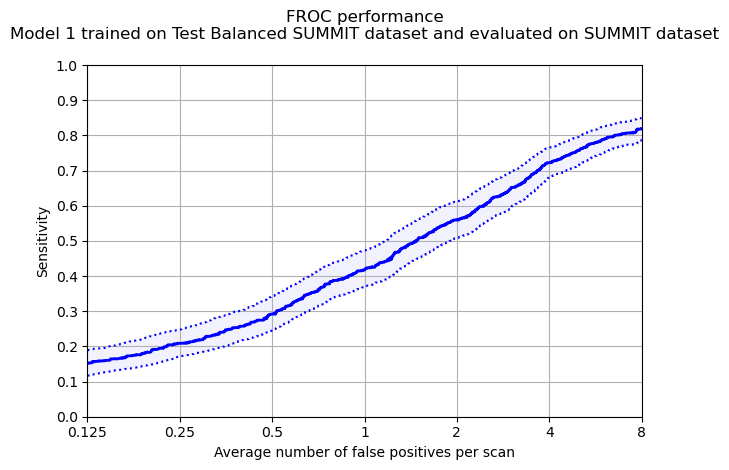

In [5]:
# Add in diameter cuts for later analysis
def combine_site(nodule_site):
    if nodule_site.find('UPPER') > -1:
        return 'UPPER'
    elif nodule_site.find('NOT') > -1:
        return 'NOT_ANSWERED'
    else:
        return 'NOT-UPPER'
    
def combine_site2(nodule_site):
    if nodule_site.find('RIGHT') > -1:
        return 'RIGHT'
    elif nodule_site.find('LEFT') > -1:
        return 'LEFT'
    else:
        return 'NOT_ANSWERED'

diameter_cats = [0, 6, 8, 30, 40, 999]
diameter_lbs = [
    '0-6mm',
    '6-8mm',
    '8-30mm',
    '30-40mm',
    '40+mm'
]

annotations = (
    pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    .assign(diameter_cats=lambda df: 
        pd.cut(
            df['nodule_diameter_mm'], 
            bins=diameter_cats,
            labels=diameter_lbs
        )            
    )
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

display(annotations.nodule_site_combined.value_counts())

# save back to the metadata file
annotations.to_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv', index=False)
grt123_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    results_filename=f"{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv",    
    filter='\nModel 1 trained on Test Balanced SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/froc_{flavour}_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/CADAnalysis.txt')

<Axes: >

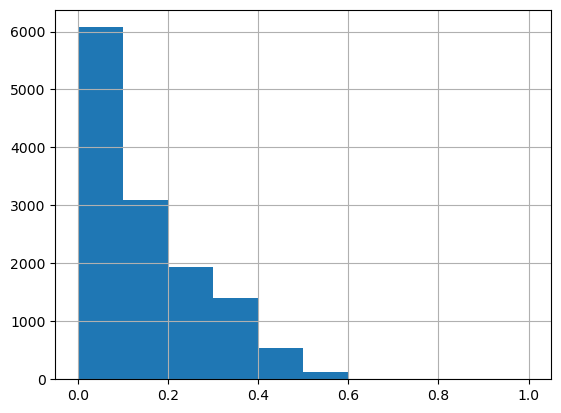

In [14]:
predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv', usecols=['name', 'col', 'row', 'index', 'diameter', 'threshold'])

predictions['threshold_normalized'] = (predictions['threshold'] - predictions['threshold'].min()) / (predictions['threshold'].max() - predictions['threshold'].min())
predictions['threshold_normalized'].hist()

### Gender analysis

Protected Group: MALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,56.0,2.0,7.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpezw0bc2u/annotations.csv
Total number of included nodule annotations: 396
Total number of nodule annotations: 396
Cases: 342


100%|██████████| 1000/1000 [00:10<00:00, 98.93it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/gender/MALE directory


,0,159,476,1111,2381,4920,9999
0,0.13 (0.09 - 0.189),0.193 (0.138 - 0.254),0.265 (0.21 - 0.325),0.397 (0.331 - 0.473),0.533 (0.462 - 0.61),0.707 (0.64 - 0.773),0.824 (0.778 - 0.867)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.130,0.090,0.189
159,0.250,0.193,0.138,0.254
476,0.500,0.265,0.210,0.325
1111,1.000,0.397,0.331,0.473
2381,2.000,0.533,0.462,0.610
4920,4.000,0.707,0.640,0.773
9999,8.000,0.824,0.778,0.867


Mean Sensitivity: 0.44 Low Sensitivity: 0.38 High Sensitivity: 0.499


,True positives,356
0,False positives,7888.000
1,False negatives,40.000
2,True negatives,0.000
3,Total number of candidates,8256.000
4,Total number of nodules,396.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,12.000
7,Sensitivity,0.899
8,Average number of candidates per scan,24.140


Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,52.0,5.0,7.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp63e09d6c/annotations.csv
Total number of included nodule annotations: 299
Total number of nodule annotations: 299
Cases: 251
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:05<00:00, 190.70it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/gender/FEMALE directory


,0,159,476,1111,2381,4920,9999
0,0.179 (0.129 - 0.243),0.237 (0.179 - 0.307),0.343 (0.285 - 0.41),0.452 (0.384 - 0.529),0.605 (0.528 - 0.684),0.734 (0.679 - 0.793),0.816 (0.769 - 0.864)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.179,0.129,0.243
159,0.250,0.237,0.179,0.307
476,0.500,0.343,0.285,0.410
1111,1.000,0.452,0.384,0.529
2381,2.000,0.605,0.528,0.684
4920,4.000,0.734,0.679,0.793
9999,8.000,0.816,0.769,0.864


Mean Sensitivity: 0.48 Low Sensitivity: 0.42 High Sensitivity: 0.547


,True positives,262
0,False positives,4626.000
1,False negatives,37.000
2,True negatives,0.000
3,Total number of candidates,4895.000
4,Total number of nodules,299.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.876
8,Average number of candidates per scan,19.502


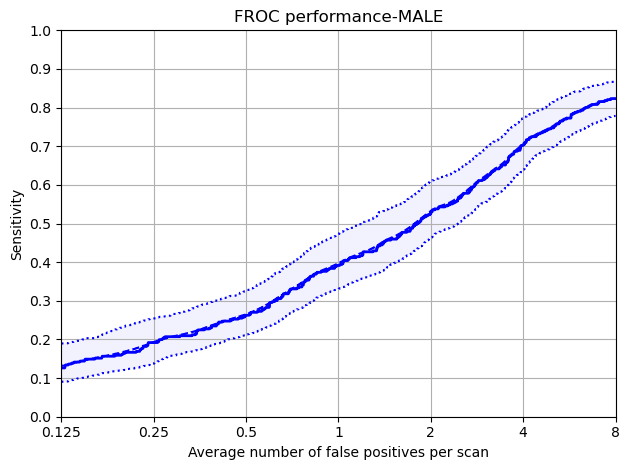

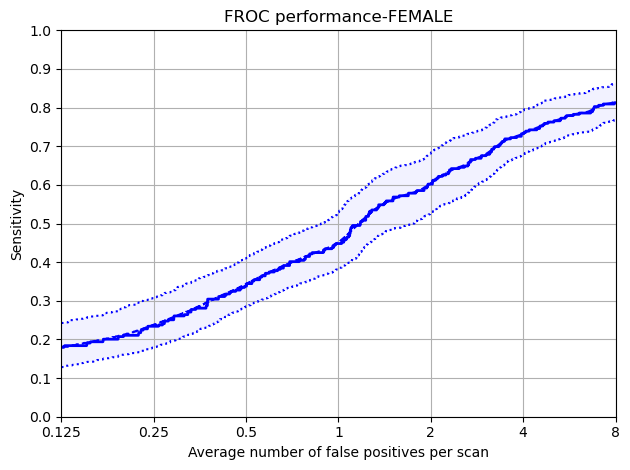

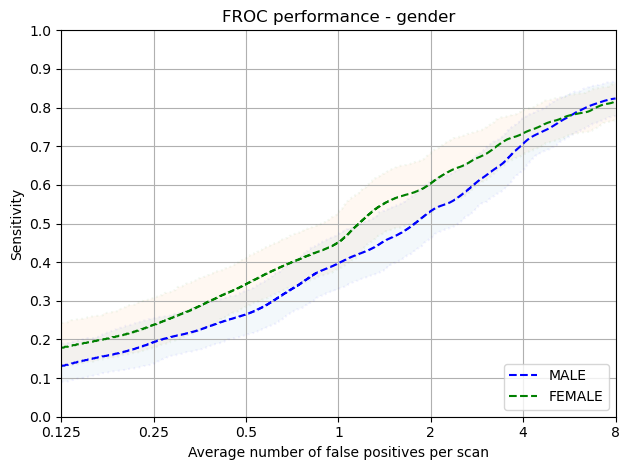

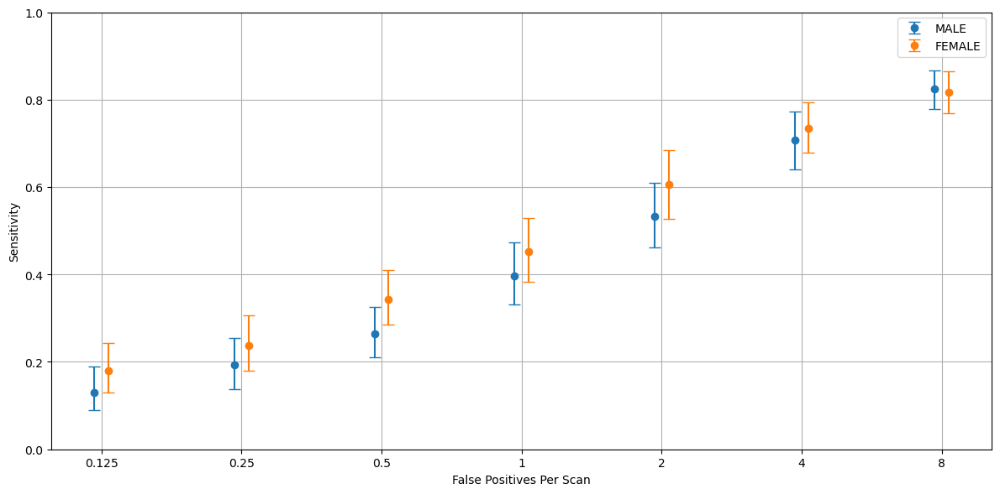

In [6]:

annotations_excluded = pd.read_csv(f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv')

annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')

predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv')

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Gender', data_dict)

### Age Analysis

Protected Group: 65-69


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,61.0,2.0,7.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp92grbmts/annotations.csv
Total number of included nodule annotations: 168
Total number of nodule annotations: 168
Cases: 166


100%|██████████| 1000/1000 [00:03<00:00, 255.40it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/participant_age_at_consent_cats/65-69 directory


,0,159,476,1111,2381,4920,9999
0,0.142 (0.08 - 0.221),0.196 (0.126 - 0.284),0.281 (0.19 - 0.381),0.429 (0.344 - 0.522),0.59 (0.503 - 0.681),0.751 (0.675 - 0.823),0.849 (0.794 - 0.902)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.142,0.080,0.221
159,0.250,0.196,0.126,0.284
476,0.500,0.281,0.190,0.381
1111,1.000,0.429,0.344,0.522
2381,2.000,0.590,0.503,0.681
4920,4.000,0.751,0.675,0.823
9999,8.000,0.849,0.794,0.902


Mean Sensitivity: 0.46 Low Sensitivity: 0.39 High Sensitivity: 0.545


,True positives,149
0,False positives,3497.000
1,False negatives,19.000
2,True negatives,0.000
3,Total number of candidates,3649.000
4,Total number of nodules,168.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,3.000
7,Sensitivity,0.887
8,Average number of candidates per scan,21.982


Protected Group: 60-64


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,53.0,4.0,8.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpw02_0vz8/annotations.csv
Total number of included nodule annotations: 200
Total number of nodule annotations: 200
Cases: 148


100%|██████████| 1000/1000 [00:03<00:00, 276.64it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/participant_age_at_consent_cats/60-64 directory


,0,159,476,1111,2381,4920,9999
0,0.144 (0.085 - 0.214),0.196 (0.124 - 0.282),0.269 (0.178 - 0.373),0.403 (0.311 - 0.513),0.527 (0.426 - 0.639),0.701 (0.616 - 0.796),0.793 (0.732 - 0.854)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.144,0.085,0.214
159,0.250,0.196,0.124,0.282
476,0.500,0.269,0.178,0.373
1111,1.000,0.403,0.311,0.513
2381,2.000,0.527,0.426,0.639
4920,4.000,0.701,0.616,0.796
9999,8.000,0.793,0.732,0.854


Mean Sensitivity: 0.43 Low Sensitivity: 0.35 High Sensitivity: 0.524


,True positives,179
0,False positives,3217.000
1,False negatives,21.000
2,True negatives,0.000
3,Total number of candidates,3404.000
4,Total number of nodules,200.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.895
8,Average number of candidates per scan,23.000


Protected Group: 70-75


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,48.0,4.0,6.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpn1mt4_lp/annotations.csv
Total number of included nodule annotations: 140
Total number of nodule annotations: 140
Cases: 115
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:02<00:00, 363.35it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/participant_age_at_consent_cats/70-75 directory


,0,159,476,1111,2381,4920,9999
0,0.187 (0.109 - 0.275),0.257 (0.168 - 0.357),0.363 (0.282 - 0.462),0.48 (0.391 - 0.574),0.634 (0.542 - 0.735),0.772 (0.69 - 0.854),0.863 (0.786 - 0.93)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.187,0.109,0.275
159,0.250,0.257,0.168,0.357
476,0.500,0.363,0.282,0.462
1111,1.000,0.480,0.391,0.574
2381,2.000,0.634,0.542,0.735
4920,4.000,0.772,0.690,0.854
9999,8.000,0.863,0.786,0.930


Mean Sensitivity: 0.51 Low Sensitivity: 0.42 High Sensitivity: 0.598


,True positives,126
0,False positives,2419.000
1,False negatives,14.000
2,True negatives,0.000
3,Total number of candidates,2544.000
4,Total number of nodules,140.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.900
8,Average number of candidates per scan,22.122


Protected Group: 55-59


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,55.0,3.0,5.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpk476_twy/annotations.csv
Total number of included nodule annotations: 144
Total number of nodule annotations: 144
Cases: 134


100%|██████████| 1000/1000 [00:02<00:00, 334.90it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/participant_age_at_consent_cats/55-59 directory


,0,159,476,1111,2381,4920,9999
0,0.16 (0.077 - 0.252),0.212 (0.13 - 0.306),0.294 (0.199 - 0.409),0.418 (0.295 - 0.571),0.54 (0.432 - 0.654),0.702 (0.606 - 0.785),0.801 (0.731 - 0.865)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.160,0.077,0.252
159,0.250,0.212,0.130,0.306
476,0.500,0.294,0.199,0.409
1111,1.000,0.418,0.295,0.571
2381,2.000,0.540,0.432,0.654
4920,4.000,0.702,0.606,0.785
9999,8.000,0.801,0.731,0.865


Mean Sensitivity: 0.45 Low Sensitivity: 0.35 High Sensitivity: 0.549


,True positives,129
0,False positives,2705.000
1,False negatives,15.000
2,True negatives,0.000
3,Total number of candidates,2842.000
4,Total number of nodules,144.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.896
8,Average number of candidates per scan,21.209


Protected Group: 75+


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,51.0,9.0,14.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp08iggc80/annotations.csv
Total number of included nodule annotations: 43
Total number of nodule annotations: 43
Cases: 33


100%|██████████| 1000/1000 [00:01<00:00, 912.62it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/participant_age_at_consent_cats/75+ directory


,0,159,476,1111,2381,4920,9999
0,0.138 (0.024 - 0.308),0.171 (0.04 - 0.364),0.267 (0.095 - 0.5),0.362 (0.191 - 0.594),0.5 (0.28 - 0.755),0.621 (0.409 - 0.833),0.725 (0.526 - 0.913)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.138,0.024,0.308
159,0.250,0.171,0.040,0.364
476,0.500,0.267,0.095,0.500
1111,1.000,0.362,0.191,0.594
2381,2.000,0.500,0.280,0.755
4920,4.000,0.621,0.409,0.833
9999,8.000,0.725,0.526,0.913


Mean Sensitivity: 0.4 Low Sensitivity: 0.22 High Sensitivity: 0.61


,True positives,35
0,False positives,676.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,712.000
4,Total number of nodules,43.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.814
8,Average number of candidates per scan,21.576


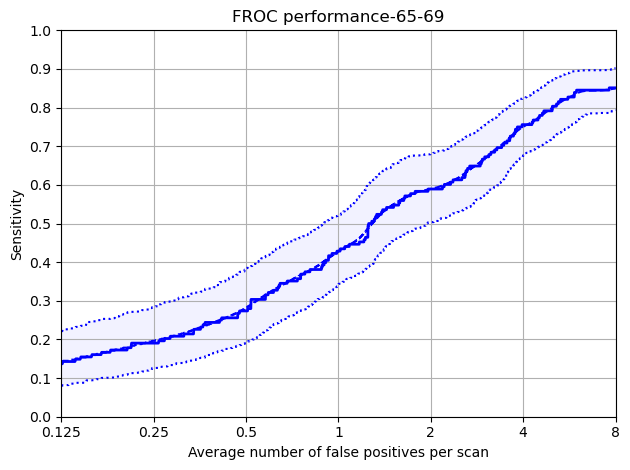

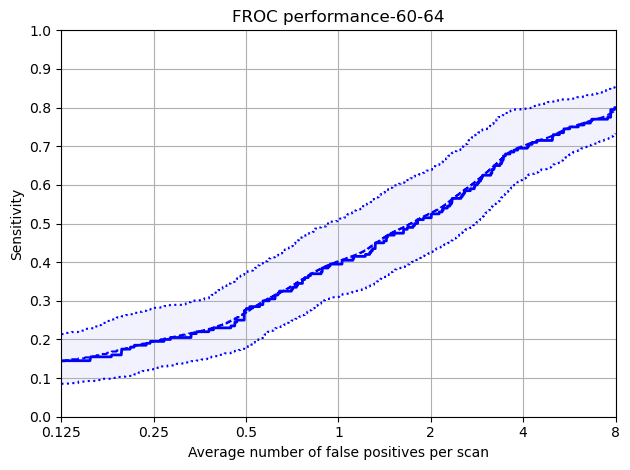

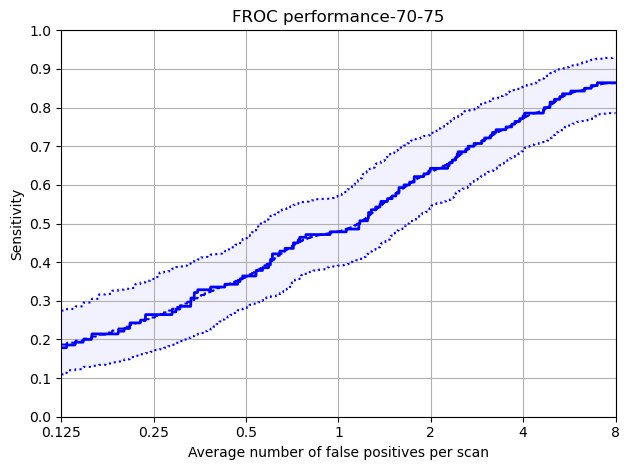

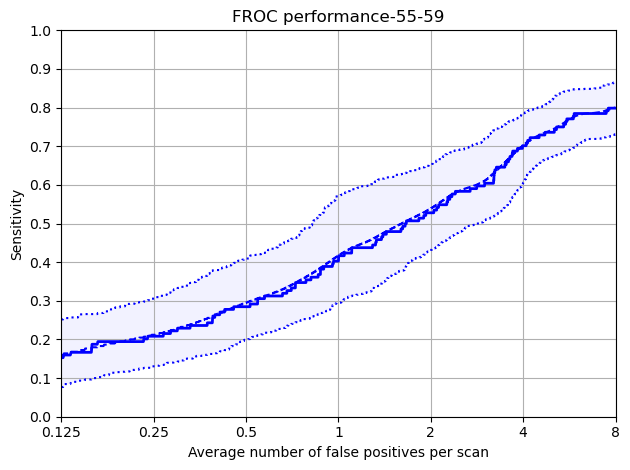

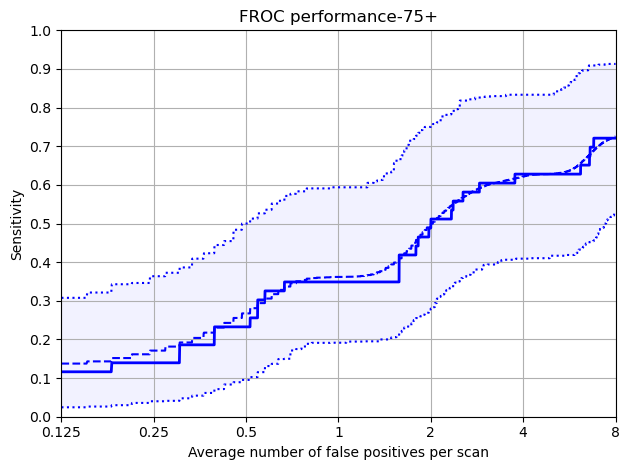

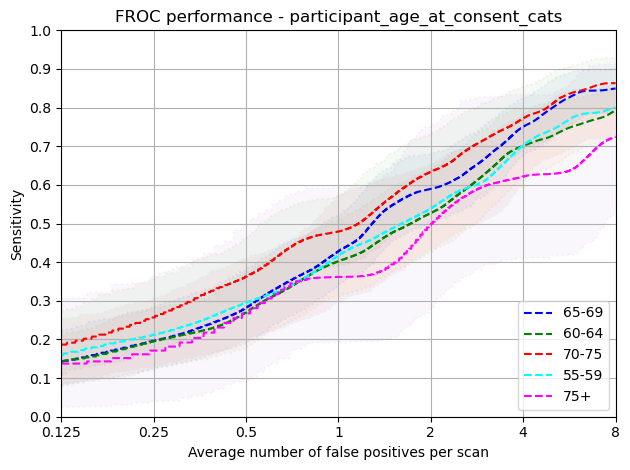

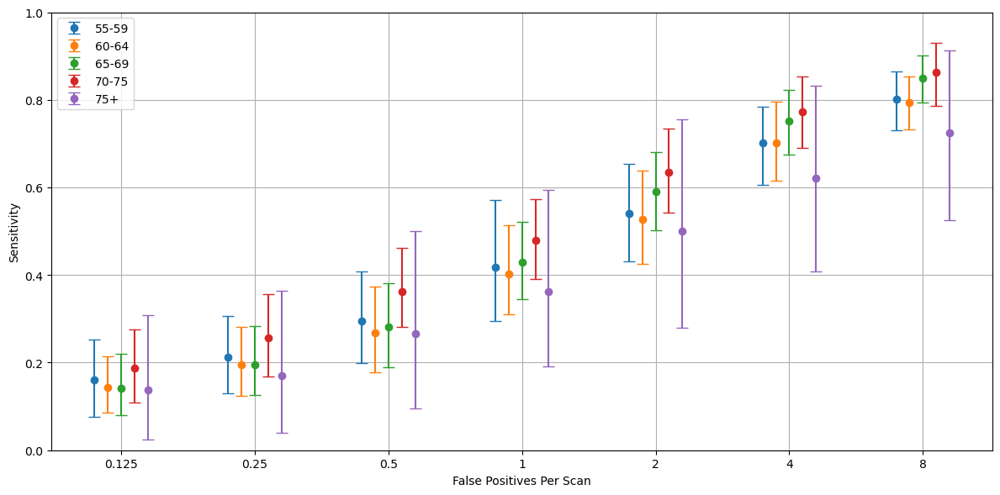

In [7]:
protected_group = 'participant_age_at_consent_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Age', data_dict, ['55-59','60-64','65-69','70-75','75+'])

In [8]:
data_dict

{'65-69':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.142     0.080      0.221
 0.250      0.196     0.126      0.284
 0.500      0.281     0.190      0.381
 1.000      0.429     0.344      0.522
 2.000      0.590     0.503      0.681
 4.000      0.751     0.675      0.823
 8.000      0.849     0.794      0.902,
 '60-64':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.144     0.085      0.214
 0.250      0.196     0.124      0.282
 0.500      0.269     0.178      0.373
 1.000      0.403     0.311      0.513
 2.000      0.527     0.426      0.639
 4.000      0.701     0.616      0.796
 8.000      0.793     0.732      0.854,
 '70-75':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.187     0.109      0.275
 0.250      0.257     0.168      0.357
 0.500      0.363     0.282      0.462
 1.000      0.480     0.391      0.574
 2.000      0.634     0.542      0.

### Ethnicity analysis

Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,63.0,2.0,5.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpc0kzf1mg/annotations.csv
Total number of included nodule annotations: 250
Total number of nodule annotations: 250
Cases: 199


100%|██████████| 1000/1000 [00:04<00:00, 210.20it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/ethnic_group/Black directory


,0,159,476,1111,2381,4920,9999
0,0.118 (0.069 - 0.181),0.175 (0.116 - 0.249),0.257 (0.189 - 0.345),0.384 (0.3 - 0.486),0.5 (0.413 - 0.6),0.691 (0.615 - 0.771),0.82 (0.767 - 0.877)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.118,0.069,0.181
159,0.250,0.175,0.116,0.249
476,0.500,0.257,0.189,0.345
1111,1.000,0.384,0.300,0.486
2381,2.000,0.500,0.413,0.600
4920,4.000,0.691,0.615,0.771
9999,8.000,0.820,0.767,0.877


Mean Sensitivity: 0.42 Low Sensitivity: 0.35 High Sensitivity: 0.501


,True positives,224
0,False positives,4395.000
1,False negatives,26.000
2,True negatives,0.000
3,Total number of candidates,4626.000
4,Total number of nodules,250.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,7.000
7,Sensitivity,0.896
8,Average number of candidates per scan,23.246


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,52.0,3.0,10.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp7x0tt_v5/annotations.csv
Total number of included nodule annotations: 203
Total number of nodule annotations: 203
Cases: 196


100%|██████████| 1000/1000 [00:04<00:00, 237.36it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/ethnic_group/Asian or Asian British directory


,0,159,476,1111,2381,4920,9999
0,0.104 (0.052 - 0.174),0.187 (0.11 - 0.268),0.246 (0.17 - 0.333),0.364 (0.282 - 0.451),0.531 (0.457 - 0.616),0.699 (0.63 - 0.766),0.781 (0.709 - 0.845)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.104,0.052,0.174
159,0.250,0.187,0.110,0.268
476,0.500,0.246,0.170,0.333
1111,1.000,0.364,0.282,0.451
2381,2.000,0.531,0.457,0.616
4920,4.000,0.699,0.630,0.766
9999,8.000,0.781,0.709,0.845


Mean Sensitivity: 0.42 Low Sensitivity: 0.34 High Sensitivity: 0.493


,True positives,175
0,False positives,3882.000
1,False negatives,28.000
2,True negatives,0.000
3,Total number of candidates,4061.000
4,Total number of nodules,203.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,4.000
7,Sensitivity,0.862
8,Average number of candidates per scan,20.719


Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,47.0,6.0,6.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp7aqa60j8/annotations.csv
Total number of included nodule annotations: 242
Total number of nodule annotations: 242
Cases: 199
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:04<00:00, 211.89it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/ethnic_group/White directory


,0,159,476,1111,2381,4920,9999
0,0.221 (0.163 - 0.287),0.264 (0.199 - 0.34),0.376 (0.296 - 0.449),0.499 (0.426 - 0.579),0.65 (0.578 - 0.718),0.77 (0.709 - 0.831),0.844 (0.795 - 0.893)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.221,0.163,0.287
159,0.250,0.264,0.199,0.340
476,0.500,0.376,0.296,0.449
1111,1.000,0.499,0.426,0.579
2381,2.000,0.650,0.578,0.718
4920,4.000,0.770,0.709,0.831
9999,8.000,0.844,0.795,0.893


Mean Sensitivity: 0.52 Low Sensitivity: 0.45 High Sensitivity: 0.585


,True positives,219
0,False positives,4237.000
1,False negatives,23.000
2,True negatives,0.000
3,Total number of candidates,4464.000
4,Total number of nodules,242.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.905
8,Average number of candidates per scan,22.432


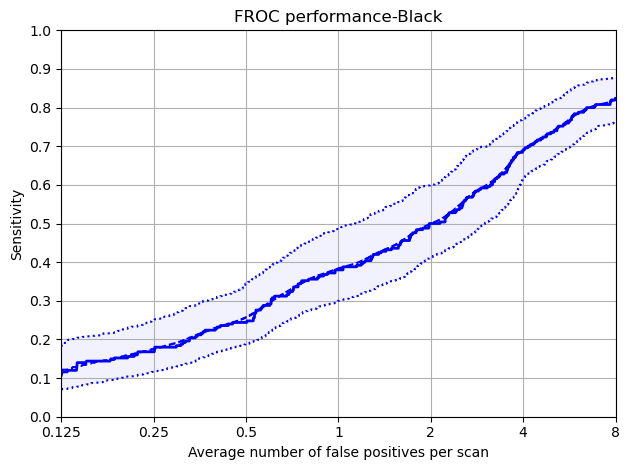

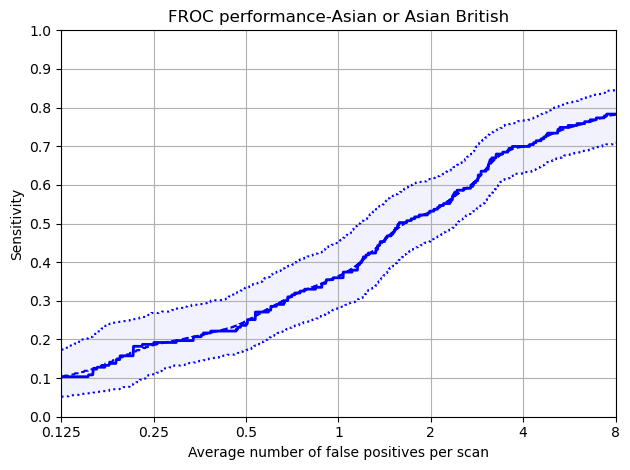

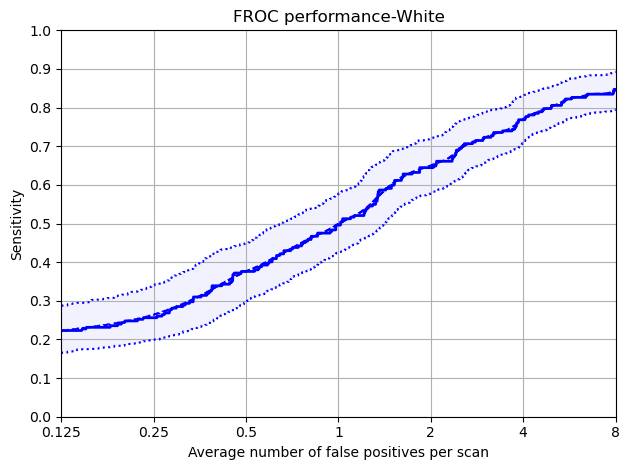

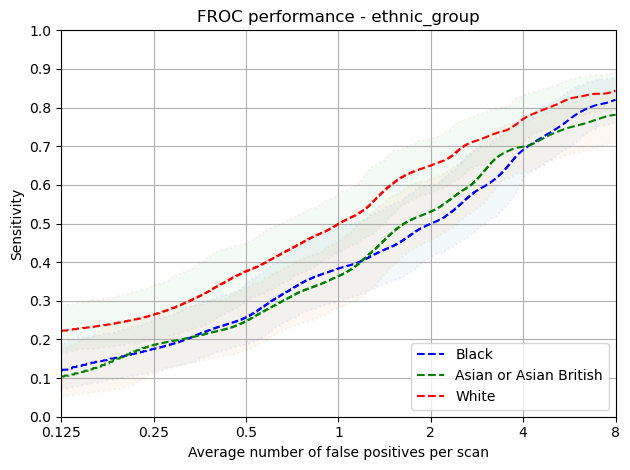

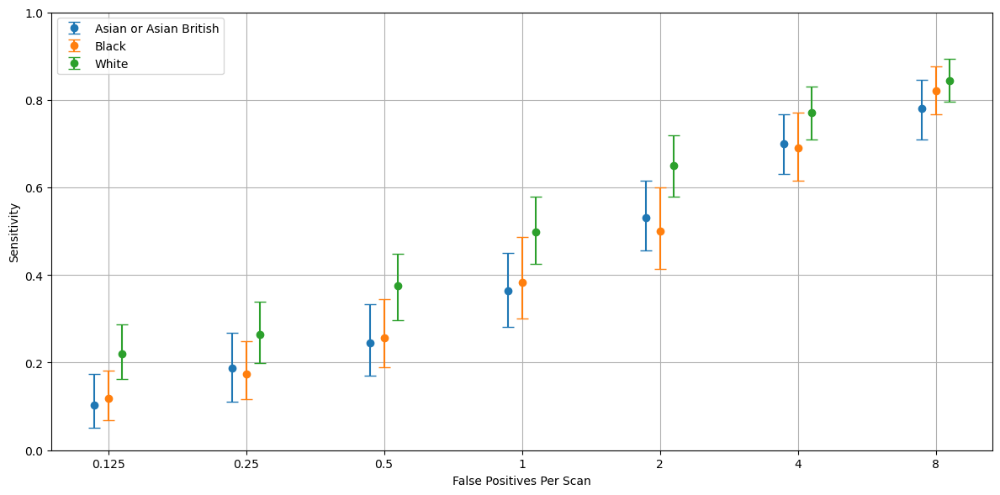

In [9]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour,'Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### IMDRank_tertile

Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,63.0,3.0,7.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp26dgmp2c/annotations.csv
Total number of included nodule annotations: 235
Total number of nodule annotations: 235
Cases: 192
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:04<00:00, 234.39it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/IMDRank_tertile/Medium directory


,0,159,476,1111,2381,4920,9999
0,0.15 (0.09 - 0.222),0.206 (0.149 - 0.275),0.301 (0.224 - 0.382),0.421 (0.343 - 0.509),0.597 (0.516 - 0.679),0.737 (0.676 - 0.795),0.829 (0.77 - 0.885)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.150,0.090,0.222
159,0.250,0.206,0.149,0.275
476,0.500,0.301,0.224,0.382
1111,1.000,0.421,0.343,0.509
2381,2.000,0.597,0.516,0.679
4920,4.000,0.737,0.676,0.795
9999,8.000,0.829,0.770,0.885


Mean Sensitivity: 0.46 Low Sensitivity: 0.4 High Sensitivity: 0.535


,True positives,216
0,False positives,3860.000
1,False negatives,19.000
2,True negatives,0.000
3,Total number of candidates,4083.000
4,Total number of nodules,235.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.919
8,Average number of candidates per scan,21.266


Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,55.0,4.0,5.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmptowqm6qe/annotations.csv
Total number of included nodule annotations: 281
Total number of nodule annotations: 281
Cases: 246


100%|██████████| 1000/1000 [00:06<00:00, 166.22it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/IMDRank_tertile/Low directory


,0,159,476,1111,2381,4920,9999
0,0.157 (0.103 - 0.227),0.217 (0.151 - 0.294),0.287 (0.22 - 0.372),0.418 (0.337 - 0.526),0.528 (0.448 - 0.634),0.699 (0.624 - 0.778),0.818 (0.772 - 0.866)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.157,0.103,0.227
159,0.250,0.217,0.151,0.294
476,0.500,0.287,0.220,0.372
1111,1.000,0.418,0.337,0.526
2381,2.000,0.528,0.448,0.634
4920,4.000,0.699,0.624,0.778
9999,8.000,0.818,0.772,0.866


Mean Sensitivity: 0.45 Low Sensitivity: 0.38 High Sensitivity: 0.528


,True positives,250
0,False positives,5162.000
1,False negatives,31.000
2,True negatives,0.000
3,Total number of candidates,5421.000
4,Total number of nodules,281.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.890
8,Average number of candidates per scan,22.037


Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,43.0,3.0,10.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpifaity4x/annotations.csv
Total number of included nodule annotations: 175
Total number of nodule annotations: 175
Cases: 150


100%|██████████| 1000/1000 [00:03<00:00, 253.54it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/IMDRank_tertile/High directory


,0,159,476,1111,2381,4920,9999
0,0.152 (0.087 - 0.233),0.211 (0.135 - 0.29),0.29 (0.207 - 0.38),0.43 (0.351 - 0.513),0.558 (0.465 - 0.651),0.736 (0.664 - 0.804),0.817 (0.753 - 0.879)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.152,0.087,0.233
159,0.250,0.211,0.135,0.290
476,0.500,0.290,0.207,0.380
1111,1.000,0.430,0.351,0.513
2381,2.000,0.558,0.465,0.651
4920,4.000,0.736,0.664,0.804
9999,8.000,0.817,0.753,0.879


Mean Sensitivity: 0.46 Low Sensitivity: 0.38 High Sensitivity: 0.536


,True positives,150
0,False positives,3363.000
1,False negatives,25.000
2,True negatives,0.000
3,Total number of candidates,3516.000
4,Total number of nodules,175.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,3.000
7,Sensitivity,0.857
8,Average number of candidates per scan,23.440


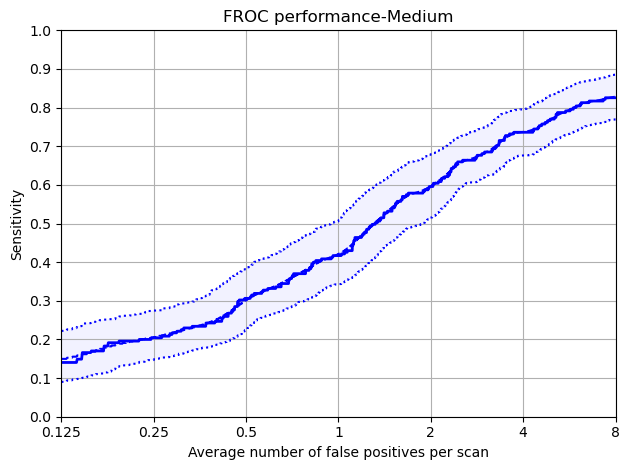

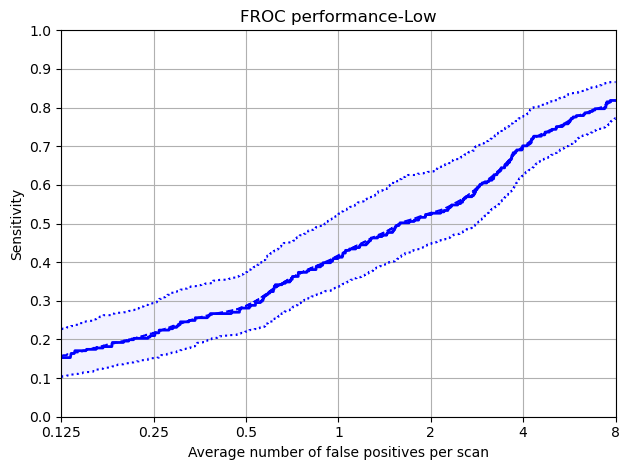

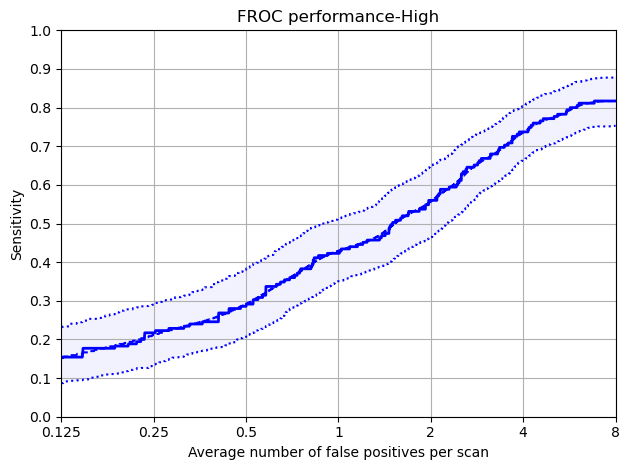

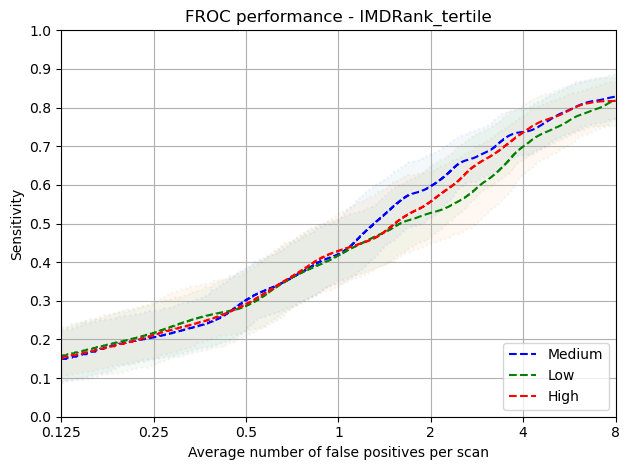

In [10]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Smoking Pack Years


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,54.0,2.0,6.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpcuo2fft9/annotations.csv
Total number of included nodule annotations: 291
Total number of nodule annotations: 291
Cases: 250


100%|██████████| 1000/1000 [00:05<00:00, 171.36it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/smoking_pack_years_cats/Low (15-35) directory


,0,159,476,1111,2381,4920,9999
0,0.157 (0.107 - 0.217),0.203 (0.15 - 0.273),0.303 (0.241 - 0.378),0.397 (0.327 - 0.479),0.547 (0.465 - 0.635),0.721 (0.659 - 0.789),0.814 (0.767 - 0.861)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.157,0.107,0.217
159,0.250,0.203,0.150,0.273
476,0.500,0.303,0.241,0.378
1111,1.000,0.397,0.327,0.479
2381,2.000,0.547,0.465,0.635
4920,4.000,0.721,0.659,0.789
9999,8.000,0.814,0.767,0.861


Mean Sensitivity: 0.45 Low Sensitivity: 0.39 High Sensitivity: 0.519


,True positives,260
0,False positives,5241.000
1,False negatives,31.000
2,True negatives,0.000
3,Total number of candidates,5505.000
4,Total number of nodules,291.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,4.000
7,Sensitivity,0.893
8,Average number of candidates per scan,22.020


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,29.0,55.0,3.0,6.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpqm8p04tg/annotations.csv
Total number of included nodule annotations: 217
Total number of nodule annotations: 217
Cases: 193
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:04<00:00, 201.04it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/smoking_pack_years_cats/Medium (35-50) directory


,0,159,476,1111,2381,4920,9999
0,0.163 (0.1 - 0.235),0.222 (0.15 - 0.301),0.3 (0.216 - 0.392),0.444 (0.359 - 0.534),0.595 (0.514 - 0.677),0.718 (0.632 - 0.792),0.826 (0.764 - 0.886)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.163,0.100,0.235
159,0.250,0.222,0.150,0.301
476,0.500,0.300,0.216,0.392
1111,1.000,0.444,0.359,0.534
2381,2.000,0.595,0.514,0.677
4920,4.000,0.718,0.632,0.792
9999,8.000,0.826,0.764,0.886


Mean Sensitivity: 0.47 Low Sensitivity: 0.39 High Sensitivity: 0.545


,True positives,193
0,False positives,4058.000
1,False negatives,24.000
2,True negatives,0.000
3,Total number of candidates,4265.000
4,Total number of nodules,217.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,15.000
7,Sensitivity,0.889
8,Average number of candidates per scan,22.098


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,53.0,6.0,9.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpk09orvjx/annotations.csv
Total number of included nodule annotations: 187
Total number of nodule annotations: 187
Cases: 151


100%|██████████| 1000/1000 [00:03<00:00, 261.43it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/smoking_pack_years_cats/High (50+) directory


,0,159,476,1111,2381,4920,9999
0,0.13 (0.072 - 0.2),0.194 (0.115 - 0.288),0.277 (0.189 - 0.375),0.427 (0.323 - 0.542),0.553 (0.453 - 0.659),0.728 (0.649 - 0.802),0.81 (0.749 - 0.869)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.130,0.072,0.200
159,0.250,0.194,0.115,0.288
476,0.500,0.277,0.189,0.375
1111,1.000,0.427,0.323,0.542
2381,2.000,0.553,0.453,0.659
4920,4.000,0.728,0.649,0.802
9999,8.000,0.810,0.749,0.869


Mean Sensitivity: 0.45 Low Sensitivity: 0.36 High Sensitivity: 0.534


,True positives,165
0,False positives,3215.000
1,False negatives,22.000
2,True negatives,0.000
3,Total number of candidates,3381.000
4,Total number of nodules,187.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.882
8,Average number of candidates per scan,22.391


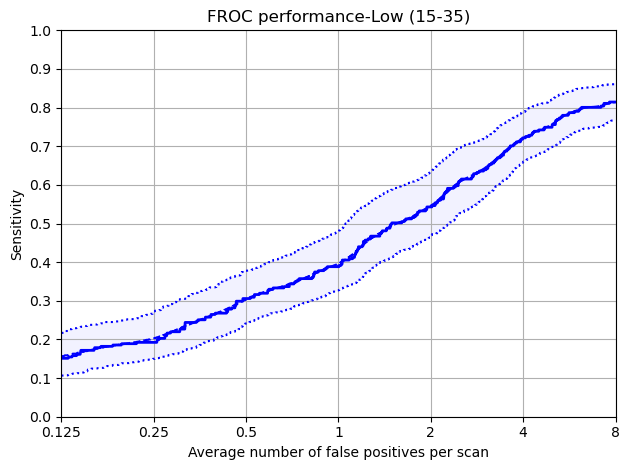

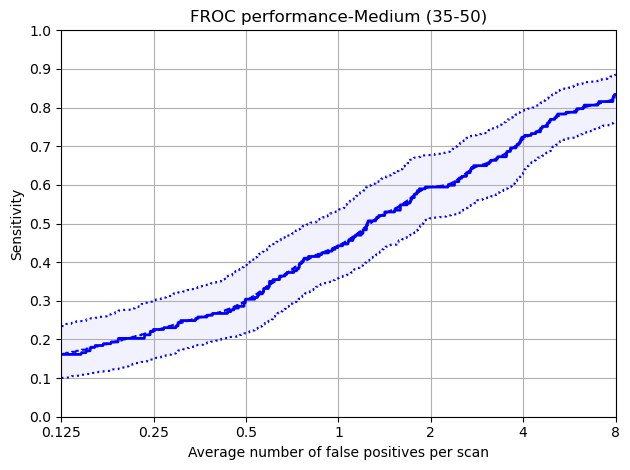

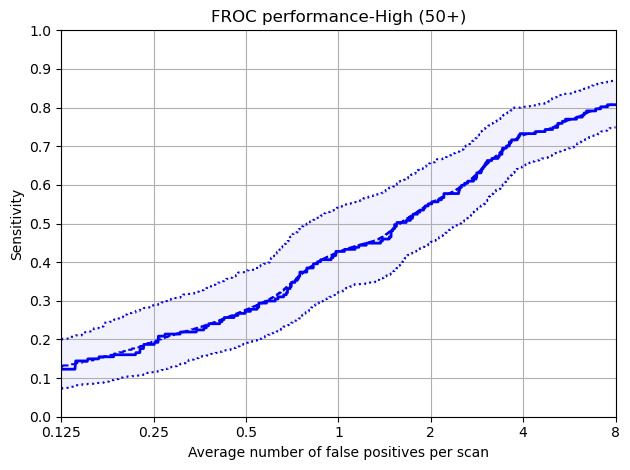

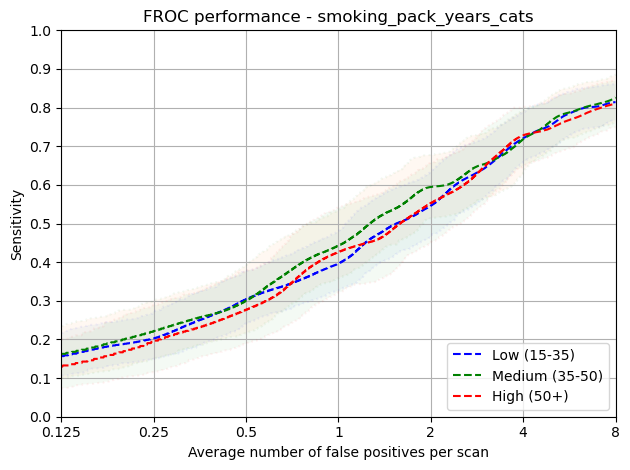

In [11]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,17.0,81.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpow80j6th/annotations.csv
Total number of included nodule annotations: 254
Total number of nodule annotations: 254
Cases: 421
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:10<00:00, 95.16it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/is_actionable/Non-Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.157 (0.105 - 0.214),0.221 (0.165 - 0.278),0.317 (0.255 - 0.385),0.491 (0.427 - 0.557),0.672 (0.609 - 0.734),0.801 (0.743 - 0.855),0.888 (0.849 - 0.928)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.157,0.105,0.214
159,0.250,0.221,0.165,0.278
476,0.500,0.317,0.255,0.385
1111,1.000,0.491,0.427,0.557
2381,2.000,0.672,0.609,0.734
4920,4.000,0.801,0.743,0.855
9999,8.000,0.888,0.849,0.928


Mean Sensitivity: 0.51 Low Sensitivity: 0.45 High Sensitivity: 0.564


,True positives,238
0,False positives,8630.000
1,False negatives,16.000
2,True negatives,0.000
3,Total number of candidates,8867.000
4,Total number of nodules,254.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.937
8,Average number of candidates per scan,21.062


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,39.0,6.0,10.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpz6pu70yy/annotations.csv
Total number of included nodule annotations: 441
Total number of nodule annotations: 441
Cases: 172


100%|██████████| 1000/1000 [00:04<00:00, 204.52it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/is_actionable/Actonable directory


,0,159,476,1111,2381,4920,9999
0,0.14 (0.099 - 0.188),0.188 (0.134 - 0.251),0.268 (0.204 - 0.34),0.367 (0.305 - 0.437),0.491 (0.428 - 0.567),0.654 (0.585 - 0.718),0.765 (0.719 - 0.81)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.140,0.099,0.188
159,0.250,0.188,0.134,0.251
476,0.500,0.268,0.204,0.340
1111,1.000,0.367,0.305,0.437
2381,2.000,0.491,0.428,0.567
4920,4.000,0.654,0.585,0.718
9999,8.000,0.765,0.719,0.810


Mean Sensitivity: 0.41 Low Sensitivity: 0.35 High Sensitivity: 0.473


,True positives,380
0,False positives,3884.000
1,False negatives,61.000
2,True negatives,0.000
3,Total number of candidates,4284.000
4,Total number of nodules,441.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,20.000
7,Sensitivity,0.862
8,Average number of candidates per scan,24.907


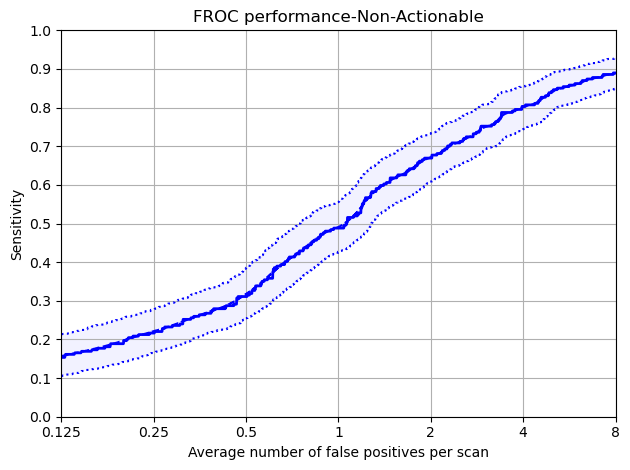

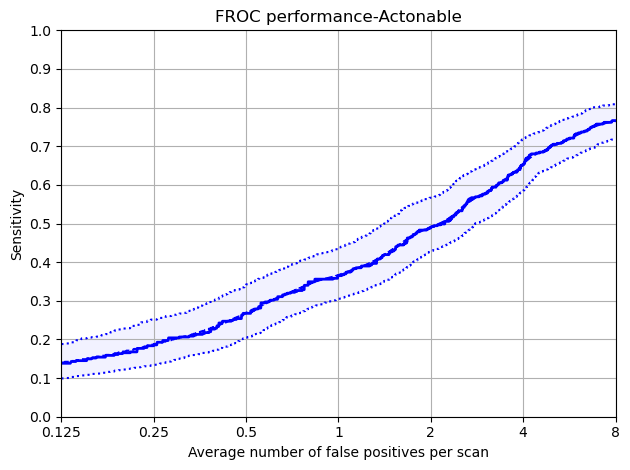

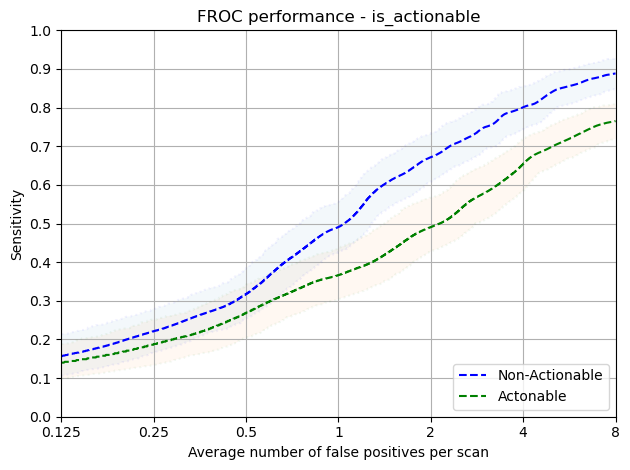

In [12]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable-Gender Splits

Protected Group: Male


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,43.0,3.0,10.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp06qgwqkd/annotations.csv
Total number of included nodule annotations: 263
Total number of nodule annotations: 263
Cases: 92


100%|██████████| 1000/1000 [00:02<00:00, 341.94it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/gender_is_actionable/Male directory


,0,159,476,1111,2381,4920,9999
0,0.122 (0.07 - 0.186),0.166 (0.102 - 0.25),0.231 (0.155 - 0.319),0.318 (0.241 - 0.405),0.432 (0.336 - 0.527),0.602 (0.497 - 0.699),0.769 (0.698 - 0.835)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.122,0.070,0.186
159,0.250,0.166,0.102,0.250
476,0.500,0.231,0.155,0.319
1111,1.000,0.318,0.241,0.405
2381,2.000,0.432,0.336,0.527
4920,4.000,0.602,0.497,0.699
9999,8.000,0.769,0.698,0.835


Mean Sensitivity: 0.38 Low Sensitivity: 0.3 High Sensitivity: 0.46


,True positives,230
0,False positives,2342.000
1,False negatives,33.000
2,True negatives,0.000
3,Total number of candidates,2584.000
4,Total number of nodules,263.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,12.000
7,Sensitivity,0.875
8,Average number of candidates per scan,28.087


Protected Group: Female


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,32.0,9.0,10.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp2fnccthz/annotations.csv
Total number of included nodule annotations: 178
Total number of nodule annotations: 178
Cases: 81


100%|██████████| 1000/1000 [00:02<00:00, 457.46it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/gender_is_actionable/Female directory


,0,159,476,1111,2381,4920,9999
0,0.173 (0.114 - 0.246),0.223 (0.149 - 0.305),0.332 (0.236 - 0.429),0.451 (0.356 - 0.554),0.582 (0.479 - 0.684),0.704 (0.631 - 0.777),0.773 (0.709 - 0.833)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.173,0.114,0.246
159,0.250,0.223,0.149,0.305
476,0.500,0.332,0.236,0.429
1111,1.000,0.451,0.356,0.554
2381,2.000,0.582,0.479,0.684
4920,4.000,0.704,0.631,0.777
9999,8.000,0.773,0.709,0.833


Mean Sensitivity: 0.46 Low Sensitivity: 0.38 High Sensitivity: 0.547


,True positives,150
0,False positives,1542.000
1,False negatives,28.000
2,True negatives,0.000
3,Total number of candidates,1700.000
4,Total number of nodules,178.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.843
8,Average number of candidates per scan,20.988


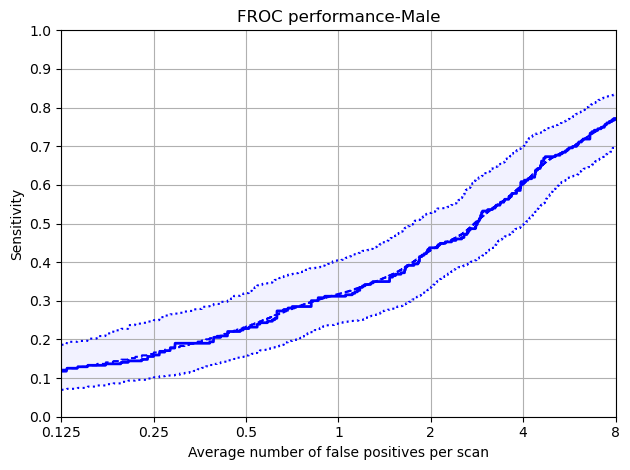

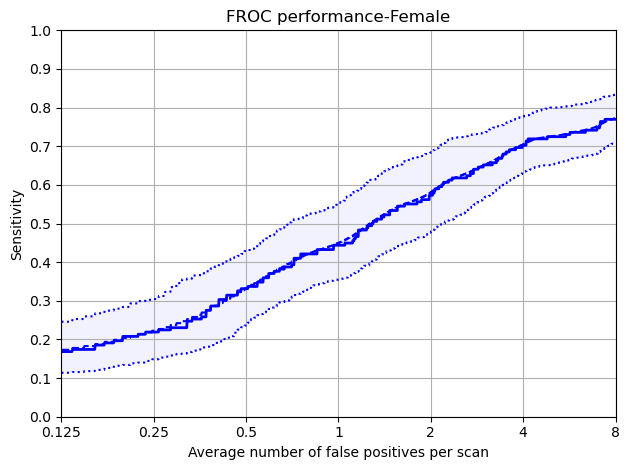

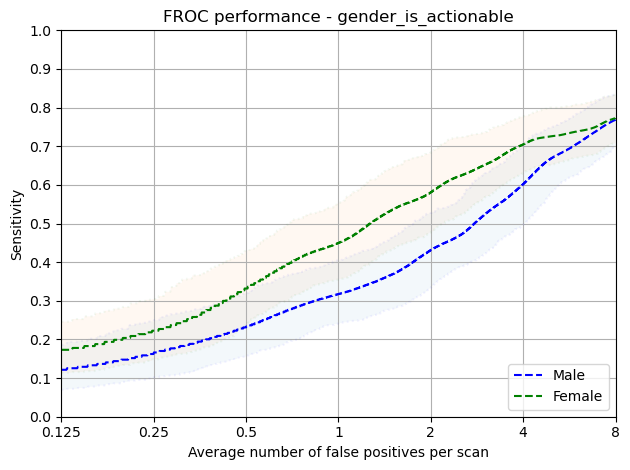

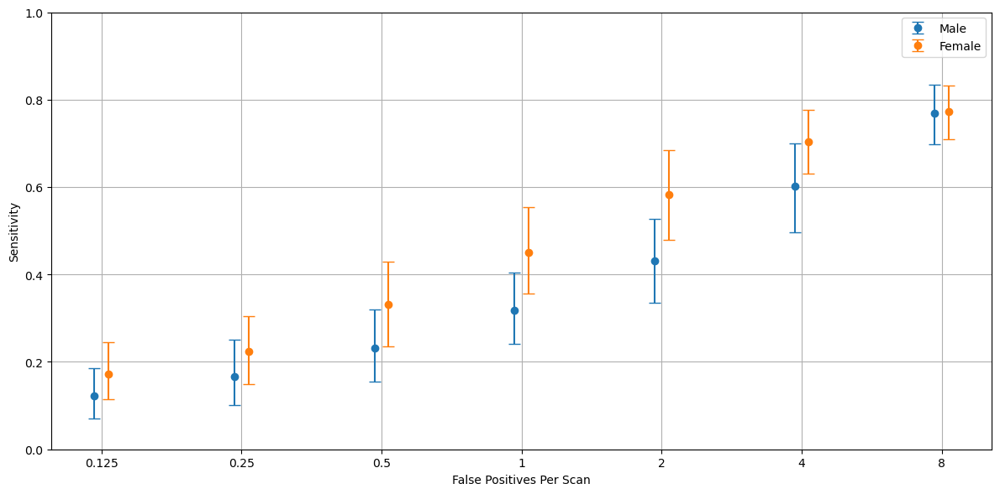

In [13]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Actionable, Gender', data_dict)

### NonActionable-Gender

Protected Group: Male


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,18.0,81.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmptapq__ms/annotations.csv
Total number of included nodule annotations: 133
Total number of nodule annotations: 133
Cases: 251


100%|██████████| 1000/1000 [00:06<00:00, 149.60it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/gender_is_not_actionable/Male directory


,0,159,476,1111,2381,4920,9999
0,0.144 (0.069 - 0.233),0.225 (0.144 - 0.31),0.317 (0.241 - 0.404),0.542 (0.459 - 0.634),0.708 (0.626 - 0.794),0.83 (0.756 - 0.898),0.909 (0.86 - 0.958)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.144,0.069,0.233
159,0.250,0.225,0.144,0.310
476,0.500,0.317,0.241,0.404
1111,1.000,0.542,0.459,0.634
2381,2.000,0.708,0.626,0.794
4920,4.000,0.830,0.756,0.898
9999,8.000,0.909,0.860,0.958


Mean Sensitivity: 0.52 Low Sensitivity: 0.45 High Sensitivity: 0.604


,True positives,126
0,False positives,5546.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,5672.000
4,Total number of nodules,133.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.947
8,Average number of candidates per scan,22.598


Protected Group: Female


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,16.0,82.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpp5ek7oph/annotations.csv
Total number of included nodule annotations: 121
Total number of nodule annotations: 121
Cases: 171
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:03<00:00, 264.01it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/gender_is_not_actionable/Female directory


,0,159,476,1111,2381,4920,9999
0,0.162 (0.09 - 0.246),0.224 (0.14 - 0.321),0.336 (0.255 - 0.427),0.464 (0.364 - 0.578),0.639 (0.532 - 0.742),0.768 (0.678 - 0.857),0.874 (0.804 - 0.935)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.162,0.090,0.246
159,0.250,0.224,0.140,0.321
476,0.500,0.336,0.255,0.427
1111,1.000,0.464,0.364,0.578
2381,2.000,0.639,0.532,0.742
4920,4.000,0.768,0.678,0.857
9999,8.000,0.874,0.804,0.935


Mean Sensitivity: 0.5 Low Sensitivity: 0.41 High Sensitivity: 0.587


,True positives,112
0,False positives,3084.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,3195.000
4,Total number of nodules,121.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.926
8,Average number of candidates per scan,18.684


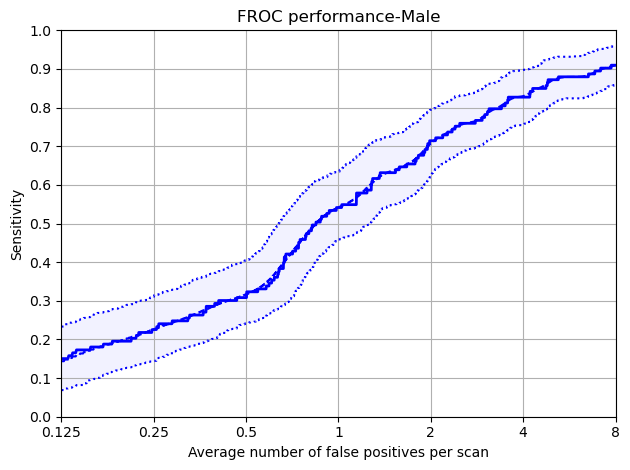

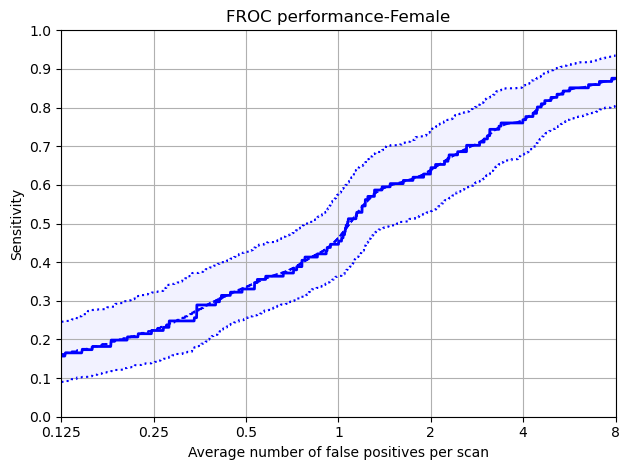

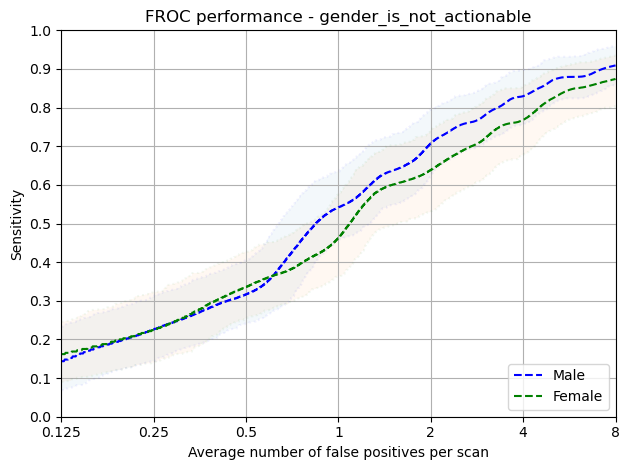

In [14]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Ethnic Group

Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,39.0,5.0,15.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp3le3v7ns/annotations.csv
Total number of included nodule annotations: 130
Total number of nodule annotations: 130
Cases: 59


100%|██████████| 1000/1000 [00:01<00:00, 511.85it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/ethnic_group_is_actionable/Asian or Asian British directory


,0,159,476,1111,2381,4920,9999
0,0.1 (0.041 - 0.189),0.128 (0.058 - 0.242),0.21 (0.116 - 0.327),0.312 (0.219 - 0.422),0.452 (0.35 - 0.562),0.625 (0.524 - 0.717),0.719 (0.616 - 0.807)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.100,0.041,0.189
159,0.250,0.128,0.058,0.242
476,0.500,0.210,0.116,0.327
1111,1.000,0.312,0.219,0.422
2381,2.000,0.452,0.350,0.562
4920,4.000,0.625,0.524,0.717
9999,8.000,0.719,0.616,0.807


Mean Sensitivity: 0.36 Low Sensitivity: 0.27 High Sensitivity: 0.467


,True positives,104
0,False positives,1399.000
1,False negatives,26.000
2,True negatives,0.000
3,Total number of candidates,1507.000
4,Total number of nodules,130.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,4.000
7,Sensitivity,0.800
8,Average number of candidates per scan,25.542


Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,50.0,2.0,7.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpdz3cj9g7/annotations.csv
Total number of included nodule annotations: 161
Total number of nodule annotations: 161
Cases: 52


100%|██████████| 1000/1000 [00:01<00:00, 576.56it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/ethnic_group_is_actionable/Black directory


,0,159,476,1111,2381,4920,9999
0,0.106 (0.059 - 0.168),0.144 (0.086 - 0.225),0.213 (0.133 - 0.307),0.297 (0.219 - 0.414),0.4 (0.294 - 0.526),0.613 (0.465 - 0.735),0.767 (0.683 - 0.848)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.106,0.059,0.168
159,0.250,0.144,0.086,0.225
476,0.500,0.213,0.133,0.307
1111,1.000,0.297,0.219,0.414
2381,2.000,0.400,0.294,0.526
4920,4.000,0.613,0.465,0.735
9999,8.000,0.767,0.683,0.848


Mean Sensitivity: 0.36 Low Sensitivity: 0.28 High Sensitivity: 0.46


,True positives,143
0,False positives,1144.000
1,False negatives,18.000
2,True negatives,0.000
3,Total number of candidates,1294.000
4,Total number of nodules,161.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,7.000
7,Sensitivity,0.888
8,Average number of candidates per scan,24.885


Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,42.0,25.0,10.0,9.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpq2aqyzdk/annotations.csv
Total number of included nodule annotations: 150
Total number of nodule annotations: 150
Cases: 63


100%|██████████| 1000/1000 [00:01<00:00, 503.72it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/ethnic_group_is_actionable/White directory


,0,159,476,1111,2381,4920,9999
0,0.25 (0.164 - 0.345),0.306 (0.21 - 0.421),0.391 (0.291 - 0.5),0.507 (0.405 - 0.606),0.633 (0.547 - 0.719),0.742 (0.66 - 0.826),0.811 (0.743 - 0.872)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.250,0.164,0.345
159,0.250,0.306,0.210,0.421
476,0.500,0.391,0.291,0.500
1111,1.000,0.507,0.405,0.606
2381,2.000,0.633,0.547,0.719
4920,4.000,0.742,0.660,0.826
9999,8.000,0.811,0.743,0.872


Mean Sensitivity: 0.52 Low Sensitivity: 0.43 High Sensitivity: 0.613


,True positives,133
0,False positives,1341.000
1,False negatives,17.000
2,True negatives,0.000
3,Total number of candidates,1483.000
4,Total number of nodules,150.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.887
8,Average number of candidates per scan,23.540


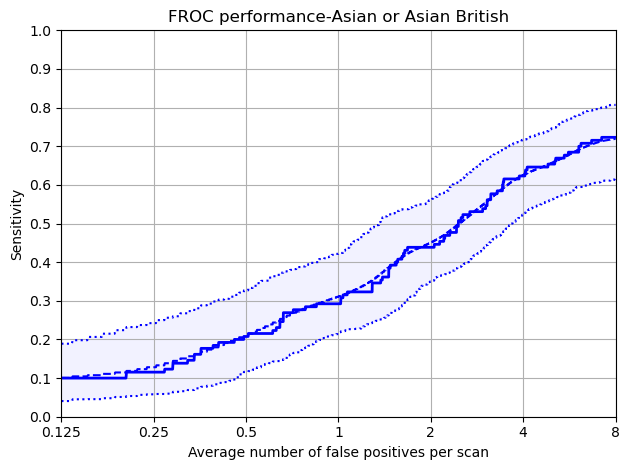

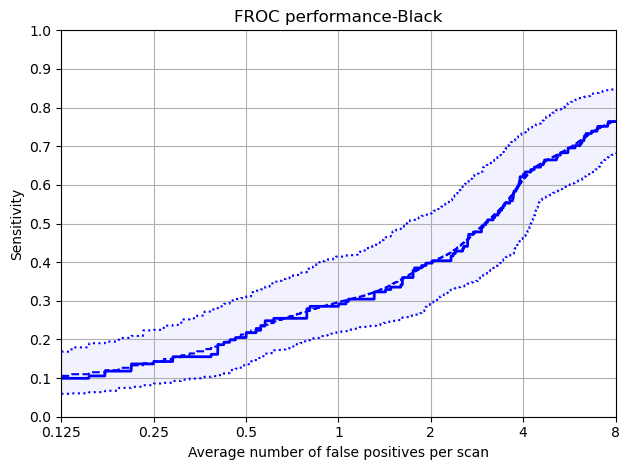

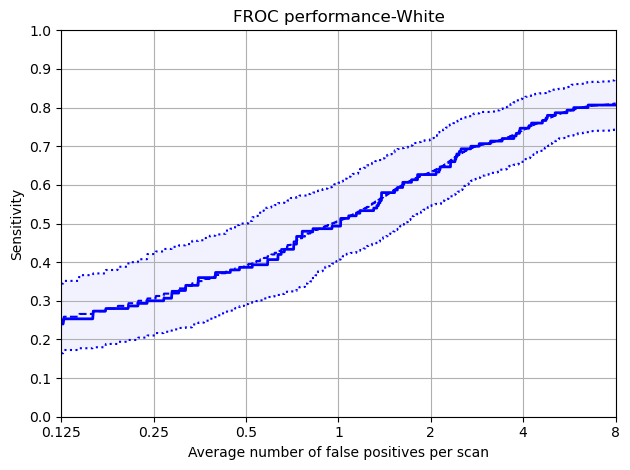

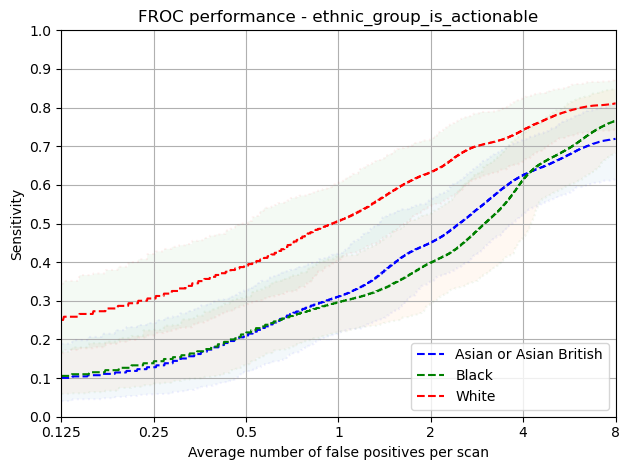

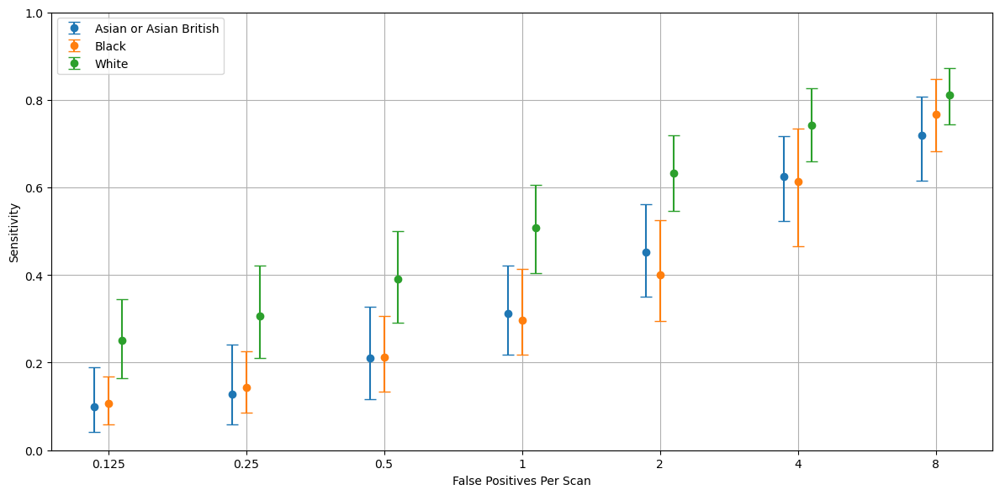

In [15]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Actionable, Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### NonActionable Ethnic Group

Protected Group: Black


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,13.0,85.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp1gk00ntm/annotations.csv
Total number of included nodule annotations: 89
Total number of nodule annotations: 89
Cases: 148


100%|██████████| 1000/1000 [00:03<00:00, 252.79it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/ethnic_group_is_not_actionable/Black directory


,0,159,476,1111,2381,4920,9999
0,0.15 (0.038 - 0.288),0.235 (0.135 - 0.343),0.317 (0.205 - 0.445),0.535 (0.42 - 0.657),0.673 (0.573 - 0.774),0.791 (0.696 - 0.887),0.888 (0.831 - 0.946)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.150,0.038,0.288
159,0.250,0.235,0.135,0.343
476,0.500,0.317,0.205,0.445
1111,1.000,0.535,0.420,0.657
2381,2.000,0.673,0.573,0.774
4920,4.000,0.791,0.696,0.887
9999,8.000,0.888,0.831,0.946


Mean Sensitivity: 0.51 Low Sensitivity: 0.41 High Sensitivity: 0.62


,True positives,81
0,False positives,3251.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,3332.000
4,Total number of nodules,89.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.910
8,Average number of candidates per scan,22.514


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,23.0,75.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp19qwqjoh/annotations.csv
Total number of included nodule annotations: 73
Total number of nodule annotations: 73
Cases: 138


100%|██████████| 1000/1000 [00:03<00:00, 323.86it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/ethnic_group_is_not_actionable/Asian or Asian British directory


,0,159,476,1111,2381,4920,9999
0,0.137 (0.036 - 0.259),0.2 (0.116 - 0.294),0.276 (0.182 - 0.382),0.465 (0.33 - 0.609),0.681 (0.558 - 0.794),0.8 (0.675 - 0.909),0.883 (0.793 - 0.962)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.137,0.036,0.259
159,0.250,0.200,0.116,0.294
476,0.500,0.276,0.182,0.382
1111,1.000,0.465,0.330,0.609
2381,2.000,0.681,0.558,0.794
4920,4.000,0.800,0.675,0.909
9999,8.000,0.883,0.793,0.962


Mean Sensitivity: 0.49 Low Sensitivity: 0.38 High Sensitivity: 0.601


,True positives,71
0,False positives,2483.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,2554.000
4,Total number of nodules,73.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.973
8,Average number of candidates per scan,18.507


Protected Group: White


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,15.0,83.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp6c95qwaf/annotations.csv
Total number of included nodule annotations: 92
Total number of nodule annotations: 92
Cases: 137
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:03<00:00, 271.67it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/ethnic_group_is_not_actionable/White directory


,0,159,476,1111,2381,4920,9999
0,0.186 (0.106 - 0.272),0.215 (0.129 - 0.321),0.353 (0.239 - 0.458),0.486 (0.39 - 0.583),0.678 (0.571 - 0.768),0.807 (0.713 - 0.892),0.892 (0.819 - 0.953)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.186,0.106,0.272
159,0.250,0.215,0.129,0.321
476,0.500,0.353,0.239,0.458
1111,1.000,0.486,0.390,0.583
2381,2.000,0.678,0.571,0.768
4920,4.000,0.807,0.713,0.892
9999,8.000,0.892,0.819,0.953


Mean Sensitivity: 0.52 Low Sensitivity: 0.42 High Sensitivity: 0.607


,True positives,86
0,False positives,2896.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,2981.000
4,Total number of nodules,92.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.935
8,Average number of candidates per scan,21.759


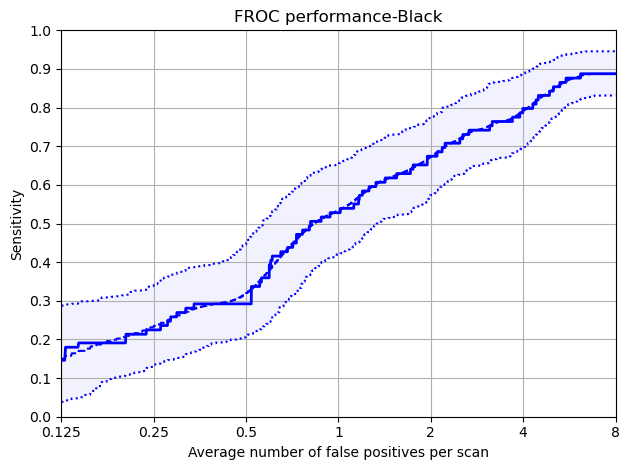

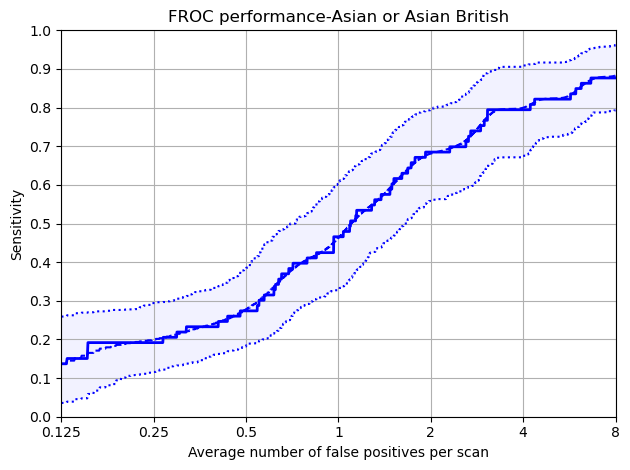

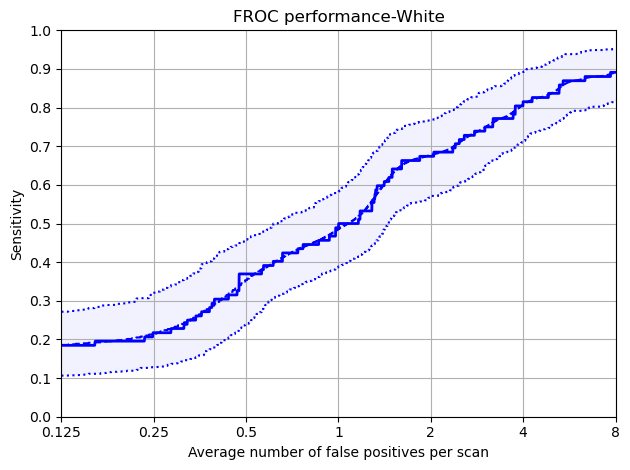

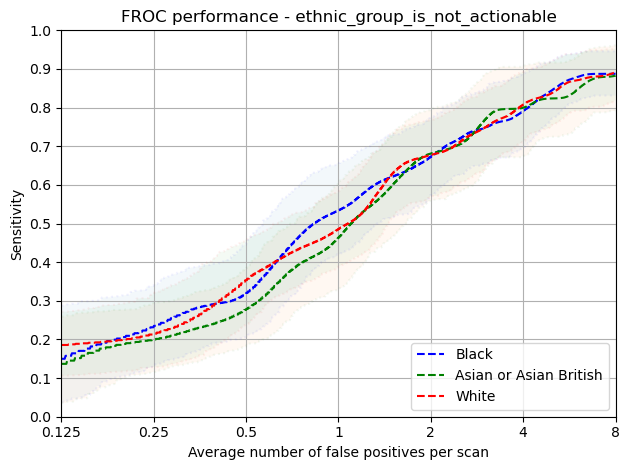

In [16]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable IMDRank

Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,43.0,22.0,5.0,15.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpilf9866e/annotations.csv
Total number of included nodule annotations: 111
Total number of nodule annotations: 111
Cases: 54


100%|██████████| 1000/1000 [00:01<00:00, 525.29it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/imdrank_is_actionable/High_IMDRank_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.178 (0.086 - 0.299),0.238 (0.124 - 0.363),0.308 (0.186 - 0.422),0.386 (0.274 - 0.495),0.502 (0.361 - 0.631),0.669 (0.546 - 0.776),0.765 (0.664 - 0.859)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.178,0.086,0.299
159,0.250,0.238,0.124,0.363
476,0.500,0.308,0.186,0.422
1111,1.000,0.386,0.274,0.495
2381,2.000,0.502,0.361,0.631
4920,4.000,0.669,0.546,0.776
9999,8.000,0.765,0.664,0.859


Mean Sensitivity: 0.44 Low Sensitivity: 0.32 High Sensitivity: 0.549


,True positives,90
0,False positives,1343.000
1,False negatives,21.000
2,True negatives,0.000
3,Total number of candidates,1436.000
4,Total number of nodules,111.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,3.000
7,Sensitivity,0.811
8,Average number of candidates per scan,26.593


Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,43.0,7.0,12.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpfwknq3qs/annotations.csv
Total number of included nodule annotations: 121
Total number of nodule annotations: 121
Cases: 49


100%|██████████| 1000/1000 [00:01<00:00, 621.22it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/imdrank_is_actionable/Medium_IMDRank_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.125 (0.046 - 0.24),0.178 (0.087 - 0.299),0.257 (0.147 - 0.402),0.376 (0.263 - 0.52),0.524 (0.419 - 0.645),0.691 (0.609 - 0.776),0.766 (0.671 - 0.848)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.125,0.046,0.240
159,0.250,0.178,0.087,0.299
476,0.500,0.257,0.147,0.402
1111,1.000,0.376,0.263,0.520
2381,2.000,0.524,0.419,0.645
4920,4.000,0.691,0.609,0.776
9999,8.000,0.766,0.671,0.848


Mean Sensitivity: 0.42 Low Sensitivity: 0.32 High Sensitivity: 0.533


,True positives,108
0,False positives,1042.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,1158.000
4,Total number of nodules,121.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.893
8,Average number of candidates per scan,23.633


Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,46.0,5.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpftpbbb90/annotations.csv
Total number of included nodule annotations: 206
Total number of nodule annotations: 206
Cases: 69


100%|██████████| 1000/1000 [00:02<00:00, 474.51it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/imdrank_is_actionable/Low_IMDRank_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.144 (0.095 - 0.214),0.188 (0.12 - 0.279),0.279 (0.185 - 0.386),0.383 (0.284 - 0.497),0.475 (0.379 - 0.583),0.65 (0.526 - 0.757),0.781 (0.714 - 0.848)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.144,0.095,0.214
159,0.250,0.188,0.120,0.279
476,0.500,0.279,0.185,0.386
1111,1.000,0.383,0.284,0.497
2381,2.000,0.475,0.379,0.583
4920,4.000,0.650,0.526,0.757
9999,8.000,0.781,0.714,0.848


Mean Sensitivity: 0.41 Low Sensitivity: 0.33 High Sensitivity: 0.509


,True positives,181
0,False positives,1456.000
1,False negatives,25.000
2,True negatives,0.000
3,Total number of candidates,1646.000
4,Total number of nodules,206.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.879
8,Average number of candidates per scan,23.855


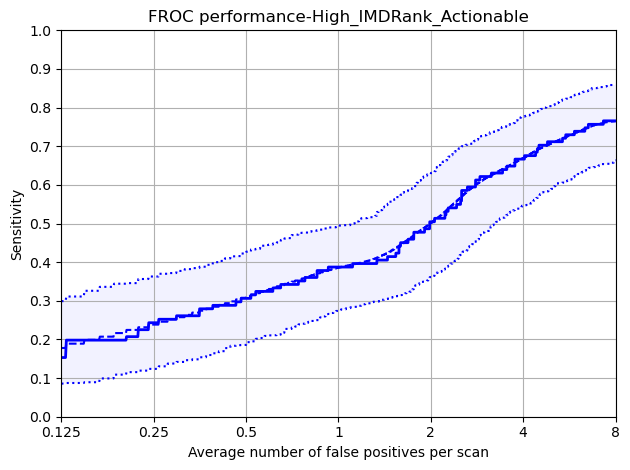

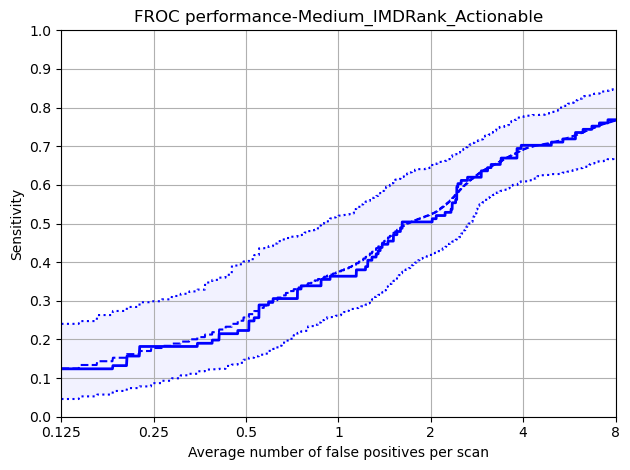

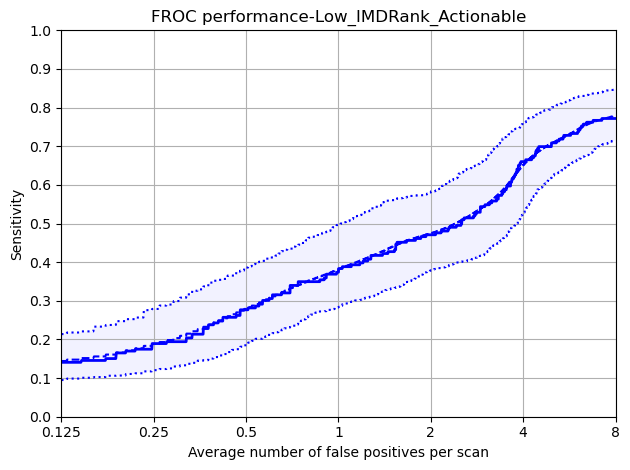

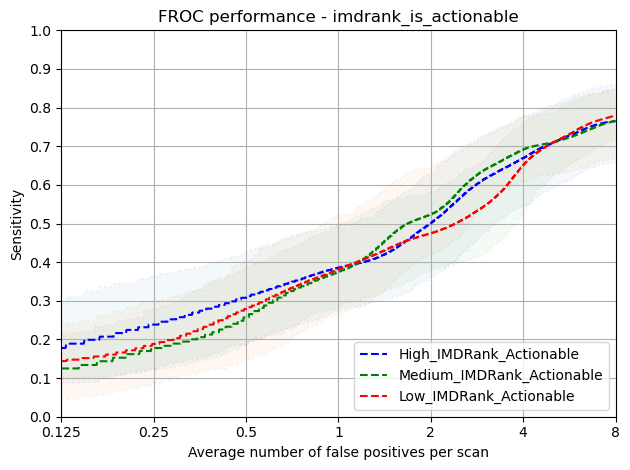

In [17]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Smoking Status

Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,38.0,38.0,4.0,9.0,11.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp5_srnak4/annotations.csv
Total number of included nodule annotations: 181
Total number of nodule annotations: 181
Cases: 71


100%|██████████| 1000/1000 [00:02<00:00, 470.28it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/smoking_pack_years_is_actionable/Low_Pack_Years_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.136 (0.08 - 0.208),0.172 (0.101 - 0.258),0.281 (0.166 - 0.392),0.353 (0.268 - 0.459),0.479 (0.374 - 0.594),0.647 (0.545 - 0.741),0.755 (0.676 - 0.829)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.136,0.080,0.208
159,0.250,0.172,0.101,0.258
476,0.500,0.281,0.166,0.392
1111,1.000,0.353,0.268,0.459
2381,2.000,0.479,0.374,0.594
4920,4.000,0.647,0.545,0.741
9999,8.000,0.755,0.676,0.829


Mean Sensitivity: 0.4 Low Sensitivity: 0.32 High Sensitivity: 0.497


,True positives,158
0,False positives,1554.000
1,False negatives,23.000
2,True negatives,0.000
3,Total number of candidates,1716.000
4,Total number of nodules,181.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,4.000
7,Sensitivity,0.873
8,Average number of candidates per scan,24.169


Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,39.0,9.0,13.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmphwjs13z2/annotations.csv
Total number of included nodule annotations: 127
Total number of nodule annotations: 127
Cases: 50


100%|██████████| 1000/1000 [00:01<00:00, 564.63it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/smoking_pack_years_is_actionable/High_Pack_Years_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.17 (0.083 - 0.293),0.227 (0.123 - 0.363),0.298 (0.178 - 0.447),0.408 (0.282 - 0.558),0.509 (0.397 - 0.653),0.671 (0.564 - 0.779),0.761 (0.677 - 0.839)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.170,0.083,0.293
159,0.250,0.227,0.123,0.363
476,0.500,0.298,0.178,0.447
1111,1.000,0.408,0.282,0.558
2381,2.000,0.509,0.397,0.653
4920,4.000,0.671,0.564,0.779
9999,8.000,0.761,0.677,0.839


Mean Sensitivity: 0.43 Low Sensitivity: 0.33 High Sensitivity: 0.562


,True positives,107
0,False positives,1229.000
1,False negatives,20.000
2,True negatives,0.000
3,Total number of candidates,1337.000
4,Total number of nodules,127.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.843
8,Average number of candidates per scan,26.740


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,38.0,5.0,10.0,11.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpm4qjpupb/annotations.csv
Total number of included nodule annotations: 133
Total number of nodule annotations: 133
Cases: 53


100%|██████████| 1000/1000 [00:01<00:00, 592.48it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/test_balanced/smoking_pack_years_is_actionable/Medium_Pack_Years_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.129 (0.051 - 0.228),0.182 (0.084 - 0.305),0.257 (0.151 - 0.383),0.371 (0.253 - 0.5),0.514 (0.376 - 0.65),0.671 (0.542 - 0.788),0.803 (0.716 - 0.886)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.129,0.051,0.228
159,0.250,0.182,0.084,0.305
476,0.500,0.257,0.151,0.383
1111,1.000,0.371,0.253,0.500
2381,2.000,0.514,0.376,0.650
4920,4.000,0.671,0.542,0.788
9999,8.000,0.803,0.716,0.886


Mean Sensitivity: 0.42 Low Sensitivity: 0.31 High Sensitivity: 0.534


,True positives,115
0,False positives,1101.000
1,False negatives,18.000
2,True negatives,0.000
3,Total number of candidates,1231.000
4,Total number of nodules,133.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,15.000
7,Sensitivity,0.865
8,Average number of candidates per scan,23.226


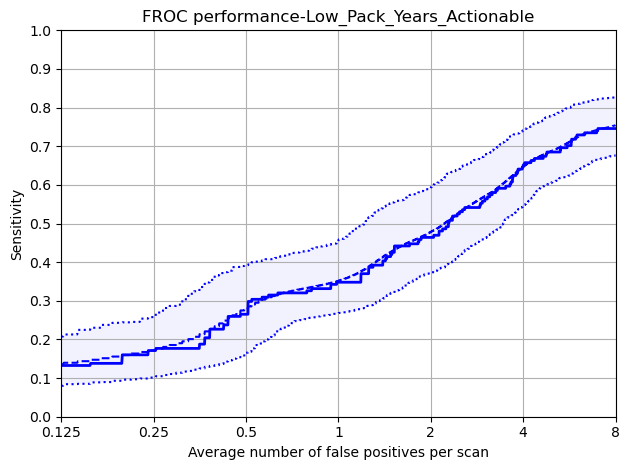

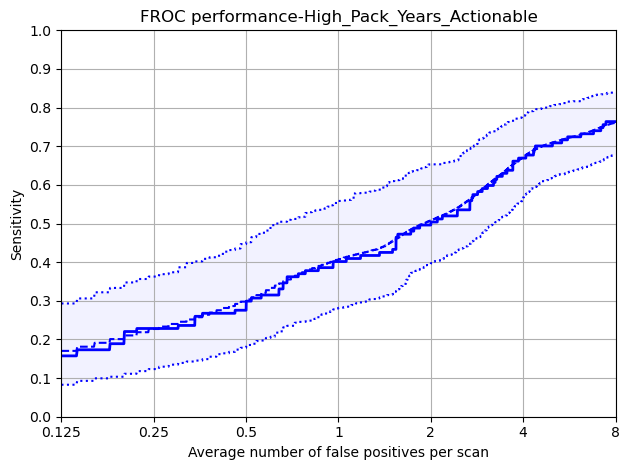

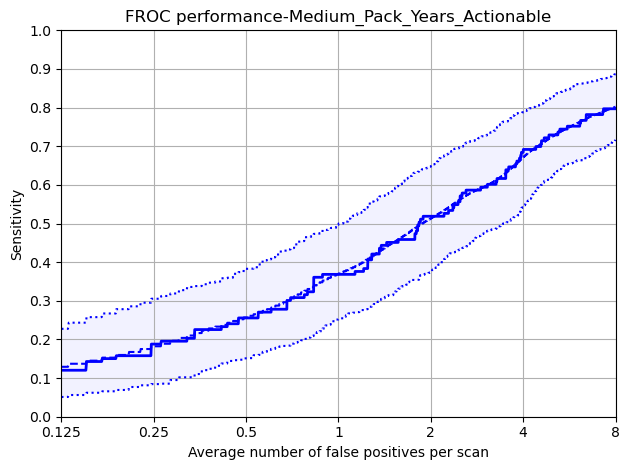

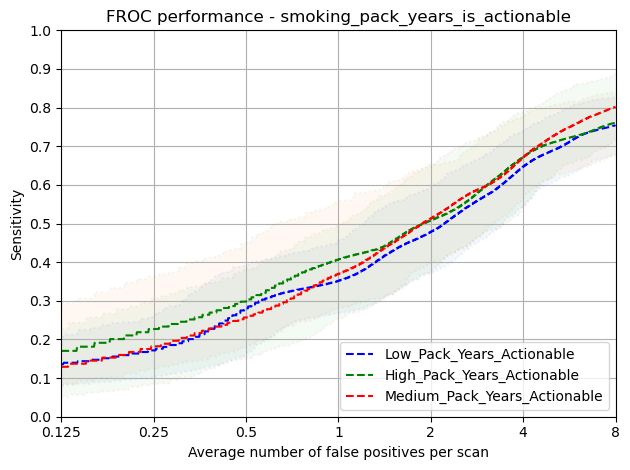

In [18]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### False positive and Miss Investigations

In [19]:
import importlib
import utils

importlib.reload(utils)

<module 'utils' from '/Users/john/Projects/SOTAEvaluationNoduleDetection/notebooks/FairnessInNoduleDetectionAlgorithms/utils.py'>

In [50]:
thresholds = utils.get_thresholds(grt123_summit_summit)
missed_metadata = utils.miss_anaysis_at_fpps(
    model='grt123',
    experiment=flavour,
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    annotations_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    predictions_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv',
    thresholds=thresholds
)


/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/test_balanced/test_balanced_metadata.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
Missed Annotations at 7.2206535 FPPs: 594
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/test_balanced/test_balanced_metadata.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
Missed Annotations at 6.7395515 FPPs: 554
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/test_balanced/test_balanced_metadata.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
Missed Annotations at 6.1739454 FPPs: 496
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/test_balanced/test_balanced_metadata.csv
Total number o

#### Incremental FROC Scores - Gender/ Ethnic Group/ Nodule Type

In [51]:

hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)


In [52]:


recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    pass

    recode_dict[idx] = hmm

df = pd.DataFrame.from_dict(recode_dict, orient='index')

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    if group1_name not in df.columns or group2_name not in df.columns:
        print(f'Error: {group1_name} or {group2_name} not in dataframe')
        return

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** {type} ***')
    group1 = f'all_White_{type}_Hits%'
    group2 = f'all_Asian or Asian British_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

all_MALE_SOLID_Hits%                                     21, 33, 43, 57, 66, 81, 93
all_MALE_NON_SOLID_Hits%                                    4, 7, 7, 14, 21, 39, 46
all_MALE_PART_SOLID_Hits%                                11, 22, 22, 33, 33, 67, 78
all_MALE_PERIFISSURAL_Hits%                              13, 17, 24, 39, 55, 75, 85
all_MALE_CALCIFIED_Hits%                                   0, 6, 12, 12, 25, 38, 50
all_FEMALE_SOLID_Hits%                                   27, 33, 44, 54, 65, 73, 83
all_FEMALE_NON_SOLID_Hits%                                  0, 0, 0, 10, 19, 43, 52
all_FEMALE_PART_SOLID_Hits%                              31, 31, 44, 50, 50, 56, 69
all_FEMALE_PERIFISSURAL_Hits%                            11, 16, 26, 38, 59, 78, 86
all_FEMALE_CALCIFIED_Hits%                               16, 20, 32, 52, 64, 68, 68
all_All_SOLID_Hits%                                      24, 33, 43, 56, 66, 78, 89
all_All_NON_SOLID_Hits%                                     2, 4, 4, 12, 20,

*** SOLID ***
**************************************************
Independent T-Test: 0.291, 0.776
*** NON_SOLID ***
**************************************************
Independent T-Test: 0.459, 0.655
*** PART_SOLID ***
**************************************************
Independent T-Test: 1.757, 0.104
*** PERIFISSURAL ***
**************************************************
Independent T-Test: 0.701, 0.497
*** CALCIFIED ***
**************************************************
Independent T-Test: 2.603, 0.023


#### Nodule Characteristic Analysis

,0-6mm,6-8mm,8-30mm,30-40mm,40+mm
0.125,0.02,0.21,0.30,0.29,0.5
0.25,0.06,0.30,0.36,0.29,0.5
0.5,0.13,0.41,0.44,0.43,0.5
1,0.27,0.56,0.53,0.43,0.5
2,0.46,0.68,0.64,0.43,0.5
4,0.66,0.82,0.76,0.57,0.5
8,0.80,0.87,0.82,0.71,0.5
Total Annotations,2502.00,1822.00,2144.00,38.00,8.0


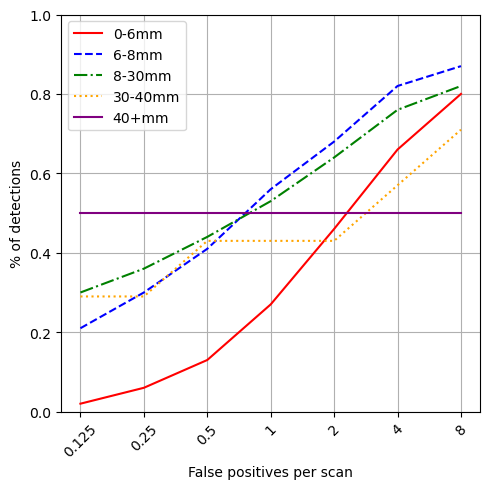

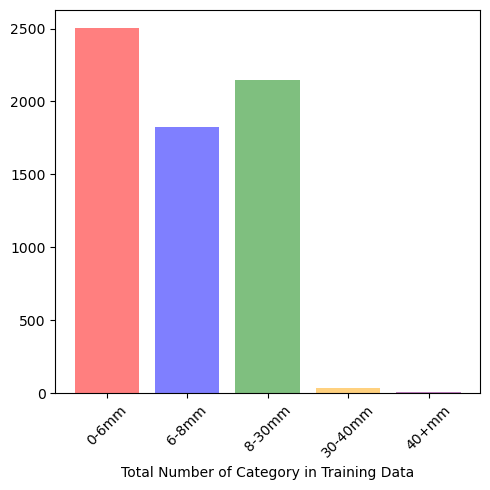

,SOLID,NON_SOLID,PART_SOLID,CALCIFIED
0.125,0.24,0.02,0.24,0.10
0.25,0.33,0.04,0.28,0.15
0.5,0.43,0.04,0.36,0.24
1,0.56,0.12,0.44,0.37
2,0.66,0.20,0.44,0.49
4,0.78,0.41,0.60,0.56
8,0.89,0.49,0.72,0.61
Total Annotations,1984.00,377.00,355.00,533.00


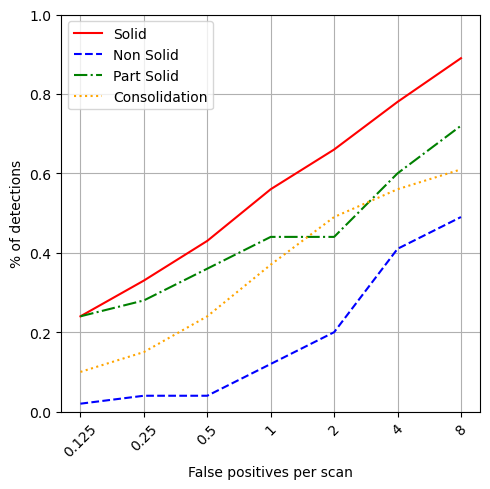

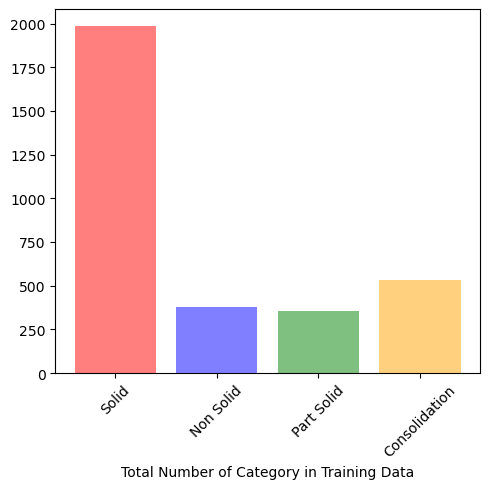

,LEFT_LOWER_LOBE,LEFT_UPPER_LOBE,RIGHT_UPPER_LOBE,RIGHT_LOWER_LOBE
0.125,0.13,0.10,0.11,0.22
0.25,0.19,0.14,0.17,0.27
0.5,0.28,0.20,0.26,0.34
1,0.44,0.28,0.38,0.49
2,0.58,0.41,0.51,0.65
4,0.73,0.60,0.69,0.80
8,0.83,0.74,0.78,0.86
Total Annotations,1163.00,952.00,1434.00,1215.00


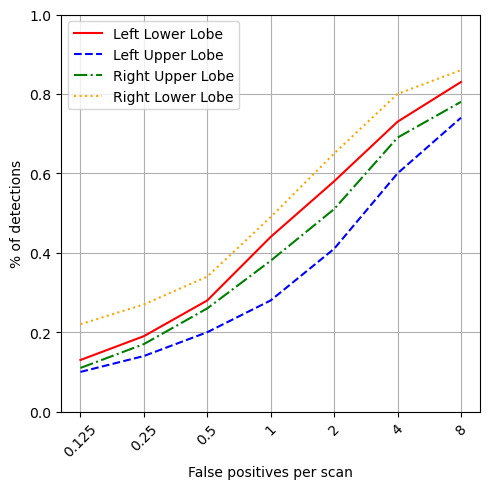

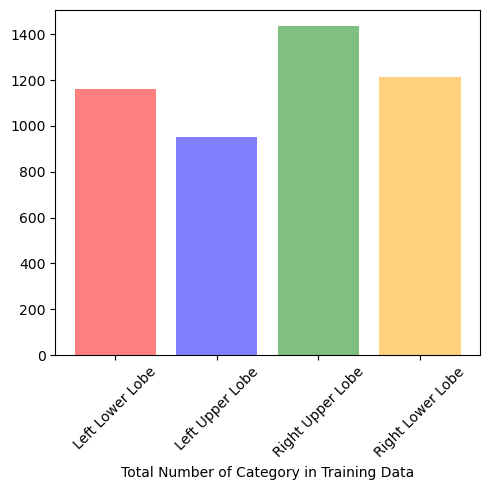

In [57]:

def cleanup(s):
    if s == 'CALCIFIED':
         return 'Consolidation'
    
    s = s.replace('_', ' ')
    s = ' '.join(word.capitalize() for word in s.split())
    return s

nodule_characteristics = {
    'diameter_cats': diameter_lbs,
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'CALCIFIED'],
    'nodule_site': [ 'LEFT_LOWER_LOBE', 'LEFT_MIDDLE_LOBE', 'LEFT_UPPER_LOBE', 'RIGHT_UPPER_LOBE', 'RIGHT_LOWER_LOBE']
}


colors = ['red','blue','green','orange','purple','brown','pink']

for ivx, (var, order) in enumerate(nodule_characteristics.items()):

    training_data = (
        pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/training_metadata.csv')
        .assign(diameter_cats=lambda df: 
            pd.cut(
                df['nodule_diameter_mm'], 
                bins=diameter_cats,
                labels=diameter_lbs
            )            
        ))


    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    total_vc = training_data[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)

    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    total_vc = total_vc[total_vc.index.isin(df.index)].reindex(df.index)


    for isx, column in enumerate(df.T):    
        ax.plot(df.T[column], label=cleanup(column), linestyle=line_styles[isx], color=colors[isx])
            

    ax.set_xticklabels(labels=df.columns, rotation=45)
    ax.legend()    
    ax.set_xlabel('False positives per scan')
    ax.set_ylim(0, 1)
    ax.set_ylabel('% of detections')
    ax.grid(visible=True, which='both')

    plt.tight_layout()
    plt.savefig(f'{workspace_path}/miccai_fair_ai/grt123_detected_nodule_characteristics_{var}.png')
    plt.show()


    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    ax.bar([cleanup(idx) for idx in total_vc.index], total_vc, alpha=0.5, label=cleanup(column), color=colors)
    ax.set_xticklabels(labels=[cleanup(idx) for idx in total_vc.index], rotation=45)
    ax.set_xlabel('Total Number of Category in Training Data')

    plt.tight_layout()
    plt.savefig(f'{workspace_path}/miccai_fair_ai/grt123_detected_nodule_characteristics_{var}_total.png')
    plt.show()

In [24]:
import importlib
import utils

importlib.reload(utils)


def combine_counts_and_percs(df):

    output = {}

    for idx, rows in df.iterrows():

        output[idx] = {}
        output[idx]['Female Hits (%)'] = f"{rows['Female Hits Cnt']} ({rows['Female Hits Per']}%)"
        output[idx]['Female Misses (%)'] = f"{rows['Female Miss Cnt']} ({rows['Female Miss Per']}%)"
        output[idx]['Male Hits (%)'] = f"{rows['Male Hits Cnt']} ({rows['Male Hits Per']}%)"
        output[idx]['Male Misses (%)'] = f"{rows['Male Miss Cnt']} ({rows['Male Miss Per']}%)"


    return pd.DataFrame.from_dict(output, orient='index')


training_data = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/training_metadata.csv')
    .assign(diameter_cats=lambda df: 
        pd.cut(
            df['nodule_diameter_mm'], 
            bins=diameter_cats,
            labels=diameter_lbs
        )            
    ))

training_data['type_by_size'] = (training_data['nodule_type'].astype(str) + '_' + training_data['diameter_cats'].astype(str)).astype(str)



x_training = pd.crosstab(
    training_data['type_by_size'],
    training_data['gender'],
).merge(
    training_data['type_by_size'].value_counts().rename('Training Data').to_frame()
    , left_index=True, right_index=True
)


test_data = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_metadata.csv')
    .assign(diameter_cats=lambda df: 
        pd.cut(
            df['nodule_diameter_mm'], 
            bins=diameter_cats,
            labels=diameter_lbs
        )            
    ))

test_data['type_by_size'] = (test_data['nodule_type'].astype(str) + '_' + test_data['diameter_cats'].astype(str)).astype(str)

x_test = pd.crosstab(
    test_data['type_by_size'],
    test_data['gender'],
    normalize='columns'
).merge(
    test_data['type_by_size'].value_counts(normalize=True).rename('Test Data').to_frame()
    , left_index=True, right_index=True
).applymap(lambda x: round(100*x,1))


x_training = x_training.merge(x_test, left_index=True, right_index=True)

x_training.to_csv('x_training.csv')
display(x_training)

x_merge_list = []
for mm in missed_metadata:

    mma = mm[mm['management_plan'].isin(['3_MONTH_FOLLOW_UP_SCAN','URGENT_REFERRAL', 'ALWAYS_SCAN_AT_YEAR_1'])]
    mma['diameter_cats'] = pd.cut(mma['nodule_diameter_mm'], bins=diameter_cats, labels=diameter_lbs)

    mma['type_by_size'] = (mma['nodule_type'].astype(str) + '_' + mma['diameter_cats'].astype(str)).astype(str)

    female = mma[mma.gender=='FEMALE']

    female_x = pd.crosstab(
        female['type_by_size'],
        female['miss'],
        margins=True,
    ).rename(columns={0:'Female Hits Cnt',1:'Female Miss Cnt'})

    male = mma[mma.gender=='MALE']

    male_x_perc = pd.crosstab(
        male['type_by_size'],
        male['miss'],
        normalize='index',
        margins=True,
    ).rename(columns={0:'Male Hits Per',1:'Male Miss Per'})

    female_x_perc = pd.crosstab(
        female['type_by_size'],
        female['miss'],
        normalize='index',
        margins=True,
    ).rename(columns={0:'Female Hits Per',1:'Female Miss Per'})

    male = mma[mma.gender=='MALE']

    male_x = pd.crosstab(
        male['type_by_size'],
        male['miss'],
        margins=True,
    ).rename(columns={0:'Male Hits Cnt',1:'Male Miss Cnt'})    

    x_merged = (female_x.merge(
            male_x, 
            how='outer', 
            left_index=True,
            right_index=True
        ).fillna(0))
    
    x_merged_perc = (female_x_perc.merge(
            male_x_perc, 
            how='outer', 
            left_index=True,
            right_index=True
        ).fillna(0).applymap(lambda x: round(100*x,1)))
    
    x_merge_list.append(x_merged)

    x_combined = combine_counts_and_percs(
        x_merged.merge(x_merged_perc, left_index=True, right_index=True)
    ).merge(x_training, how='left', left_index=True, right_index=True).sort_values('Training Data', ascending=False)

    display(x_combined)


pd.concat(x_merge_list, axis=1).to_csv(f'{workspace_path}/grt123_missed_nodule_characteristics.csv')


,FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
CALCIFIED_0-6mm,76,62,138,1.7,1.8,1.7
CALCIFIED_30-40mm,6,12,18,0.3,0.5,0.4
CALCIFIED_6-8mm,21,34,55,0.3,0.2,0.3
CALCIFIED_8-30mm,148,146,294,5.7,1.2,3.1
CALCIFIED_nan,15,10,25,0.3,0.2,0.3
NON_SOLID_0-6mm,25,19,44,1.7,1.2,1.4
NON_SOLID_6-8mm,31,29,60,2.0,1.0,1.4
NON_SOLID_8-30mm,135,132,267,3.3,4.8,4.1
PART_SOLID_0-6mm,11,6,17,0.7,0.0,0.3
PART_SOLID_30-40mm,1,4,5,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,1.0 (8.3%),11.0 (91.7%),6.0 (33.3%),12.0 (66.7%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,15.0 (45.5%),18.0 (54.5%),16.0 (33.3%),32.0 (66.7%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,0.0 (0.0%),3.0 (100.0%),1.0 (33.3%),2.0 (66.7%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,2.0 (11.8%),15.0 (88.2%),0.0 (0.0%),5.0 (100.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,5.0 (45.5%),6.0 (54.5%),1.0 (20.0%),4.0 (80.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,0.0 (0.0%),10.0 (100.0%),1.0 (5.3%),18.0 (94.7%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,0.0 (0.0%),5.0 (100.0%),0.0 (0.0%),7.0 (100.0%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,0.0 (0.0%),6.0 (100.0%),0.0 (0.0%),4.0 (100.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,0.0 (0.0%),2.0 (100.0%),0.0 (0.0%),3.0 (100.0%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,1.0 (100.0%),0.0 (0.0%),0.0 (0.0%),1.0 (100.0%),21.0,34.0,55.0,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,2.0 (16.7%),10.0 (83.3%),9.0 (50.0%),9.0 (50.0%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,16.0 (48.5%),17.0 (51.5%),21.0 (43.8%),27.0 (56.2%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,1.0 (33.3%),2.0 (66.7%),1.0 (33.3%),2.0 (66.7%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,3.0 (17.6%),14.0 (82.4%),0.0 (0.0%),5.0 (100.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,5.0 (45.5%),6.0 (54.5%),1.0 (20.0%),4.0 (80.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,0.0 (0.0%),10.0 (100.0%),2.0 (10.5%),17.0 (89.5%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,0.0 (0.0%),5.0 (100.0%),0.0 (0.0%),7.0 (100.0%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,0.0 (0.0%),6.0 (100.0%),0.0 (0.0%),4.0 (100.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,0.0 (0.0%),2.0 (100.0%),1.0 (33.3%),2.0 (66.7%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,1.0 (100.0%),0.0 (0.0%),1.0 (100.0%),0.0 (0.0%),21.0,34.0,55.0,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,4.0 (33.3%),8.0 (66.7%),10.0 (55.6%),8.0 (44.4%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,19.0 (57.6%),14.0 (42.4%),25.0 (52.1%),23.0 (47.9%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,1.0 (33.3%),2.0 (66.7%),2.0 (66.7%),1.0 (33.3%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,5.0 (29.4%),12.0 (70.6%),0.0 (0.0%),5.0 (100.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,6.0 (54.5%),5.0 (45.5%),1.0 (20.0%),4.0 (80.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,0.0 (0.0%),10.0 (100.0%),2.0 (10.5%),17.0 (89.5%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,1.0 (20.0%),4.0 (80.0%),0.0 (0.0%),7.0 (100.0%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,0.0 (0.0%),6.0 (100.0%),0.0 (0.0%),4.0 (100.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,1.0 (50.0%),1.0 (50.0%),1.0 (33.3%),2.0 (66.7%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,1.0 (100.0%),0.0 (0.0%),1.0 (100.0%),0.0 (0.0%),21.0,34.0,55.0,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,5.0 (41.7%),7.0 (58.3%),13.0 (72.2%),5.0 (27.8%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,21.0 (63.6%),12.0 (36.4%),28.0 (58.3%),20.0 (41.7%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,2.0 (66.7%),1.0 (33.3%),2.0 (66.7%),1.0 (33.3%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,10.0 (58.8%),7.0 (41.2%),0.0 (0.0%),5.0 (100.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,7.0 (63.6%),4.0 (36.4%),2.0 (40.0%),3.0 (60.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,0.0 (0.0%),10.0 (100.0%),3.0 (15.8%),16.0 (84.2%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,1.0 (20.0%),4.0 (80.0%),0.0 (0.0%),7.0 (100.0%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,2.0 (33.3%),4.0 (66.7%),1.0 (25.0%),3.0 (75.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,1.0 (50.0%),1.0 (50.0%),1.0 (33.3%),2.0 (66.7%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,1.0 (100.0%),0.0 (0.0%),1.0 (100.0%),0.0 (0.0%),21.0,34.0,55.0,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,8.0 (66.7%),4.0 (33.3%),15.0 (83.3%),3.0 (16.7%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,24.0 (72.7%),9.0 (27.3%),32.0 (66.7%),16.0 (33.3%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,2.0 (66.7%),1.0 (33.3%),2.0 (66.7%),1.0 (33.3%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,13.0 (76.5%),4.0 (23.5%),1.0 (20.0%),4.0 (80.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,7.0 (63.6%),4.0 (36.4%),2.0 (40.0%),3.0 (60.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,1.0 (10.0%),9.0 (90.0%),5.0 (26.3%),14.0 (73.7%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,1.0 (20.0%),4.0 (80.0%),1.0 (14.3%),6.0 (85.7%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,2.0 (33.3%),4.0 (66.7%),1.0 (25.0%),3.0 (75.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,1.0 (50.0%),1.0 (50.0%),1.0 (33.3%),2.0 (66.7%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,1.0 (100.0%),0.0 (0.0%),1.0 (100.0%),0.0 (0.0%),21.0,34.0,55.0,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,8.0 (66.7%),4.0 (33.3%),17.0 (94.4%),1.0 (5.6%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,25.0 (75.8%),8.0 (24.2%),38.0 (79.2%),10.0 (20.8%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,2.0 (66.7%),1.0 (33.3%),3.0 (100.0%),0.0 (0.0%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,14.0 (82.4%),3.0 (17.6%),3.0 (60.0%),2.0 (40.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,8.0 (72.7%),3.0 (27.3%),3.0 (60.0%),2.0 (40.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,4.0 (40.0%),6.0 (60.0%),9.0 (47.4%),10.0 (52.6%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,1.0 (20.0%),4.0 (80.0%),1.0 (14.3%),6.0 (85.7%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,3.0 (50.0%),3.0 (50.0%),1.0 (25.0%),3.0 (75.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,1.0 (50.0%),1.0 (50.0%),2.0 (66.7%),1.0 (33.3%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,1.0 (100.0%),0.0 (0.0%),1.0 (100.0%),0.0 (0.0%),21.0,34.0,55.0,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,9.0 (75.0%),3.0 (25.0%),18.0 (100.0%),0.0 (0.0%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,27.0 (81.8%),6.0 (18.2%),42.0 (87.5%),6.0 (12.5%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,2.0 (66.7%),1.0 (33.3%),3.0 (100.0%),0.0 (0.0%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,14.0 (82.4%),3.0 (17.6%),4.0 (80.0%),1.0 (20.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,8.0 (72.7%),3.0 (27.3%),4.0 (80.0%),1.0 (20.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,4.0 (40.0%),6.0 (60.0%),11.0 (57.9%),8.0 (42.1%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,1.0 (20.0%),4.0 (80.0%),2.0 (28.6%),5.0 (71.4%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,5.0 (83.3%),1.0 (16.7%),1.0 (25.0%),3.0 (75.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,1.0 (50.0%),1.0 (50.0%),2.0 (66.7%),1.0 (33.3%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,1.0 (100.0%),0.0 (0.0%),1.0 (100.0%),0.0 (0.0%),21.0,34.0,55.0,0.3,0.2,0.3


In [25]:
missed_at_lowest = missed_metadata[0]
hits = missed_at_lowest[missed_at_lowest['miss'] == False]

(
    pd.crosstab(
        [
            hits['diameter_cats'],
            hits['nodule_type']
        ], 
        hits['nodule_site_combined'],
        normalize='all'
    )[['UPPER','NOT-UPPER']]
    .apply(lambda x: round(100 * x, 1))
)

nodule_site_combined        UPPER  NOT-UPPER
diameter_cats nodule_type                   
0-6mm         PERIFISSURAL    0.0        1.9
              SOLID           0.0        2.9
30-40mm       CALCIFIED       0.0        1.0
              SOLID           0.0        1.0
40+mm         SOLID           1.0        0.0
6-8mm         CALCIFIED       1.0        0.0
              PERIFISSURAL    1.0       11.4
              SOLID           2.9        6.7
8-30mm        CALCIFIED       0.0        1.9
              NON_SOLID       1.0        0.0
              PART_SOLID      1.9        2.9
              PERIFISSURAL    5.7        7.6
              SOLID          11.4       16.2

In [26]:
thresholds = get_thresholds(grt123_summit_summit)

scans = pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv')
predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv')
annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 178 at threshold: 7.2206535
distance false positives: 73 at threshold: 7.2206535
predictions: 290 at threshold: 6.7395515
distance false positives: 145 at threshold: 6.7395515
predictions: 495 at threshold: 6.1739454
distance false positives: 292 at threshold: 6.1739454
predictions: 886 at threshold: 5.448881
distance false positives: 594 at threshold: 5.448881
predictions: 1595 at threshold: 4.5769815
distance false positives: 1205 at threshold: 4.5769815
predictions: 2922 at threshold: 3.3151371
distance false positives: 2415 at threshold: 3.3151371
predictions: 5326 at threshold: 1.4922369
distance false positives: 4744 at threshold: 1.4922369


#### Examples of False Positives

summit-2477-ppd_Y0_BASELINE_A already exists
[[176.195       67.59        61.92         4.18984227]
 [ 99.015       51.19        31.24         5.00077949]
 [229.975      139.76        97.01        21.96288288]]
cropped_image shape: (24, 24, 24)


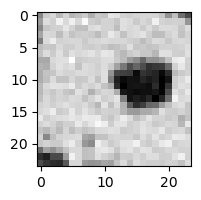

Min Intensity: 1, Mean Intensity: 136.35026041666666, Max Intensity: 206
summit-2477-ppd_Y0_BASELINE_A - 241.58118 141.58931 93.29571 24.342207
False Positive: True
IoU False Positive: 0.2618061935096805


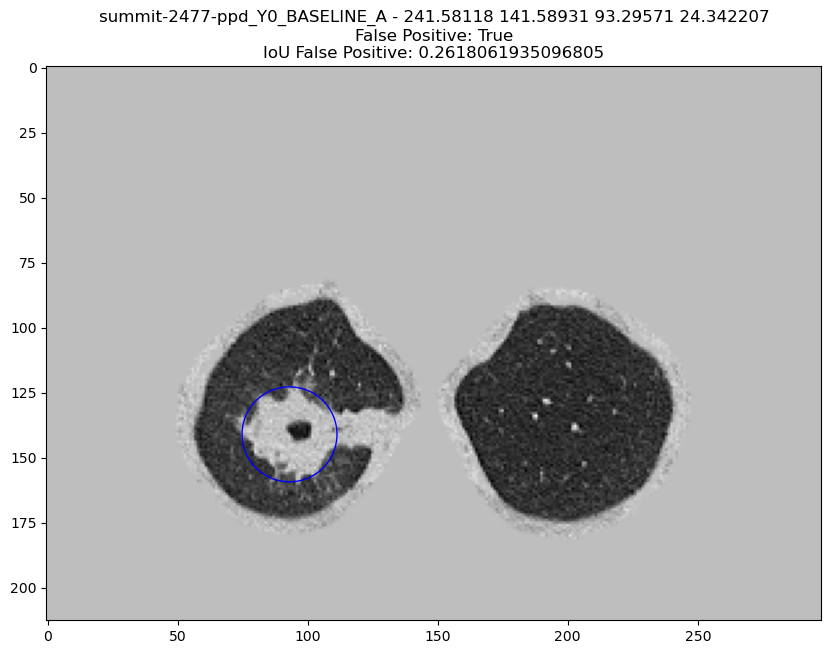

summit-4578-scm_Y0_BASELINE_A already exists
[[0 0 0 0]]
cropped_image shape: (24, 24, 24)


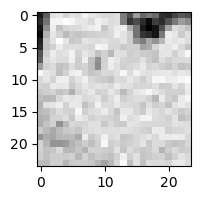

Min Intensity: 24, Mean Intensity: 145.09837962962962, Max Intensity: 210
summit-4578-scm_Y0_BASELINE_A - 201.61537 209.58585 69.32576 24.454403
False Positive: True
IoU False Positive: nan


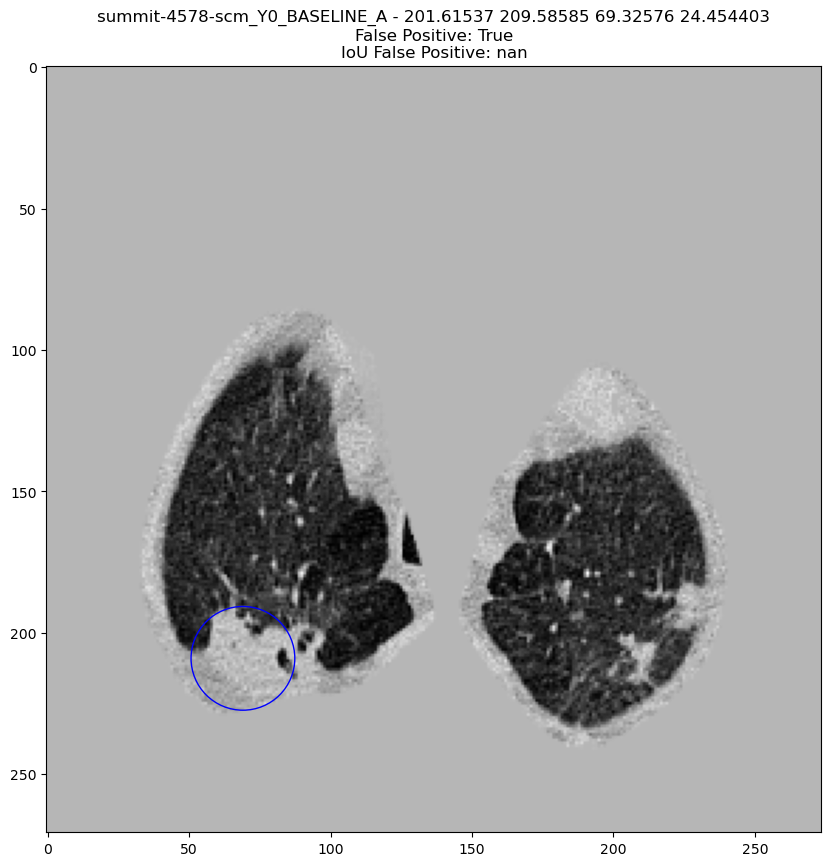

summit-4978-anz_Y0_BASELINE_A already exists
[[0 0 0 0]]
cropped_image shape: (9, 9, 9)


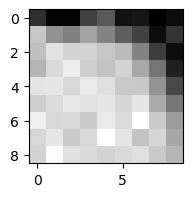

Min Intensity: 24, Mean Intensity: 95.7119341563786, Max Intensity: 207
summit-4978-anz_Y0_BASELINE_A - 202.30933 73.39236 96.555664 8.925204
False Positive: True
IoU False Positive: nan


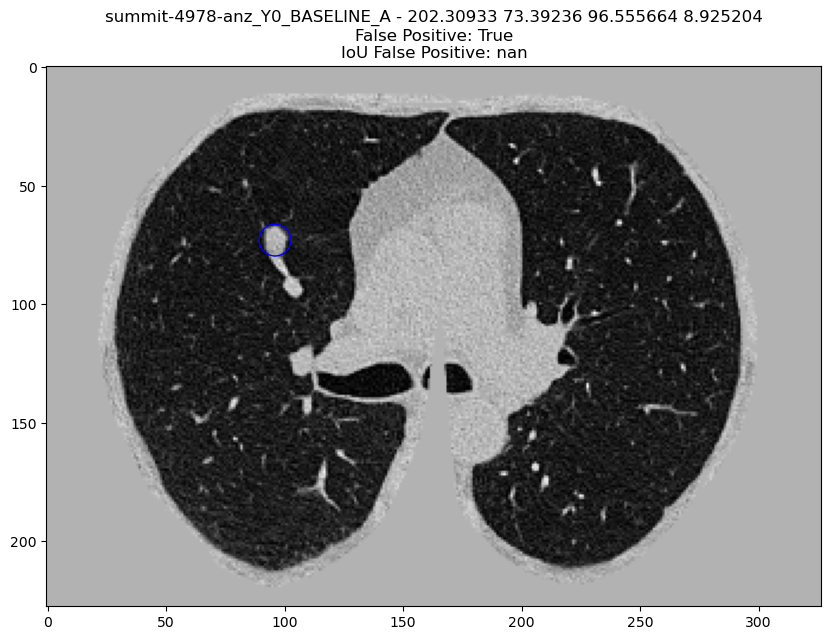

summit-9326-jcf_Y0_BASELINE_A already exists
[[156.21        80.37999695 266.2399939    2.553125  ]]
cropped_image shape: (7, 7, 6)


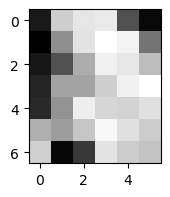

Min Intensity: 27, Mean Intensity: 136.1326530612245, Max Intensity: 201
summit-9326-jcf_Y0_BASELINE_A - 57.027893 156.91324 17.563618 6.8193555
False Positive: True
IoU False Positive: 0.0


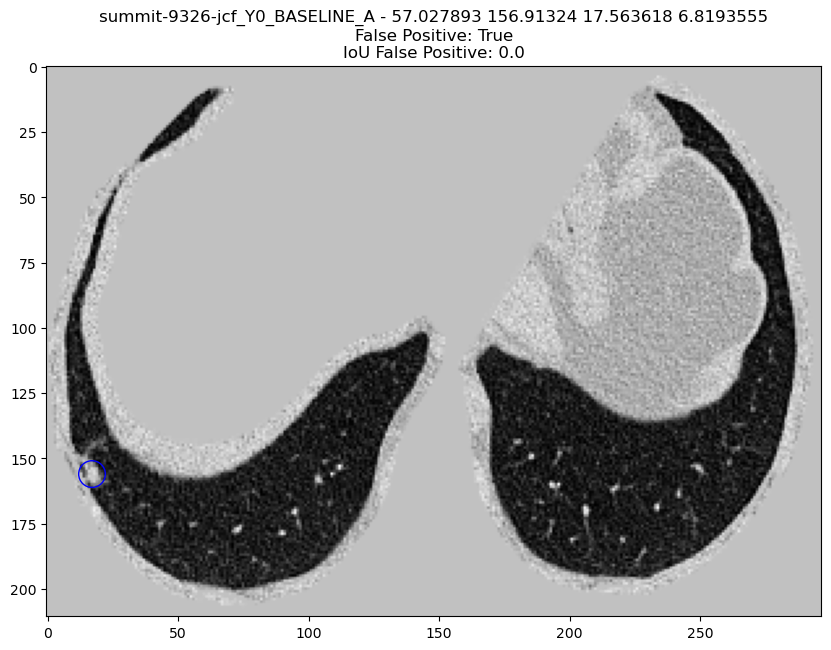

summit-3288-gfs_Y0_BASELINE_A already exists
[[0 0 0 0]]
cropped_image shape: (8, 8, 8)


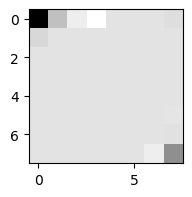

Min Intensity: 25, Mean Intensity: 154.505859375, Max Intensity: 203
summit-3288-gfs_Y0_BASELINE_A - 114.35067 176.82104 84.20917 8.196819
False Positive: True
IoU False Positive: nan


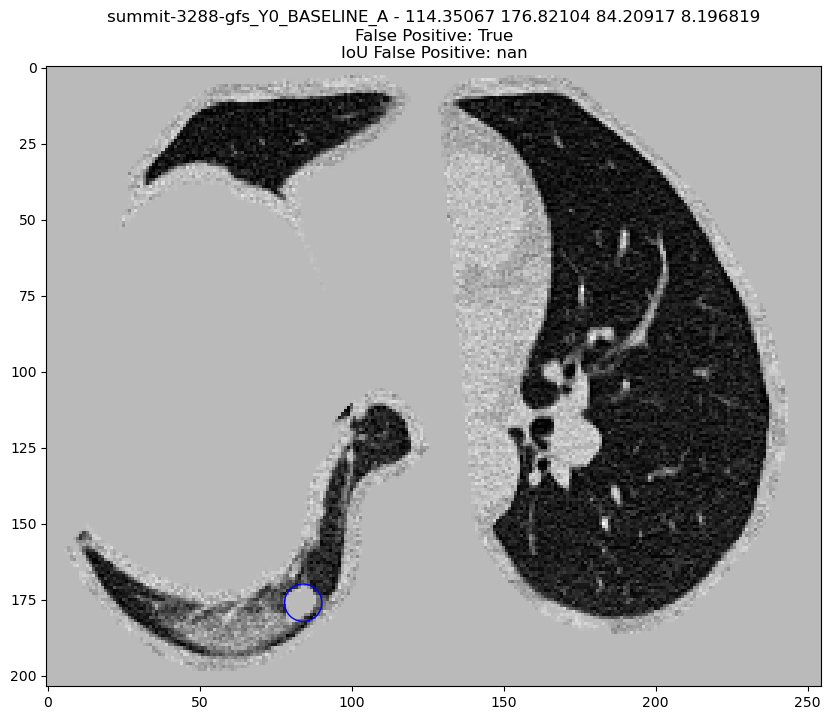

summit-3768-mgu_Y0_BASELINE_A already exists
[[131.88        92.94        92.2900061   19.00391288]]
cropped_image shape: (26, 26, 26)


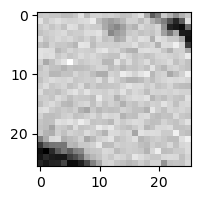

Min Intensity: 24, Mean Intensity: 109.90168411470187, Max Intensity: 218
summit-3768-mgu_Y0_BASELINE_A - 125.63948 77.64349 69.46979 26.383251
False Positive: True
IoU False Positive: 0.04573147508192739


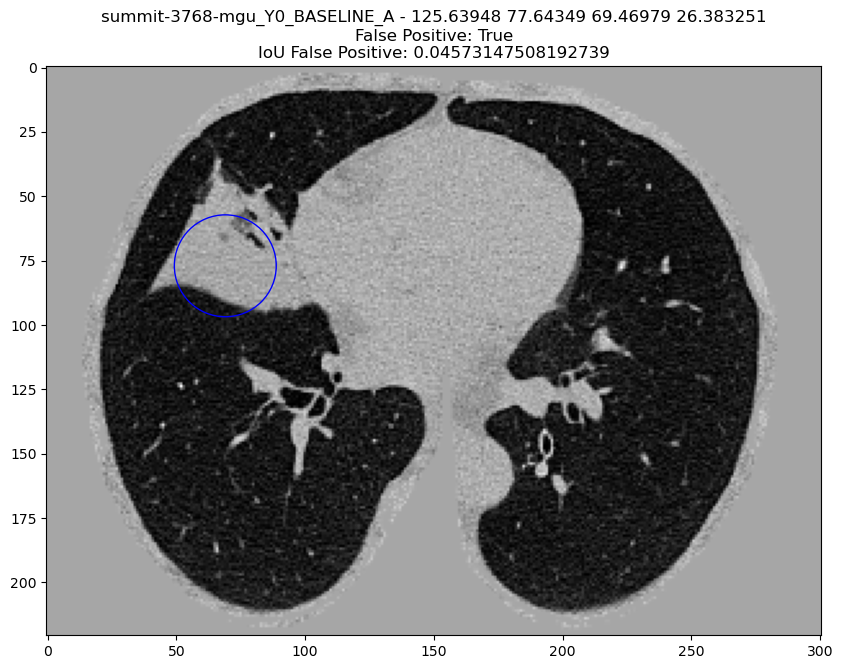

summit-9294-yyy_Y0_BASELINE_A already exists
[[0 0 0 0]]
cropped_image shape: (6, 5, 6)


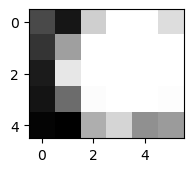

Min Intensity: 30, Mean Intensity: 140.55, Max Intensity: 255
summit-9294-yyy_Y0_BASELINE_A - 150.34537 101.987946 50.68444 5.7515306
False Positive: True
IoU False Positive: nan


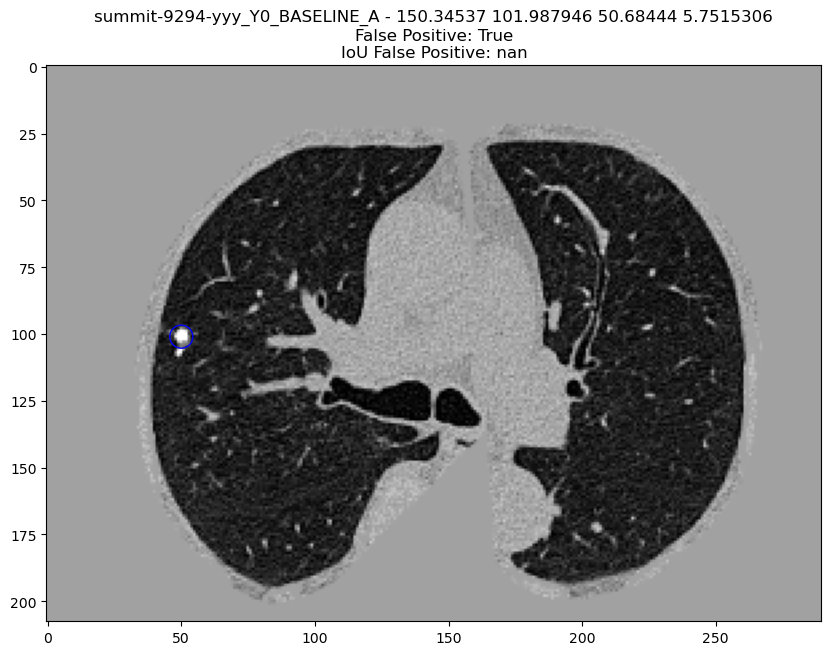

summit-9397-wse_Y0_BASELINE_A already exists
[[0 0 0 0]]
cropped_image shape: (10, 10, 10)


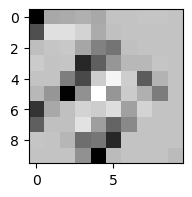

Min Intensity: 28, Mean Intensity: 155.463, Max Intensity: 205
summit-9397-wse_Y0_BASELINE_A - 242.23856 49.40045 120.402115 10.403505
False Positive: True
IoU False Positive: nan


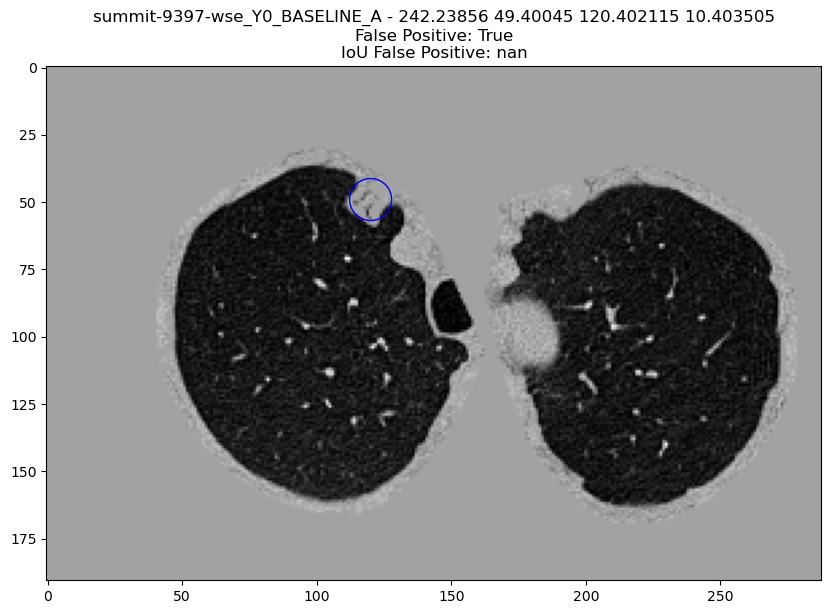

summit-3638-yab_Y0_BASELINE_A already exists
[[0 0 0 0]]
cropped_image shape: (6, 6, 5)


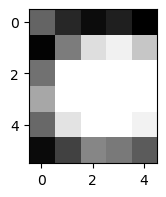

Min Intensity: 25, Mean Intensity: 125.76666666666667, Max Intensity: 255
summit-3638-yab_Y0_BASELINE_A - 126.52324 34.375774 82.235794 5.4221
False Positive: True
IoU False Positive: nan


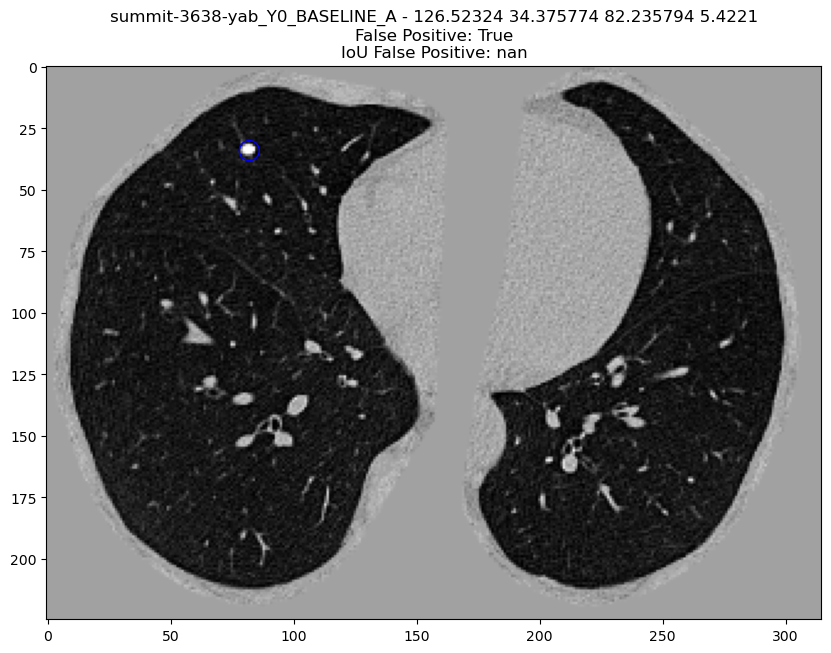

summit-7962-cga_Y0_BASELINE_A already exists
[[58.61       59.11       23.84999695  8.27734685]]
cropped_image shape: (6, 6, 6)


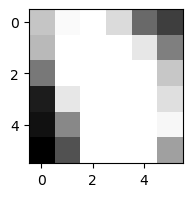

Min Intensity: 24, Mean Intensity: 132.08333333333334, Max Intensity: 255
summit-7962-cga_Y0_BASELINE_A - 222.75877 65.44562 97.234245 6.424183
False Positive: True
IoU False Positive: 0.0


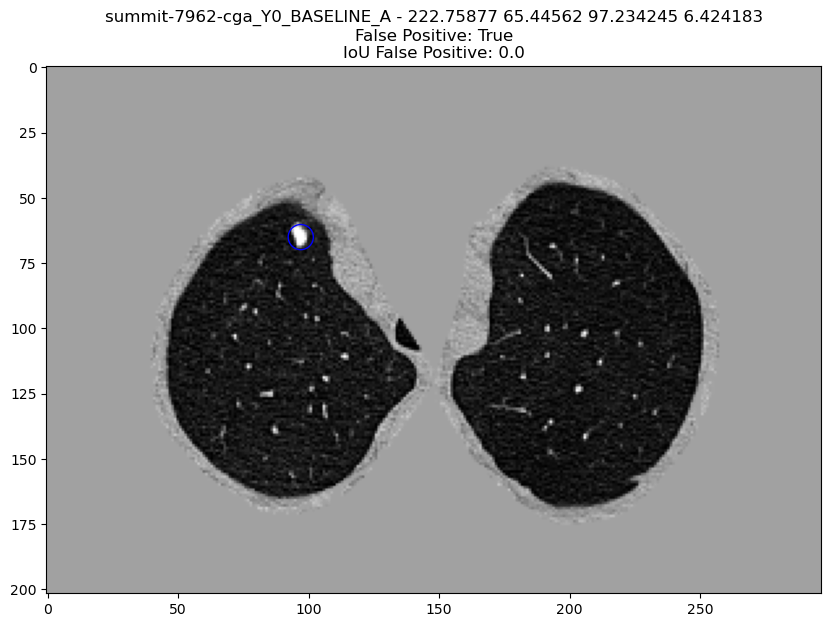

summit-8563-tkf_Y0_BASELINE_A already exists
[[191.805      181.65       104.0799939    4.66288898]
 [177.555      195.03        69.4099939    3.51406126]]
cropped_image shape: (7, 7, 7)


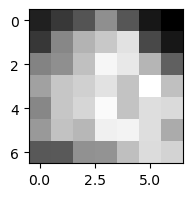

Min Intensity: 30, Mean Intensity: 89.6472303206997, Max Intensity: 185
summit-8563-tkf_Y0_BASELINE_A - 100.78754 57.05622 277.118 6.998582
False Positive: True
IoU False Positive: 0.0


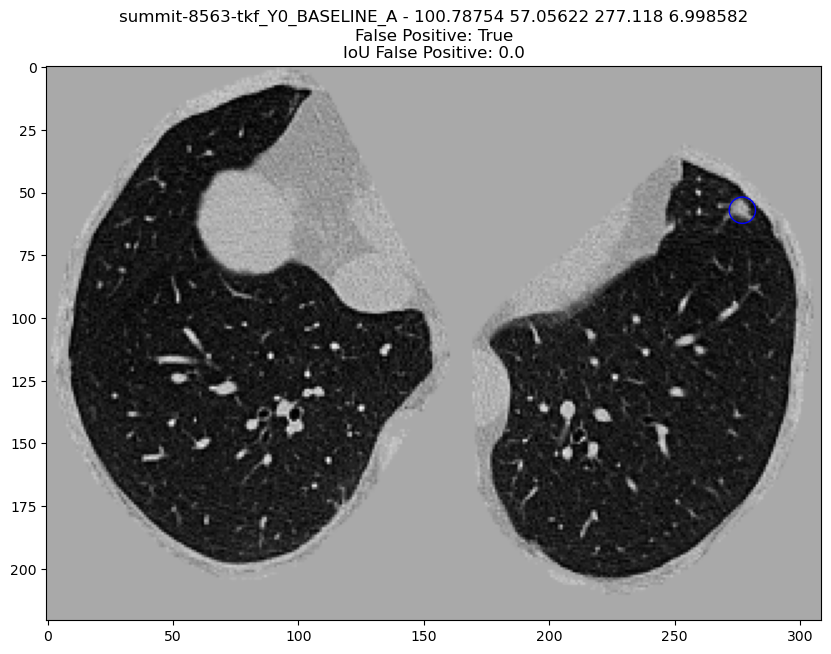

summit-8799-hac_Y0_BASELINE_A already exists
[[102.975     116.7        15.03        3.0234375]
 [119.235     122.65      281.93        2.53125  ]
 [162.955     184.76      191.36        4.1484375]
 [170.705     191.2       201.82        3.1640625]]
cropped_image shape: (7, 7, 7)


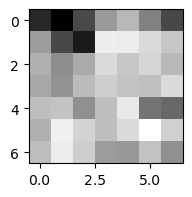

Min Intensity: 40, Mean Intensity: 131.39067055393585, Max Intensity: 201
summit-8799-hac_Y0_BASELINE_A - 57.271576 164.68388 184.4122 6.879239
False Positive: True
IoU False Positive: 0.0


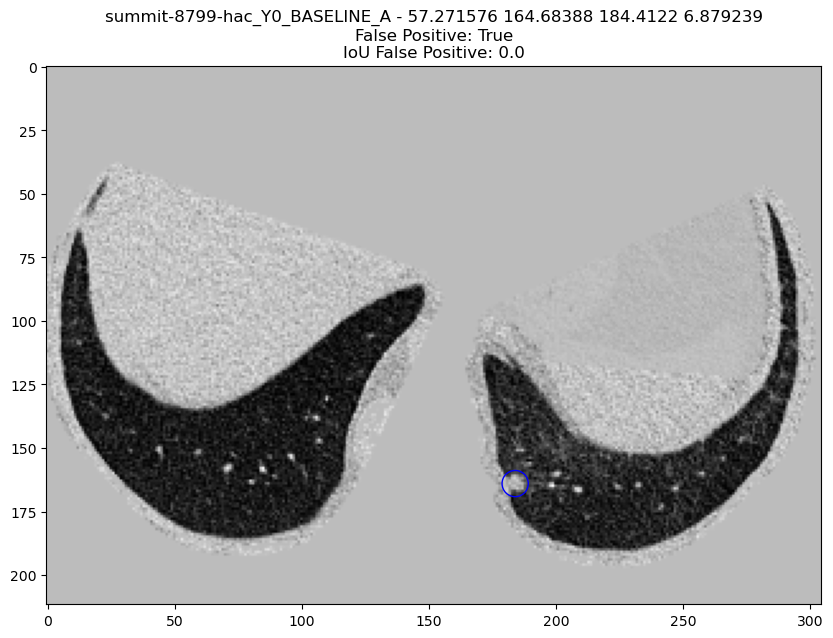

In [27]:
cnt = 0

df = false_positives_fpps['0.125']

for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    study_id = row['name']
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    utils.copy_scan_from_cluster(study_id)
    utils.show_numpy_candidate_location(study_id, x, y, z, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break

## MONAI Detection

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/test_balanced/result_test_balanced.json
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/test_balanced/annotations.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:30<00:00, 32.75it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced directory


,0,159,476,1111,2381,4920,9999
0,0.215 (0.169 - 0.263),0.336 (0.287 - 0.392),0.477 (0.426 - 0.529),0.605 (0.556 - 0.654),0.729 (0.687 - 0.772),0.844 (0.811 - 0.875),0.913 (0.888 - 0.936)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.215,0.169,0.263
159,0.250,0.336,0.287,0.392
476,0.500,0.477,0.426,0.529
1111,1.000,0.605,0.556,0.654
2381,2.000,0.729,0.687,0.772
4920,4.000,0.844,0.811,0.875
9999,8.000,0.913,0.888,0.936


Mean Sensitivity: 0.59 Low Sensitivity: 0.55 High Sensitivity: 0.632


,True positives,672
0,False positives,23403.000
1,False negatives,27.000
2,True negatives,0.000
3,Total number of candidates,24768.000
4,Total number of nodules,699.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,698.000
7,Sensitivity,0.961
8,Average number of candidates per scan,41.627


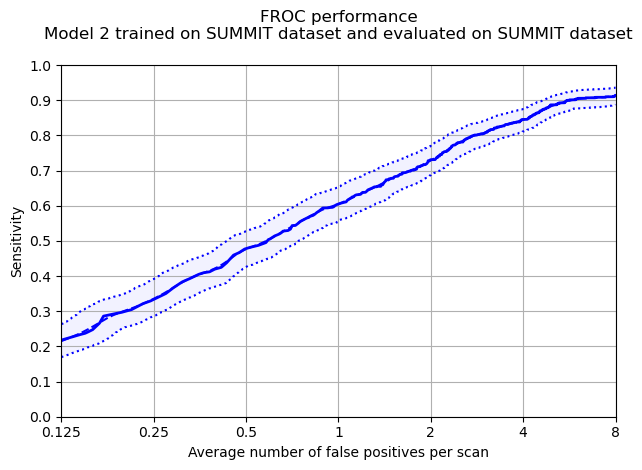

In [28]:

detection_predictions_path = combine_predictions(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}', 'test')
detection_predictions = pd.read_csv(detection_predictions_path)

annotations = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_metadata.csv')
    .assign(name=lambda df: df.participant_id + '_Y0_BASELINE_A')
    .assign(row=lambda df: df['nodule_x_coordinate'])
    .assign(col=lambda df: df['nodule_y_coordinate'])
    .assign(index=lambda df: df['nodule_z_coordinate'])
    .assign(diameter=lambda df: df['nodule_diameter_mm'])
    .assign(diameter_cats=lambda df: pd.cut(
        df['nodule_diameter_mm'],
        bins=diameter_cats,
        labels=diameter_lbs
    ))
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

annotations.to_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv', index=False)

detection_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    results_filename=detection_predictions_path,
    filter='\nModel 2 trained on SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/detection/trained_summit/summit/{flavour}',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/froc_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/CADAnalysis.txt')


/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/test_balanced/result_test_balanced.json


<Axes: >

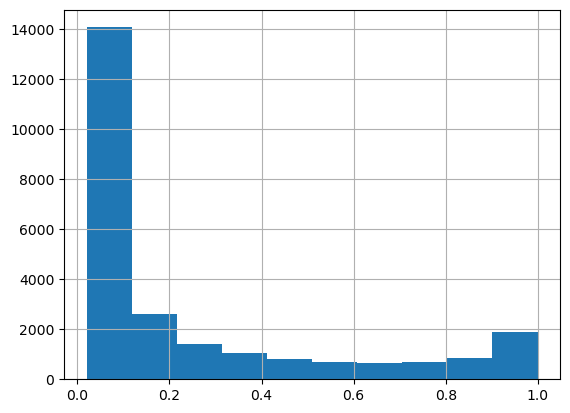

In [12]:
detection_predictions_path = combine_predictions(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}', 'test')
predictions = pd.read_csv(detection_predictions_path, usecols=['name', 'col', 'row', 'index', 'diameter', 'threshold'])
predictions.threshold.hist()

### Gender analysis

Protected Group: MALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,56.0,2.0,7.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpx2gk7h14/annotations.csv
Total number of included nodule annotations: 396
Total number of nodule annotations: 396
Cases: 342
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:15<00:00, 63.97it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/gender/MALE directory


,0,159,476,1111,2381,4920,9999
0,0.188 (0.123 - 0.26),0.31 (0.246 - 0.389),0.463 (0.391 - 0.536),0.597 (0.529 - 0.675),0.717 (0.657 - 0.776),0.836 (0.788 - 0.879),0.915 (0.876 - 0.947)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.188,0.123,0.260
159,0.250,0.310,0.246,0.389
476,0.500,0.463,0.391,0.536
1111,1.000,0.597,0.529,0.675
2381,2.000,0.717,0.657,0.776
4920,4.000,0.836,0.788,0.879
9999,8.000,0.915,0.876,0.947


Mean Sensitivity: 0.58 Low Sensitivity: 0.52 High Sensitivity: 0.637


,True positives,383
0,False positives,13727.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,14466.000
4,Total number of nodules,396.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,358.000
7,Sensitivity,0.967
8,Average number of candidates per scan,42.298


Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,52.0,5.0,7.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpr1elzkxh/annotations.csv
Total number of included nodule annotations: 299
Total number of nodule annotations: 299
Cases: 251
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:10<00:00, 94.93it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/gender/FEMALE directory


,0,159,476,1111,2381,4920,9999
0,0.247 (0.181 - 0.34),0.366 (0.298 - 0.442),0.492 (0.411 - 0.576),0.617 (0.547 - 0.689),0.745 (0.686 - 0.805),0.854 (0.812 - 0.898),0.908 (0.874 - 0.943)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.247,0.181,0.340
159,0.250,0.366,0.298,0.442
476,0.500,0.492,0.411,0.576
1111,1.000,0.617,0.547,0.689
2381,2.000,0.745,0.686,0.805
4920,4.000,0.854,0.812,0.898
9999,8.000,0.908,0.874,0.943


Mean Sensitivity: 0.6 Low Sensitivity: 0.54 High Sensitivity: 0.67


,True positives,285
0,False positives,9607.000
1,False negatives,14.000
2,True negatives,0.000
3,Total number of candidates,10226.000
4,Total number of nodules,299.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,337.000
7,Sensitivity,0.953
8,Average number of candidates per scan,40.741


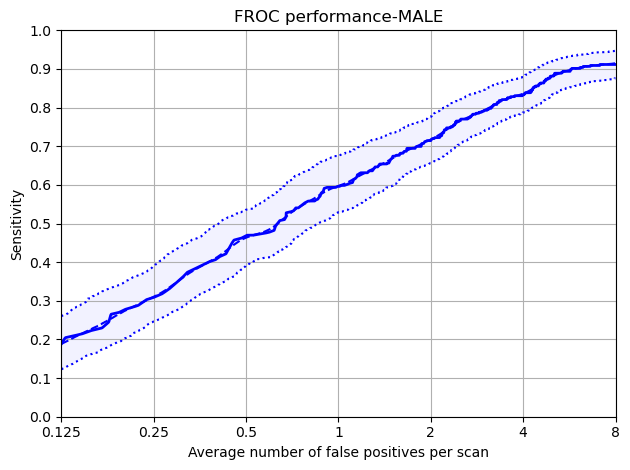

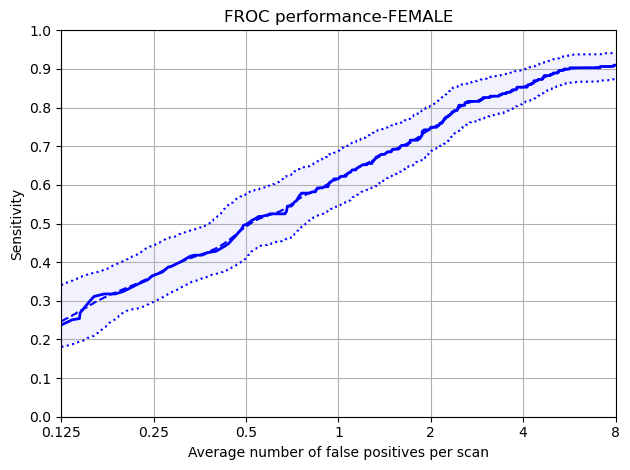

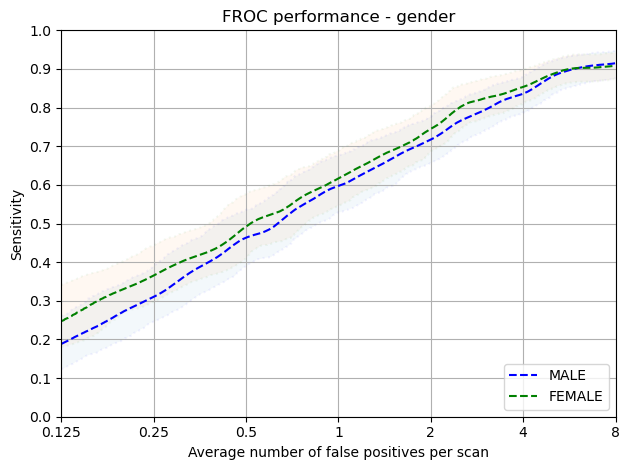

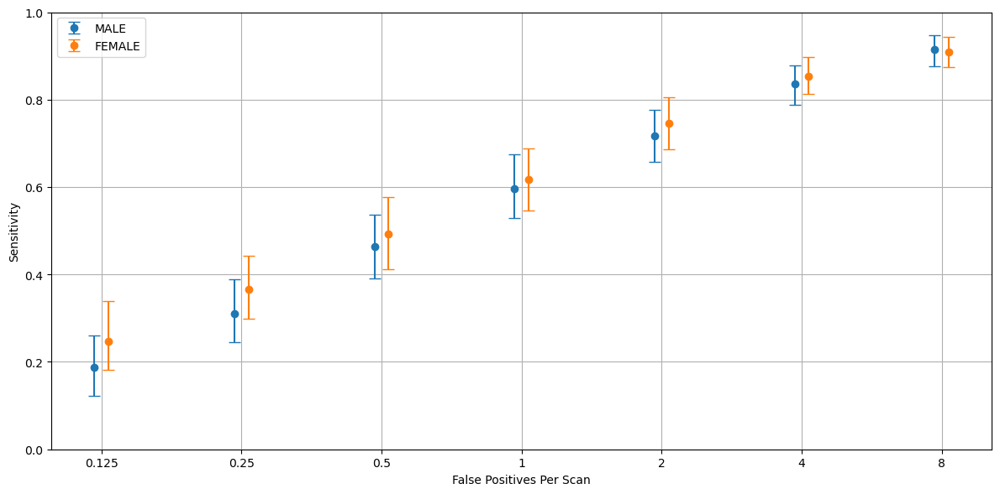

In [29]:


annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv')

predictions = pd.read_csv(detection_predictions_path)

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour, 'Gender', data_dict)

### Age analysis

Protected Group: 65-69


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,61.0,2.0,7.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp4729wb_o/annotations.csv
Total number of included nodule annotations: 168
Total number of nodule annotations: 168
Cases: 166


100%|██████████| 1000/1000 [00:07<00:00, 138.25it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/participant_age_at_consent_cats/65-69 directory


,0,159,476,1111,2381,4920,9999
0,0.261 (0.173 - 0.377),0.399 (0.302 - 0.5),0.528 (0.416 - 0.631),0.652 (0.549 - 0.742),0.763 (0.681 - 0.835),0.894 (0.84 - 0.946),0.931 (0.89 - 0.966)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.261,0.173,0.377
159,0.250,0.399,0.302,0.500
476,0.500,0.528,0.416,0.631
1111,1.000,0.652,0.549,0.742
2381,2.000,0.763,0.681,0.835
4920,4.000,0.894,0.840,0.946
9999,8.000,0.931,0.890,0.966


Mean Sensitivity: 0.63 Low Sensitivity: 0.55 High Sensitivity: 0.714


,True positives,164
0,False positives,6682.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,6998.000
4,Total number of nodules,168.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,152.000
7,Sensitivity,0.976
8,Average number of candidates per scan,42.157


Protected Group: 60-64


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,53.0,4.0,8.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpy03nblta/annotations.csv
Total number of included nodule annotations: 200
Total number of nodule annotations: 200
Cases: 148


100%|██████████| 1000/1000 [00:06<00:00, 162.52it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/participant_age_at_consent_cats/60-64 directory


,0,159,476,1111,2381,4920,9999
0,0.206 (0.134 - 0.284),0.285 (0.201 - 0.382),0.416 (0.328 - 0.515),0.544 (0.448 - 0.658),0.704 (0.625 - 0.784),0.815 (0.757 - 0.875),0.911 (0.865 - 0.951)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.206,0.134,0.284
159,0.250,0.285,0.201,0.382
476,0.500,0.416,0.328,0.515
1111,1.000,0.544,0.448,0.658
2381,2.000,0.704,0.625,0.784
4920,4.000,0.815,0.757,0.875
9999,8.000,0.911,0.865,0.951


Mean Sensitivity: 0.55 Low Sensitivity: 0.48 High Sensitivity: 0.636


,True positives,189
0,False positives,5360.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,5741.000
4,Total number of nodules,200.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,192.000
7,Sensitivity,0.945
8,Average number of candidates per scan,38.791


Protected Group: 70-75


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,48.0,4.0,6.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpq3hlq0_z/annotations.csv
Total number of included nodule annotations: 140
Total number of nodule annotations: 140
Cases: 115
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:06<00:00, 147.88it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/participant_age_at_consent_cats/70-75 directory


,0,159,476,1111,2381,4920,9999
0,0.173 (0.067 - 0.303),0.325 (0.206 - 0.465),0.534 (0.426 - 0.648),0.665 (0.575 - 0.755),0.774 (0.679 - 0.863),0.879 (0.796 - 0.945),0.929 (0.853 - 0.985)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.173,0.067,0.303
159,0.250,0.325,0.206,0.465
476,0.500,0.534,0.426,0.648
1111,1.000,0.665,0.575,0.755
2381,2.000,0.774,0.679,0.863
4920,4.000,0.879,0.796,0.945
9999,8.000,0.929,0.853,0.985


Mean Sensitivity: 0.61 Low Sensitivity: 0.51 High Sensitivity: 0.709


,True positives,134
0,False positives,5185.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,5456.000
4,Total number of nodules,140.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,142.000
7,Sensitivity,0.957
8,Average number of candidates per scan,47.443


Protected Group: 55-59


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,55.0,3.0,5.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpz9dyii_f/annotations.csv
Total number of included nodule annotations: 144
Total number of nodule annotations: 144
Cases: 134


100%|██████████| 1000/1000 [00:09<00:00, 102.54it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/participant_age_at_consent_cats/55-59 directory


,0,159,476,1111,2381,4920,9999
0,0.232 (0.118 - 0.391),0.366 (0.257 - 0.485),0.478 (0.355 - 0.62),0.649 (0.555 - 0.753),0.735 (0.646 - 0.836),0.852 (0.773 - 0.915),0.909 (0.855 - 0.954)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.232,0.118,0.391
159,0.250,0.366,0.257,0.485
476,0.500,0.478,0.355,0.620
1111,1.000,0.649,0.555,0.753
2381,2.000,0.735,0.646,0.836
4920,4.000,0.852,0.773,0.915
9999,8.000,0.909,0.855,0.954


Mean Sensitivity: 0.6 Low Sensitivity: 0.51 High Sensitivity: 0.708


,True positives,140
0,False positives,4758.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,5053.000
4,Total number of nodules,144.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,155.000
7,Sensitivity,0.972
8,Average number of candidates per scan,37.709


Protected Group: 75+


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,51.0,9.0,14.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpkwz58tgr/annotations.csv
Total number of included nodule annotations: 43
Total number of nodule annotations: 43
Cases: 33


100%|██████████| 1000/1000 [00:02<00:00, 339.71it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/participant_age_at_consent_cats/75+ directory


,0,159,476,1111,2381,4920,9999
0,0.19 (0.034 - 0.394),0.244 (0.072 - 0.455),0.332 (0.157 - 0.543),0.422 (0.271 - 0.609),0.598 (0.389 - 0.8),0.701 (0.486 - 0.881),0.832 (0.676 - 0.956)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.190,0.034,0.394
159,0.250,0.244,0.072,0.455
476,0.500,0.332,0.157,0.543
1111,1.000,0.422,0.271,0.609
2381,2.000,0.598,0.389,0.800
4920,4.000,0.701,0.486,0.881
9999,8.000,0.832,0.676,0.956


Mean Sensitivity: 0.47 Low Sensitivity: 0.3 High Sensitivity: 0.663


,True positives,41
0,False positives,1349.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,1444.000
4,Total number of nodules,43.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,54.000
7,Sensitivity,0.953
8,Average number of candidates per scan,43.758


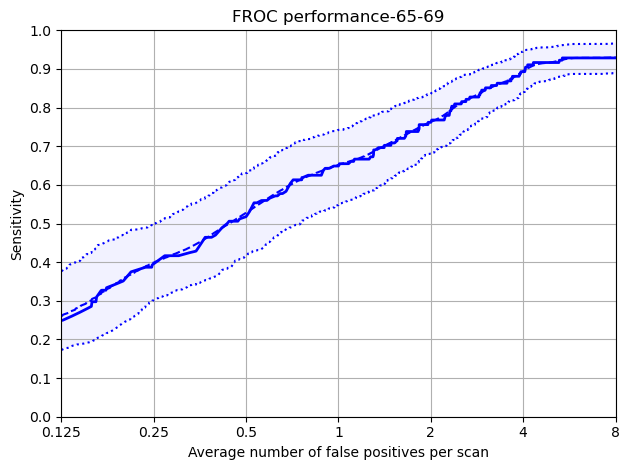

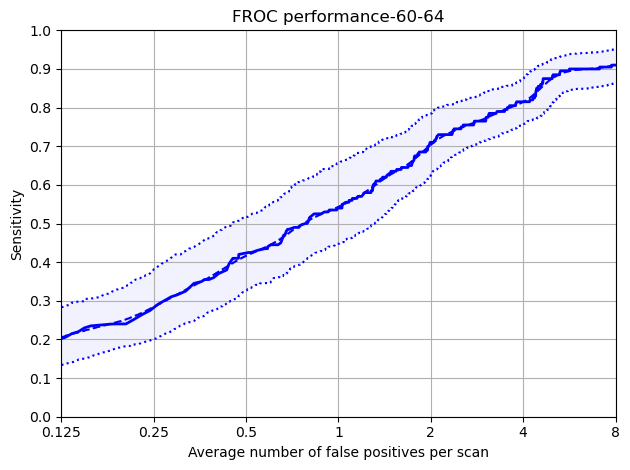

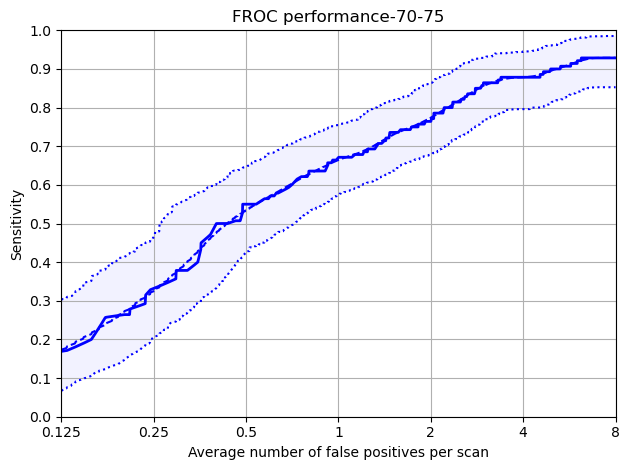

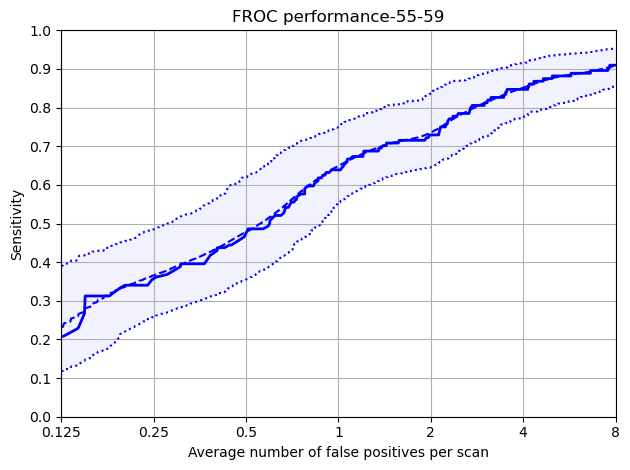

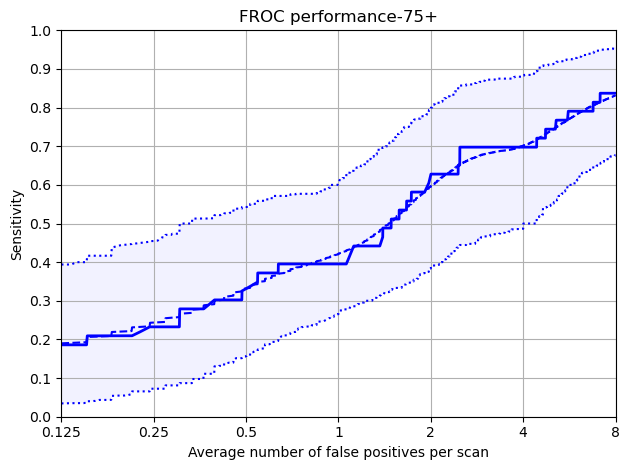

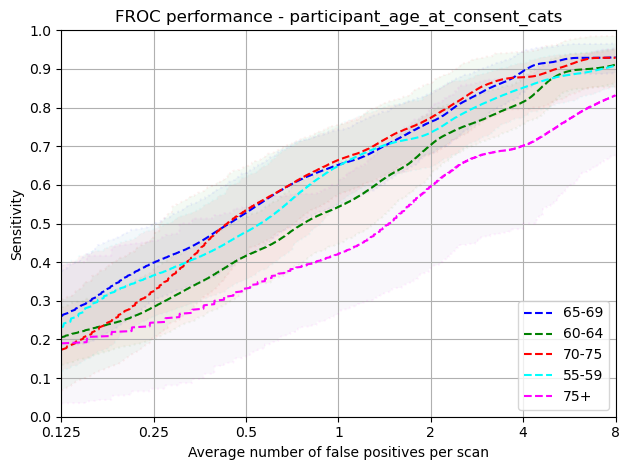

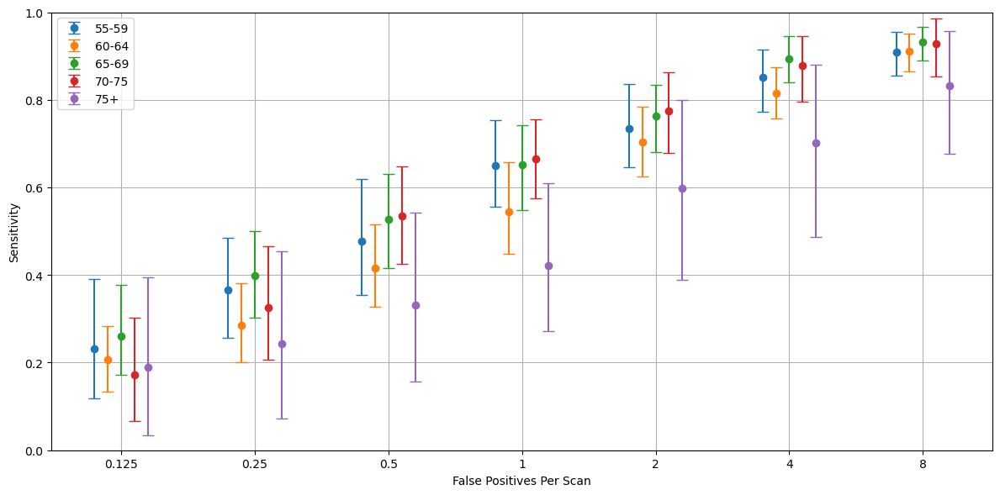

In [30]:
protected_group = 'participant_age_at_consent_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour, 'Age', data_dict, ['55-59','60-64','65-69','70-75','75+'])

### Ethnicity Analysis

Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,63.0,2.0,5.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpz_drksm2/annotations.csv
Total number of included nodule annotations: 250
Total number of nodule annotations: 250
Cases: 199


100%|██████████| 1000/1000 [00:13<00:00, 76.49it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/ethnic_group/Black directory


,0,159,476,1111,2381,4920,9999
0,0.272 (0.181 - 0.373),0.333 (0.248 - 0.442),0.465 (0.377 - 0.568),0.594 (0.502 - 0.684),0.735 (0.655 - 0.808),0.843 (0.783 - 0.896),0.917 (0.878 - 0.954)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.272,0.181,0.373
159,0.250,0.333,0.248,0.442
476,0.500,0.465,0.377,0.568
1111,1.000,0.594,0.502,0.684
2381,2.000,0.735,0.655,0.808
4920,4.000,0.843,0.783,0.896
9999,8.000,0.917,0.878,0.954


Mean Sensitivity: 0.59 Low Sensitivity: 0.52 High Sensitivity: 0.675


,True positives,241
0,False positives,7539.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,7993.000
4,Total number of nodules,250.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,213.000
7,Sensitivity,0.964
8,Average number of candidates per scan,40.166


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,52.0,3.0,10.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpjnflazd9/annotations.csv
Total number of included nodule annotations: 203
Total number of nodule annotations: 203
Cases: 196
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:11<00:00, 88.24it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/ethnic_group/Asian or Asian British directory


,0,159,476,1111,2381,4920,9999
0,0.18 (0.101 - 0.261),0.305 (0.188 - 0.437),0.477 (0.386 - 0.574),0.608 (0.521 - 0.691),0.702 (0.624 - 0.783),0.826 (0.747 - 0.889),0.895 (0.831 - 0.948)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.180,0.101,0.261
159,0.250,0.305,0.188,0.437
476,0.500,0.477,0.386,0.574
1111,1.000,0.608,0.521,0.691
2381,2.000,0.702,0.624,0.783
4920,4.000,0.826,0.747,0.889
9999,8.000,0.895,0.831,0.948


Mean Sensitivity: 0.57 Low Sensitivity: 0.49 High Sensitivity: 0.655


,True positives,191
0,False positives,7604.000
1,False negatives,12.000
2,True negatives,0.000
3,Total number of candidates,7963.000
4,Total number of nodules,203.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,170.000
7,Sensitivity,0.941
8,Average number of candidates per scan,40.628


Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,47.0,6.0,6.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpfuzywnph/annotations.csv
Total number of included nodule annotations: 242
Total number of nodule annotations: 242
Cases: 199
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:11<00:00, 89.73it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/ethnic_group/White directory


,0,159,476,1111,2381,4920,9999
0,0.217 (0.149 - 0.318),0.347 (0.28 - 0.425),0.481 (0.403 - 0.57),0.629 (0.558 - 0.702),0.76 (0.696 - 0.822),0.864 (0.821 - 0.907),0.927 (0.888 - 0.961)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.217,0.149,0.318
159,0.250,0.347,0.280,0.425
476,0.500,0.481,0.403,0.570
1111,1.000,0.629,0.558,0.702
2381,2.000,0.760,0.696,0.822
4920,4.000,0.864,0.821,0.907
9999,8.000,0.927,0.888,0.961


Mean Sensitivity: 0.6 Low Sensitivity: 0.54 High Sensitivity: 0.672


,True positives,236
0,False positives,8191.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,8736.000
4,Total number of nodules,242.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,312.000
7,Sensitivity,0.975
8,Average number of candidates per scan,43.899


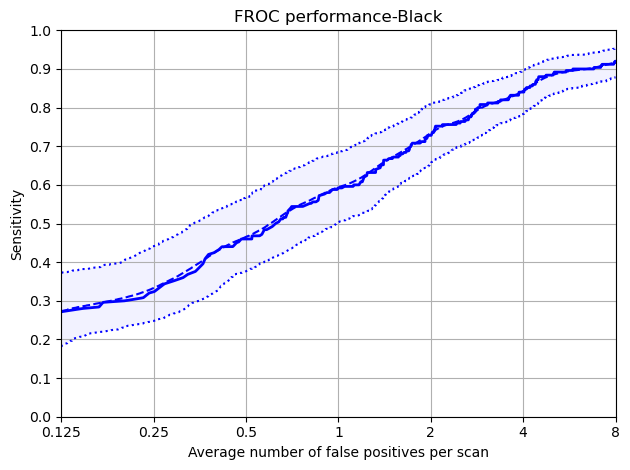

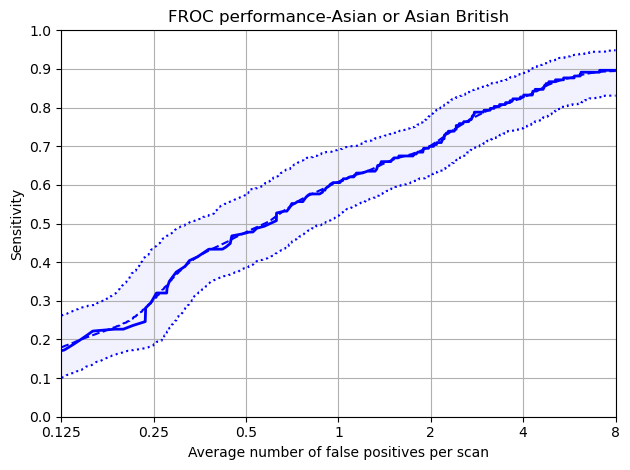

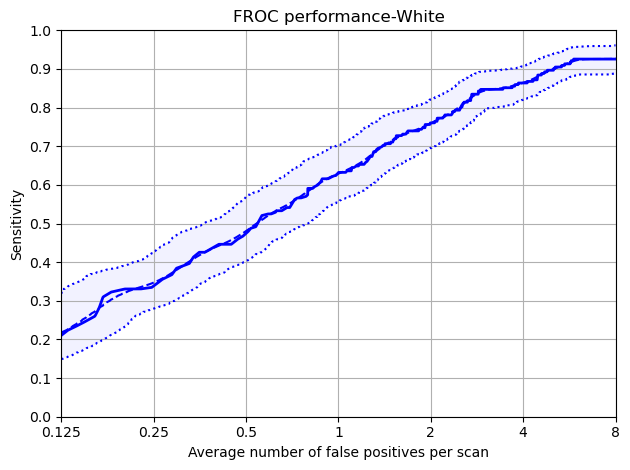

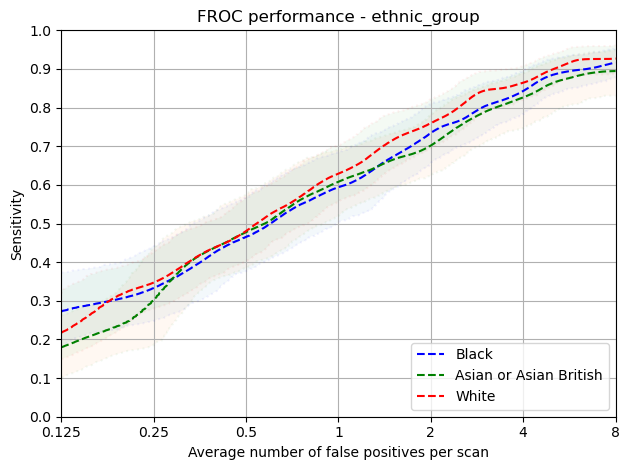

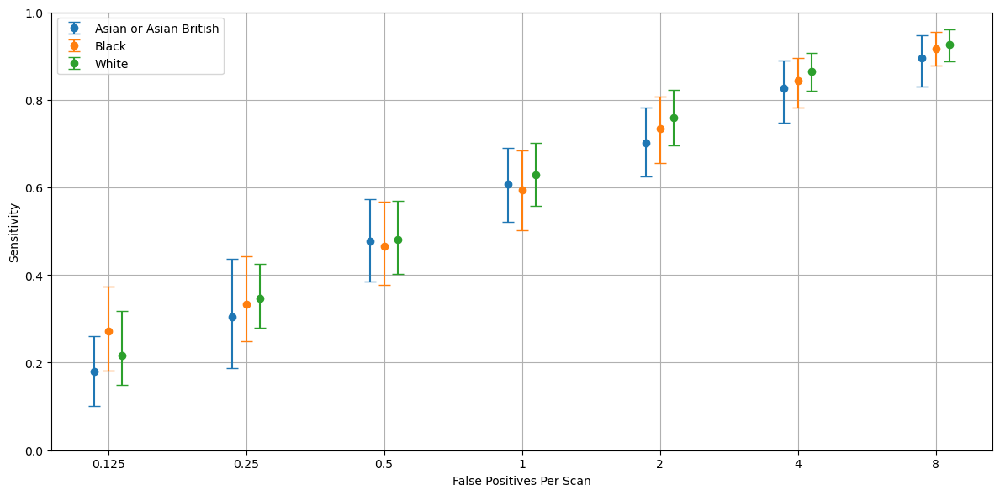

In [31]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### IMDRank_tertile

Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,63.0,3.0,7.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp_eq2gjso/annotations.csv
Total number of included nodule annotations: 235
Total number of nodule annotations: 235
Cases: 192
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:09<00:00, 105.71it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/IMDRank_tertile/Medium directory


,0,159,476,1111,2381,4920,9999
0,0.197 (0.129 - 0.29),0.321 (0.244 - 0.431),0.491 (0.39 - 0.597),0.639 (0.561 - 0.714),0.76 (0.693 - 0.826),0.893 (0.845 - 0.937),0.955 (0.922 - 0.983)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.197,0.129,0.290
159,0.250,0.321,0.244,0.431
476,0.500,0.491,0.390,0.597
1111,1.000,0.639,0.561,0.714
2381,2.000,0.760,0.693,0.826
4920,4.000,0.893,0.845,0.937
9999,8.000,0.955,0.922,0.983


Mean Sensitivity: 0.61 Low Sensitivity: 0.54 High Sensitivity: 0.683


,True positives,230
0,False positives,7446.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,7902.000
4,Total number of nodules,235.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,229.000
7,Sensitivity,0.979
8,Average number of candidates per scan,41.156


Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,55.0,4.0,5.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpr3cc8enp/annotations.csv
Total number of included nodule annotations: 281
Total number of nodule annotations: 281
Cases: 246


100%|██████████| 1000/1000 [00:11<00:00, 86.48it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/IMDRank_tertile/Low directory


,0,159,476,1111,2381,4920,9999
0,0.235 (0.158 - 0.341),0.336 (0.26 - 0.427),0.449 (0.373 - 0.537),0.587 (0.494 - 0.687),0.747 (0.683 - 0.81),0.837 (0.786 - 0.882),0.906 (0.869 - 0.941)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.235,0.158,0.341
159,0.250,0.336,0.260,0.427
476,0.500,0.449,0.373,0.537
1111,1.000,0.587,0.494,0.687
2381,2.000,0.747,0.683,0.810
4920,4.000,0.837,0.786,0.882
9999,8.000,0.906,0.869,0.941


Mean Sensitivity: 0.59 Low Sensitivity: 0.52 High Sensitivity: 0.661


,True positives,268
0,False positives,9514.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,10063.000
4,Total number of nodules,281.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,281.000
7,Sensitivity,0.954
8,Average number of candidates per scan,40.907


Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,43.0,3.0,10.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpmpfyllyl/annotations.csv
Total number of included nodule annotations: 175
Total number of nodule annotations: 175
Cases: 150
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:07<00:00, 136.34it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/IMDRank_tertile/High directory


,0,159,476,1111,2381,4920,9999
0,0.221 (0.132 - 0.319),0.356 (0.24 - 0.471),0.483 (0.389 - 0.581),0.601 (0.505 - 0.687),0.677 (0.586 - 0.761),0.794 (0.71 - 0.864),0.884 (0.817 - 0.938)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.221,0.132,0.319
159,0.250,0.356,0.240,0.471
476,0.500,0.483,0.389,0.581
1111,1.000,0.601,0.505,0.687
2381,2.000,0.677,0.586,0.761
4920,4.000,0.794,0.710,0.864
9999,8.000,0.884,0.817,0.938


Mean Sensitivity: 0.57 Low Sensitivity: 0.48 High Sensitivity: 0.66


,True positives,168
0,False positives,6235.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,6583.000
4,Total number of nodules,175.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,182.000
7,Sensitivity,0.960
8,Average number of candidates per scan,43.887


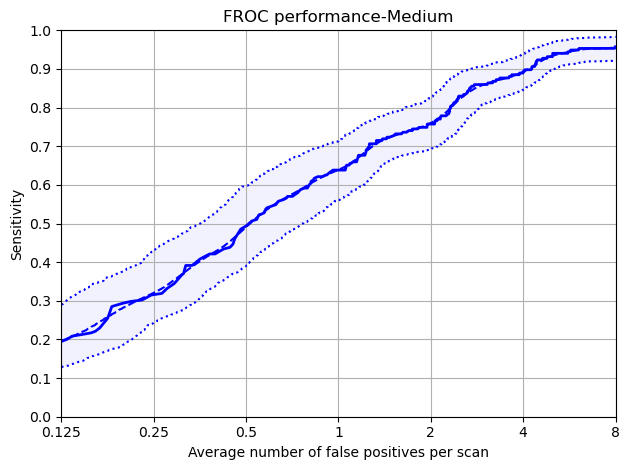

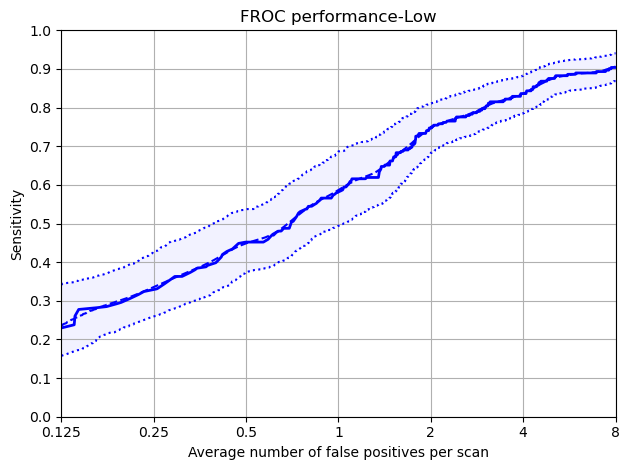

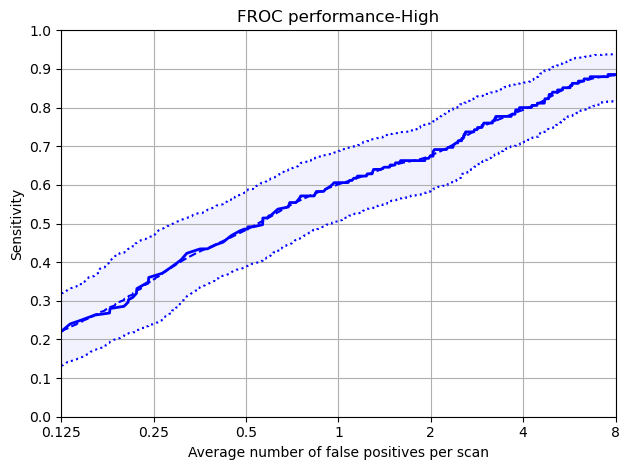

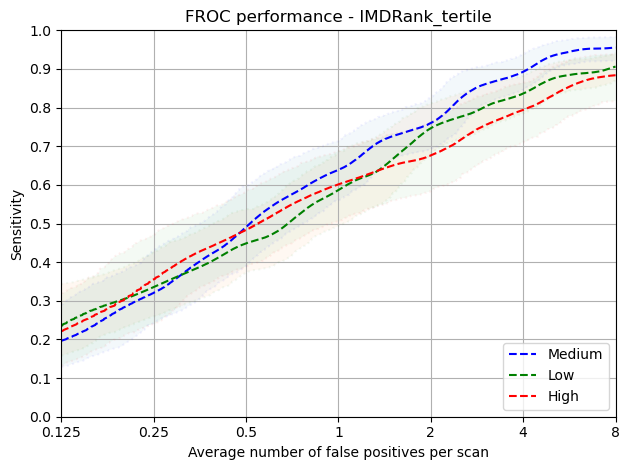

In [32]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Smoking Pack Years


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,54.0,2.0,6.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmptwhfazxp/annotations.csv
Total number of included nodule annotations: 291
Total number of nodule annotations: 291
Cases: 250
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:12<00:00, 82.42it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/smoking_pack_years_cats/Low (15-35) directory


,0,159,476,1111,2381,4920,9999
0,0.238 (0.151 - 0.319),0.355 (0.257 - 0.45),0.499 (0.418 - 0.578),0.615 (0.532 - 0.692),0.745 (0.672 - 0.816),0.854 (0.799 - 0.902),0.917 (0.868 - 0.956)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.238,0.151,0.319
159,0.250,0.355,0.257,0.450
476,0.500,0.499,0.418,0.578
1111,1.000,0.615,0.532,0.692
2381,2.000,0.745,0.672,0.816
4920,4.000,0.854,0.799,0.902
9999,8.000,0.917,0.868,0.956


Mean Sensitivity: 0.6 Low Sensitivity: 0.53 High Sensitivity: 0.673


,True positives,279
0,False positives,9691.000
1,False negatives,12.000
2,True negatives,0.000
3,Total number of candidates,10257.000
4,Total number of nodules,291.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,289.000
7,Sensitivity,0.959
8,Average number of candidates per scan,41.028


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,29.0,55.0,3.0,6.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp5w29ebhq/annotations.csv
Total number of included nodule annotations: 217
Total number of nodule annotations: 217
Cases: 193
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:09<00:00, 107.67it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/smoking_pack_years_cats/Medium (35-50) directory


,0,159,476,1111,2381,4920,9999
0,0.204 (0.105 - 0.281),0.337 (0.238 - 0.434),0.474 (0.384 - 0.561),0.623 (0.546 - 0.7),0.732 (0.66 - 0.805),0.824 (0.764 - 0.881),0.912 (0.873 - 0.946)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.204,0.105,0.281
159,0.250,0.337,0.238,0.434
476,0.500,0.474,0.384,0.561
1111,1.000,0.623,0.546,0.700
2381,2.000,0.732,0.660,0.805
4920,4.000,0.824,0.764,0.881
9999,8.000,0.912,0.873,0.946


Mean Sensitivity: 0.59 Low Sensitivity: 0.51 High Sensitivity: 0.658


,True positives,210
0,False positives,7549.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,8014.000
4,Total number of nodules,217.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,258.000
7,Sensitivity,0.968
8,Average number of candidates per scan,41.523


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,53.0,6.0,9.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpyntb1twm/annotations.csv
Total number of included nodule annotations: 187
Total number of nodule annotations: 187
Cases: 151


100%|██████████| 1000/1000 [00:07<00:00, 141.50it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/smoking_pack_years_cats/High (50+) directory


,0,159,476,1111,2381,4920,9999
0,0.215 (0.132 - 0.322),0.334 (0.245 - 0.427),0.439 (0.347 - 0.549),0.596 (0.487 - 0.699),0.723 (0.644 - 0.809),0.864 (0.813 - 0.917),0.911 (0.862 - 0.954)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.215,0.132,0.322
159,0.250,0.334,0.245,0.427
476,0.500,0.439,0.347,0.549
1111,1.000,0.596,0.487,0.699
2381,2.000,0.723,0.644,0.809
4920,4.000,0.864,0.813,0.917
9999,8.000,0.911,0.862,0.954


Mean Sensitivity: 0.58 Low Sensitivity: 0.5 High Sensitivity: 0.668


,True positives,179
0,False positives,6094.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,6421.000
4,Total number of nodules,187.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,148.000
7,Sensitivity,0.957
8,Average number of candidates per scan,42.523


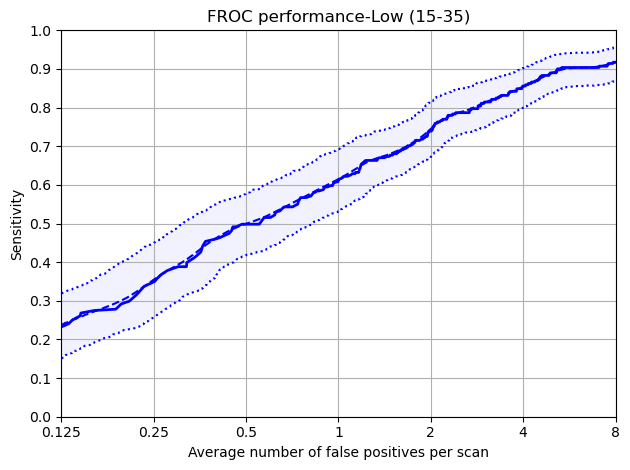

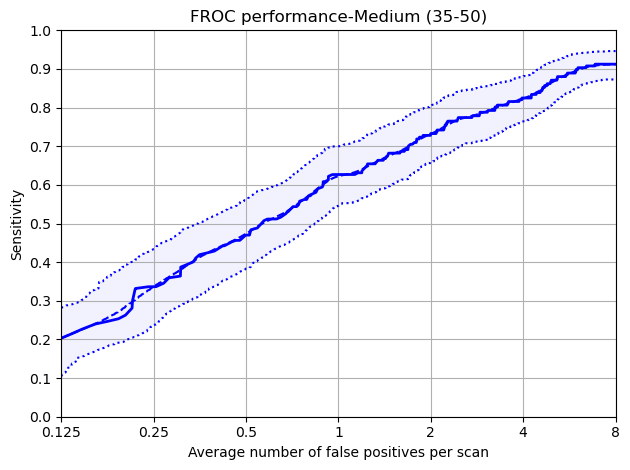

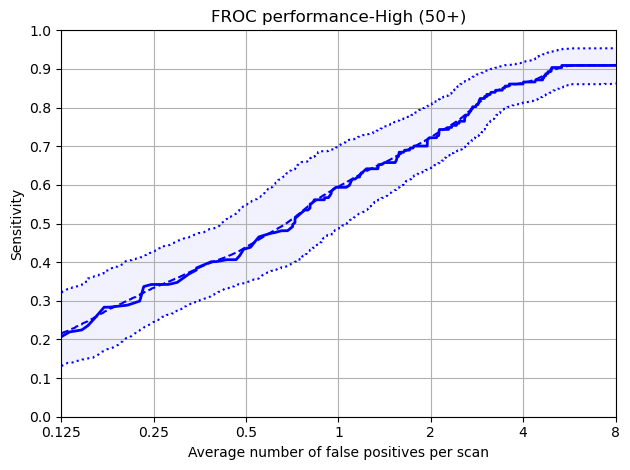

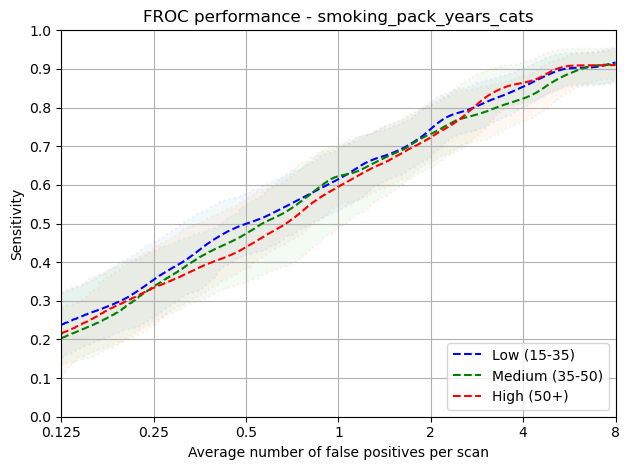

In [33]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,17.0,81.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpw42nl1p6/annotations.csv
Total number of included nodule annotations: 254
Total number of nodule annotations: 254
Cases: 421
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:19<00:00, 51.06it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/is_actionable/Non-Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.277 (0.206 - 0.354),0.402 (0.335 - 0.483),0.583 (0.519 - 0.649),0.724 (0.668 - 0.782),0.851 (0.797 - 0.902),0.937 (0.903 - 0.966),0.965 (0.941 - 0.987)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.277,0.206,0.354
159,0.250,0.402,0.335,0.483
476,0.500,0.583,0.519,0.649
1111,1.000,0.724,0.668,0.782
2381,2.000,0.851,0.797,0.902
4920,4.000,0.937,0.903,0.966
9999,8.000,0.965,0.941,0.987


Mean Sensitivity: 0.68 Low Sensitivity: 0.62 High Sensitivity: 0.732


,True positives,250
0,False positives,14961.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,15358.000
4,Total number of nodules,254.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,150.000
7,Sensitivity,0.984
8,Average number of candidates per scan,36.480


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,39.0,6.0,10.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpym_rxksg/annotations.csv
Total number of included nodule annotations: 441
Total number of nodule annotations: 441
Cases: 172
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:10<00:00, 98.12it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/is_actionable/Actonable directory


,0,159,476,1111,2381,4920,9999
0,0.184 (0.127 - 0.266),0.296 (0.231 - 0.368),0.39 (0.318 - 0.47),0.525 (0.456 - 0.595),0.645 (0.583 - 0.701),0.767 (0.714 - 0.814),0.873 (0.831 - 0.909)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.184,0.127,0.266
159,0.250,0.296,0.231,0.368
476,0.500,0.390,0.318,0.470
1111,1.000,0.525,0.456,0.595
2381,2.000,0.645,0.583,0.701
4920,4.000,0.767,0.714,0.814
9999,8.000,0.873,0.831,0.909


Mean Sensitivity: 0.53 Low Sensitivity: 0.47 High Sensitivity: 0.589


,True positives,418
0,False positives,8373.000
1,False negatives,23.000
2,True negatives,0.000
3,Total number of candidates,9334.000
4,Total number of nodules,441.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,545.000
7,Sensitivity,0.948
8,Average number of candidates per scan,54.267


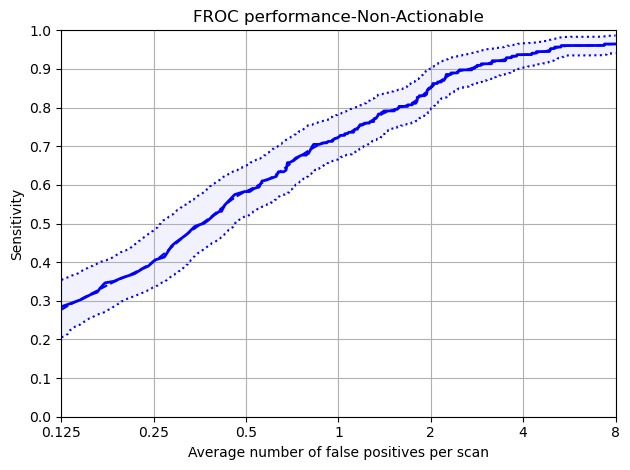

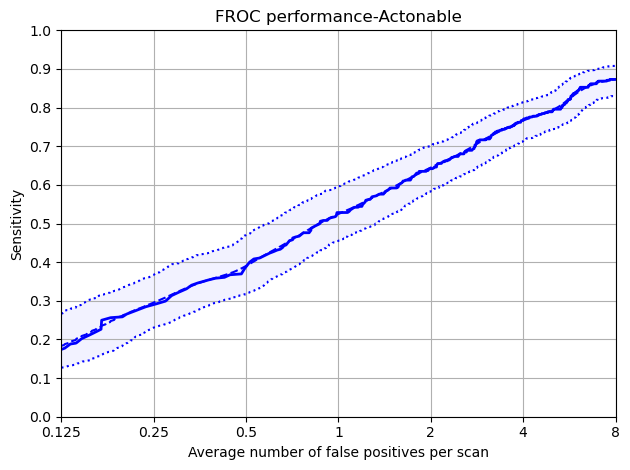

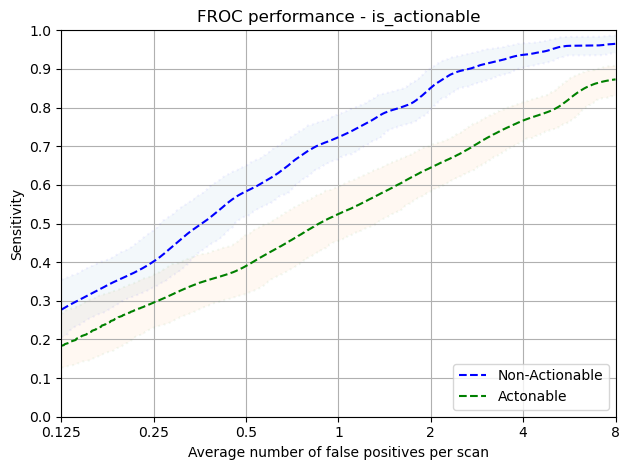

In [34]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Gender

Protected Group: Male


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,43.0,3.0,10.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp1t395zaz/annotations.csv
Total number of included nodule annotations: 263
Total number of nodule annotations: 263
Cases: 92
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:06<00:00, 160.75it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/gender_is_actionable/Male directory


,0,159,476,1111,2381,4920,9999
0,0.143 (0.059 - 0.238),0.241 (0.154 - 0.342),0.354 (0.262 - 0.467),0.489 (0.392 - 0.592),0.616 (0.521 - 0.7),0.737 (0.652 - 0.815),0.866 (0.805 - 0.917)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.143,0.059,0.238
159,0.250,0.241,0.154,0.342
476,0.500,0.354,0.262,0.467
1111,1.000,0.489,0.392,0.592
2381,2.000,0.616,0.521,0.700
4920,4.000,0.737,0.652,0.815
9999,8.000,0.866,0.805,0.917


Mean Sensitivity: 0.49 Low Sensitivity: 0.41 High Sensitivity: 0.582


,True positives,252
0,False positives,4667.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,5195.000
4,Total number of nodules,263.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,278.000
7,Sensitivity,0.958
8,Average number of candidates per scan,56.467


Protected Group: Female


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,32.0,9.0,10.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpz_iup9js/annotations.csv
Total number of included nodule annotations: 178
Total number of nodule annotations: 178
Cases: 81


100%|██████████| 1000/1000 [00:04<00:00, 202.55it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/gender_is_actionable/Female directory


,0,159,476,1111,2381,4920,9999
0,0.261 (0.161 - 0.393),0.369 (0.28 - 0.469),0.438 (0.346 - 0.548),0.572 (0.48 - 0.671),0.683 (0.606 - 0.768),0.785 (0.724 - 0.855),0.868 (0.819 - 0.916)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.261,0.161,0.393
159,0.250,0.369,0.280,0.469
476,0.500,0.438,0.346,0.548
1111,1.000,0.572,0.480,0.671
2381,2.000,0.683,0.606,0.768
4920,4.000,0.785,0.724,0.855
9999,8.000,0.868,0.819,0.916


Mean Sensitivity: 0.57 Low Sensitivity: 0.49 High Sensitivity: 0.66


,True positives,166
0,False positives,3706.000
1,False negatives,12.000
2,True negatives,0.000
3,Total number of candidates,4139.000
4,Total number of nodules,178.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,267.000
7,Sensitivity,0.933
8,Average number of candidates per scan,51.099


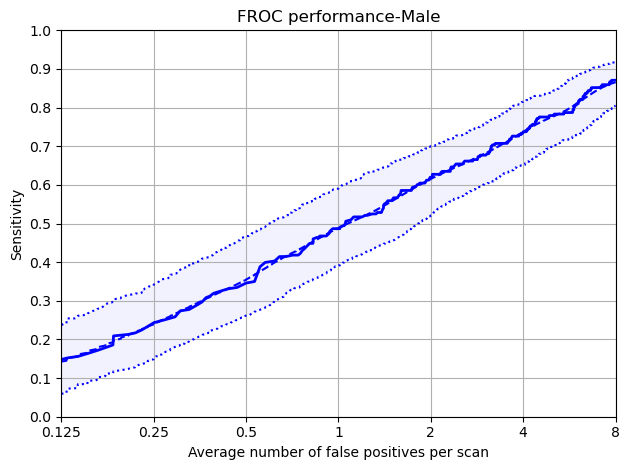

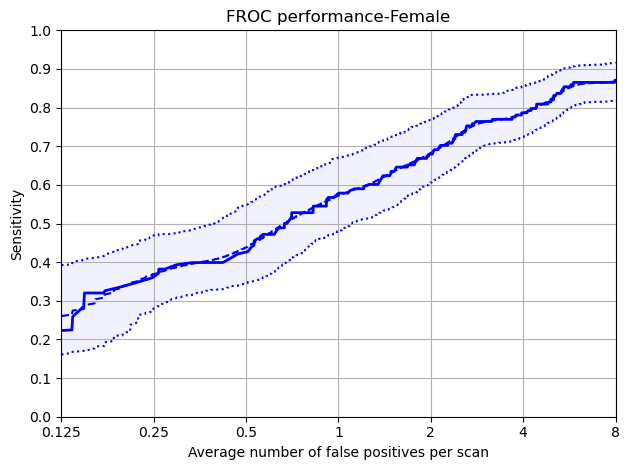

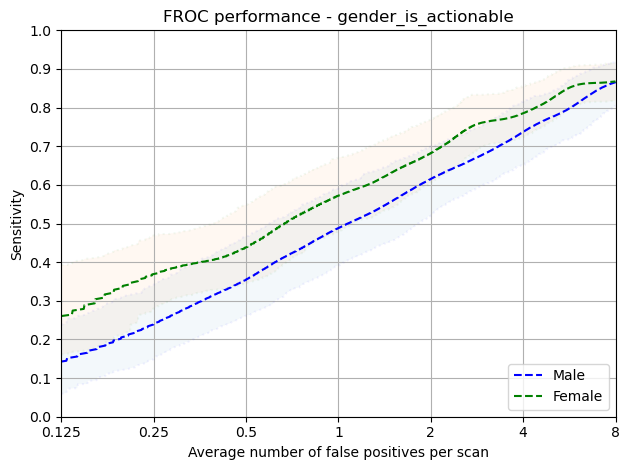

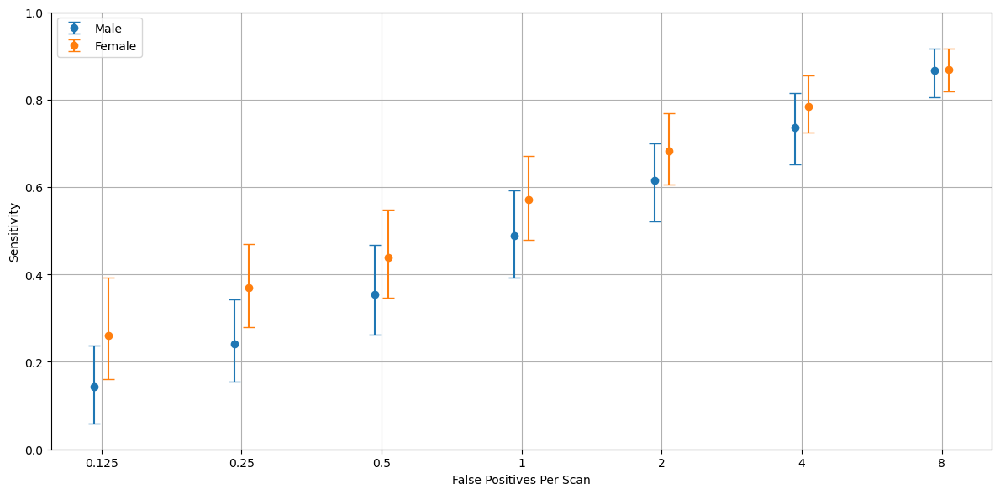

In [35]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Actionable, Gender', data_dict)

### Non-Actionable Gender

Protected Group: Male


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,18.0,81.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpzqvc08i2/annotations.csv
Total number of included nodule annotations: 133
Total number of nodule annotations: 133
Cases: 251


100%|██████████| 1000/1000 [00:12<00:00, 82.56it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/gender_is_not_actionable/Male directory


,0,159,476,1111,2381,4920,9999
0,0.285 (0.178 - 0.405),0.441 (0.348 - 0.553),0.589 (0.51 - 0.68),0.759 (0.685 - 0.829),0.87 (0.788 - 0.937),0.948 (0.908 - 0.984),0.969 (0.937 - 0.993)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.285,0.178,0.405
159,0.250,0.441,0.348,0.553
476,0.500,0.589,0.510,0.680
1111,1.000,0.759,0.685,0.829
2381,2.000,0.870,0.788,0.937
4920,4.000,0.948,0.908,0.984
9999,8.000,0.969,0.937,0.993


Mean Sensitivity: 0.69 Low Sensitivity: 0.62 High Sensitivity: 0.769


,True positives,131
0,False positives,9060.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,9271.000
4,Total number of nodules,133.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,80.000
7,Sensitivity,0.985
8,Average number of candidates per scan,36.936


Protected Group: Female


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,16.0,82.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpwazl3vo4/annotations.csv
Total number of included nodule annotations: 121
Total number of nodule annotations: 121
Cases: 171
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:07<00:00, 125.69it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/gender_is_not_actionable/Female directory


,0,159,476,1111,2381,4920,9999
0,0.258 (0.167 - 0.351),0.368 (0.262 - 0.479),0.57 (0.452 - 0.676),0.688 (0.604 - 0.773),0.826 (0.748 - 0.903),0.925 (0.875 - 0.968),0.961 (0.922 - 0.992)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.258,0.167,0.351
159,0.250,0.368,0.262,0.479
476,0.500,0.570,0.452,0.676
1111,1.000,0.688,0.604,0.773
2381,2.000,0.826,0.748,0.903
4920,4.000,0.925,0.875,0.968
9999,8.000,0.961,0.922,0.992


Mean Sensitivity: 0.66 Low Sensitivity: 0.58 High Sensitivity: 0.735


,True positives,119
0,False positives,5901.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,6087.000
4,Total number of nodules,121.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,70.000
7,Sensitivity,0.983
8,Average number of candidates per scan,35.596


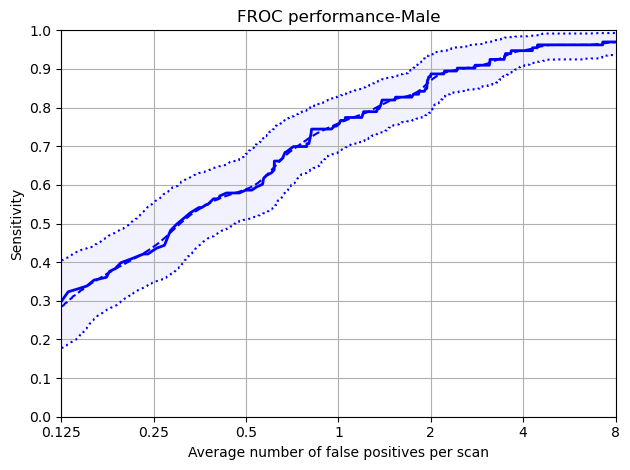

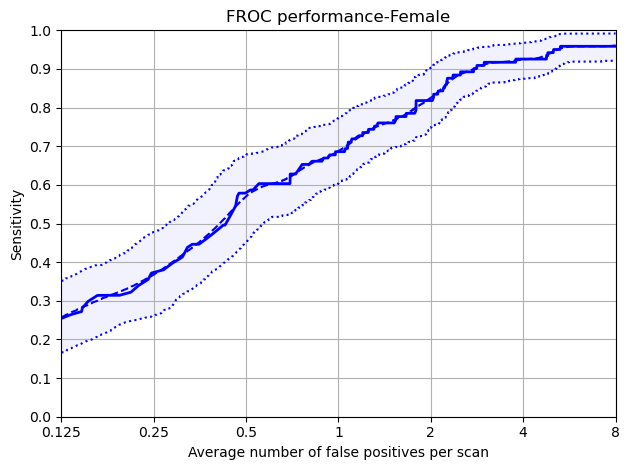

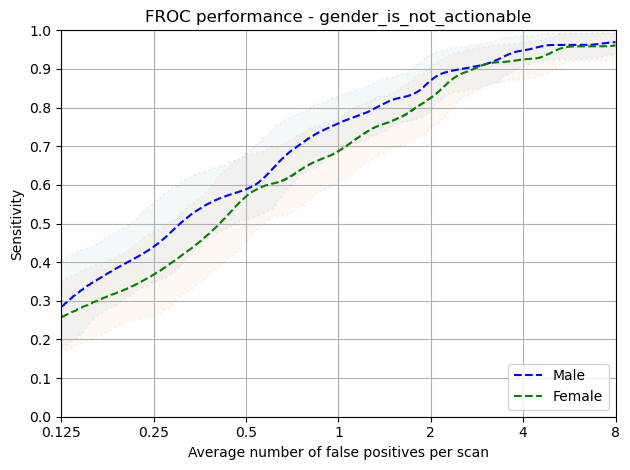

In [36]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)


### Actionable Ethnic Group

Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,39.0,5.0,15.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpxatnhnj5/annotations.csv
Total number of included nodule annotations: 130
Total number of nodule annotations: 130
Cases: 59
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:03<00:00, 258.95it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/ethnic_group_is_actionable/Asian or Asian British directory


,0,159,476,1111,2381,4920,9999
0,0.133 (0.046 - 0.247),0.223 (0.124 - 0.371),0.374 (0.259 - 0.5),0.497 (0.362 - 0.63),0.585 (0.477 - 0.685),0.689 (0.561 - 0.802),0.818 (0.708 - 0.905)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.133,0.046,0.247
159,0.250,0.223,0.124,0.371
476,0.500,0.374,0.259,0.500
1111,1.000,0.497,0.362,0.630
2381,2.000,0.585,0.477,0.685
4920,4.000,0.689,0.561,0.802
9999,8.000,0.818,0.708,0.905


Mean Sensitivity: 0.47 Low Sensitivity: 0.36 High Sensitivity: 0.591


,True positives,118
0,False positives,2804.000
1,False negatives,12.000
2,True negatives,0.000
3,Total number of candidates,3038.000
4,Total number of nodules,130.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,118.000
7,Sensitivity,0.908
8,Average number of candidates per scan,51.492


Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,50.0,2.0,7.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpj8r_9m7h/annotations.csv
Total number of included nodule annotations: 161
Total number of nodule annotations: 161
Cases: 52


100%|██████████| 1000/1000 [00:03<00:00, 298.91it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/ethnic_group_is_actionable/Black directory


,0,159,476,1111,2381,4920,9999
0,0.193 (0.092 - 0.315),0.239 (0.153 - 0.372),0.337 (0.212 - 0.507),0.523 (0.389 - 0.669),0.666 (0.56 - 0.795),0.791 (0.705 - 0.874),0.897 (0.841 - 0.951)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.193,0.092,0.315
159,0.250,0.239,0.153,0.372
476,0.500,0.337,0.212,0.507
1111,1.000,0.523,0.389,0.669
2381,2.000,0.666,0.560,0.795
4920,4.000,0.791,0.705,0.874
9999,8.000,0.897,0.841,0.951


Mean Sensitivity: 0.52 Low Sensitivity: 0.42 High Sensitivity: 0.64


,True positives,155
0,False positives,2339.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,2663.000
4,Total number of nodules,161.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,169.000
7,Sensitivity,0.963
8,Average number of candidates per scan,51.212


Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,42.0,25.0,10.0,9.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpi4ajobfp/annotations.csv
Total number of included nodule annotations: 150
Total number of nodule annotations: 150
Cases: 63


100%|██████████| 1000/1000 [00:04<00:00, 232.21it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/ethnic_group_is_actionable/White directory


,0,159,476,1111,2381,4920,9999
0,0.297 (0.123 - 0.43),0.409 (0.315 - 0.503),0.488 (0.383 - 0.59),0.576 (0.488 - 0.672),0.706 (0.613 - 0.788),0.803 (0.74 - 0.864),0.898 (0.848 - 0.948)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.297,0.123,0.430
159,0.250,0.409,0.315,0.503
476,0.500,0.488,0.383,0.590
1111,1.000,0.576,0.488,0.672
2381,2.000,0.706,0.613,0.788
4920,4.000,0.803,0.740,0.864
9999,8.000,0.898,0.848,0.948


Mean Sensitivity: 0.6 Low Sensitivity: 0.5 High Sensitivity: 0.685


,True positives,145
0,False positives,3230.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,3633.000
4,Total number of nodules,150.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,258.000
7,Sensitivity,0.967
8,Average number of candidates per scan,57.667


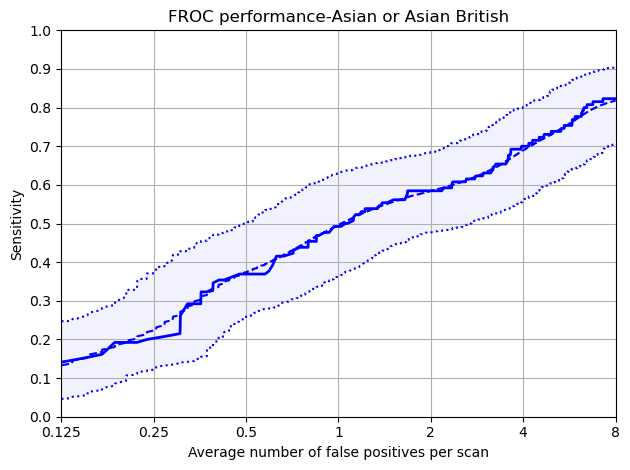

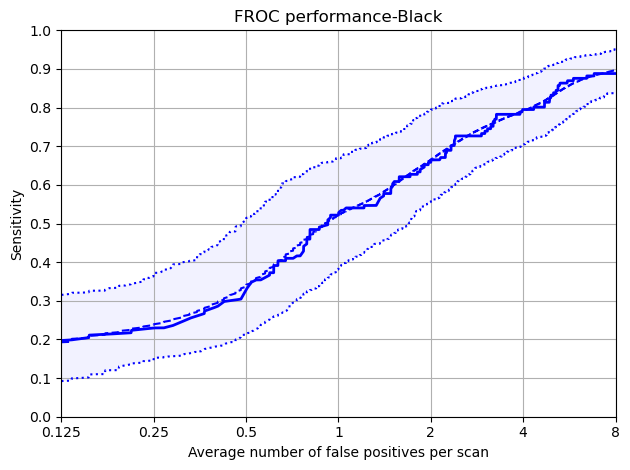

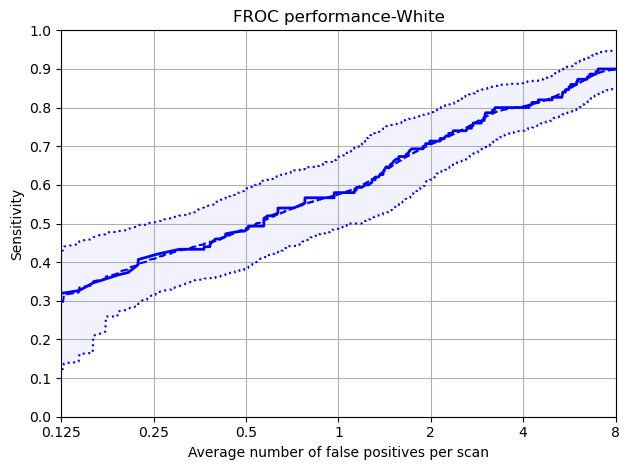

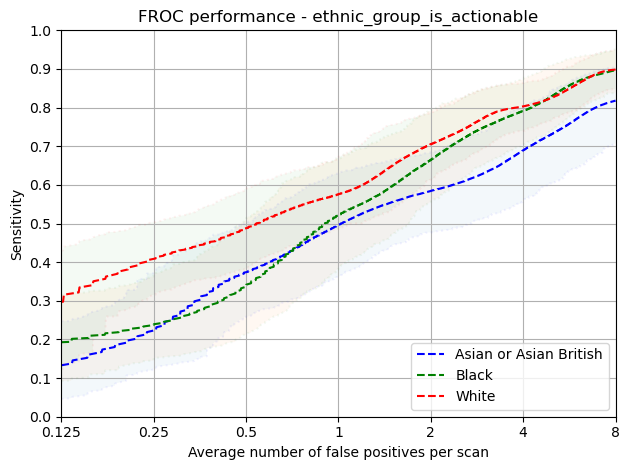

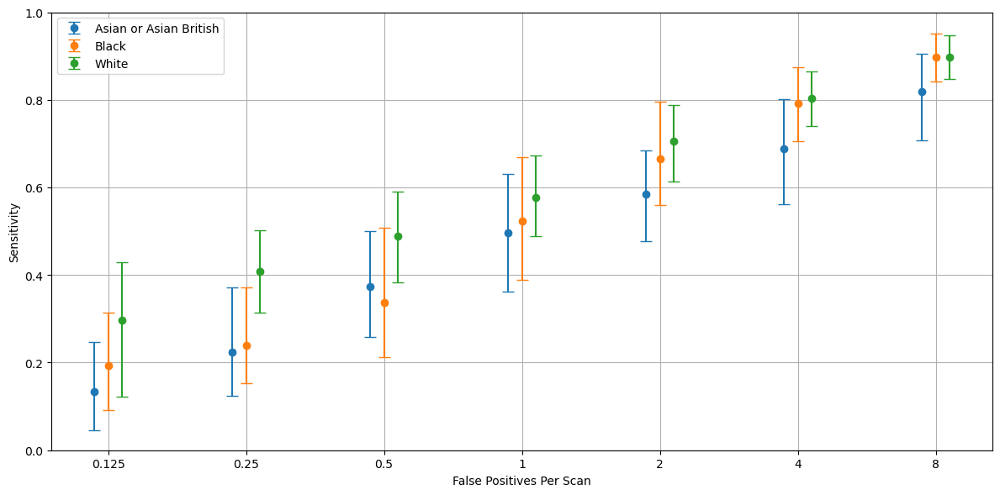

In [37]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Actionable, Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### NonActionable - Ethnic Group

Protected Group: Black


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,13.0,85.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpfzulvevd/annotations.csv
Total number of included nodule annotations: 89
Total number of nodule annotations: 89
Cases: 148


100%|██████████| 1000/1000 [00:07<00:00, 137.24it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/ethnic_group_is_not_actionable/Black directory


,0,159,476,1111,2381,4920,9999
0,0.396 (0.266 - 0.522),0.484 (0.366 - 0.61),0.591 (0.482 - 0.706),0.697 (0.605 - 0.795),0.803 (0.709 - 0.895),0.895 (0.826 - 0.959),0.928 (0.87 - 0.975)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.396,0.266,0.522
159,0.250,0.484,0.366,0.610
476,0.500,0.591,0.482,0.706
1111,1.000,0.697,0.605,0.795
2381,2.000,0.803,0.709,0.895
4920,4.000,0.895,0.826,0.959
9999,8.000,0.928,0.870,0.975


Mean Sensitivity: 0.68 Low Sensitivity: 0.59 High Sensitivity: 0.78


,True positives,86
0,False positives,5200.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,5330.000
4,Total number of nodules,89.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,44.000
7,Sensitivity,0.966
8,Average number of candidates per scan,36.014


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,23.0,75.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpxrrmx_3j/annotations.csv
Total number of included nodule annotations: 73
Total number of nodule annotations: 73
Cases: 138


100%|██████████| 1000/1000 [00:06<00:00, 151.73it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/ethnic_group_is_not_actionable/Asian or Asian British directory


,0,159,476,1111,2381,4920,9999
0,0.245 (0.134 - 0.386),0.425 (0.254 - 0.605),0.61 (0.487 - 0.735),0.762 (0.653 - 0.859),0.923 (0.829 - 0.986),0.973 (0.935 - 1.0),1.0 (1.0 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.245,0.134,0.386
159,0.250,0.425,0.254,0.605
476,0.500,0.610,0.487,0.735
1111,1.000,0.762,0.653,0.859
2381,2.000,0.923,0.829,0.986
4920,4.000,0.973,0.935,1.000
9999,8.000,1.000,1.000,1.000


Mean Sensitivity: 0.71 Low Sensitivity: 0.61 High Sensitivity: 0.796


,True positives,73
0,False positives,4800.000
1,False negatives,0.000
2,True negatives,0.000
3,Total number of candidates,4925.000
4,Total number of nodules,73.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,52.000
7,Sensitivity,1.000
8,Average number of candidates per scan,35.688


Protected Group: White


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,15.0,83.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpy_a078cr/annotations.csv
Total number of included nodule annotations: 92
Total number of nodule annotations: 92
Cases: 137
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:06<00:00, 147.35it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/ethnic_group_is_not_actionable/White directory


,0,159,476,1111,2381,4920,9999
0,0.221 (0.127 - 0.334),0.343 (0.244 - 0.444),0.488 (0.37 - 0.613),0.709 (0.597 - 0.811),0.833 (0.744 - 0.92),0.947 (0.897 - 0.989),0.973 (0.93 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.221,0.127,0.334
159,0.250,0.343,0.244,0.444
476,0.500,0.488,0.370,0.613
1111,1.000,0.709,0.597,0.811
2381,2.000,0.833,0.744,0.920
4920,4.000,0.947,0.897,0.989
9999,8.000,0.973,0.930,1.000


Mean Sensitivity: 0.64 Low Sensitivity: 0.56 High Sensitivity: 0.73


,True positives,91
0,False positives,4961.000
1,False negatives,1.000
2,True negatives,0.000
3,Total number of candidates,5103.000
4,Total number of nodules,92.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,54.000
7,Sensitivity,0.989
8,Average number of candidates per scan,37.248


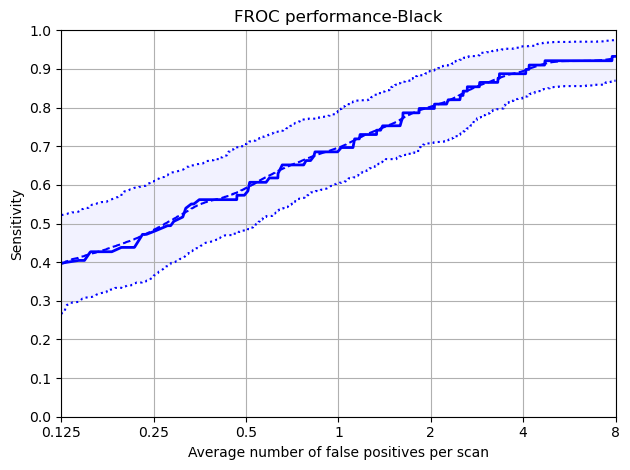

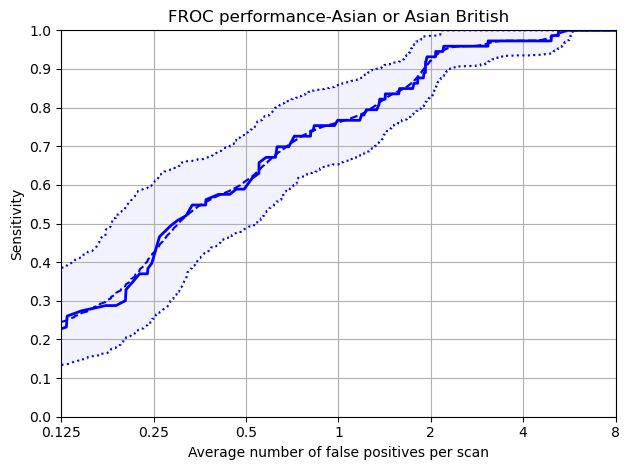

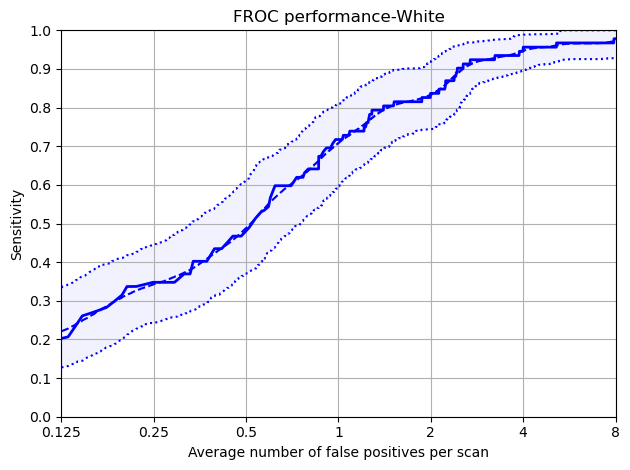

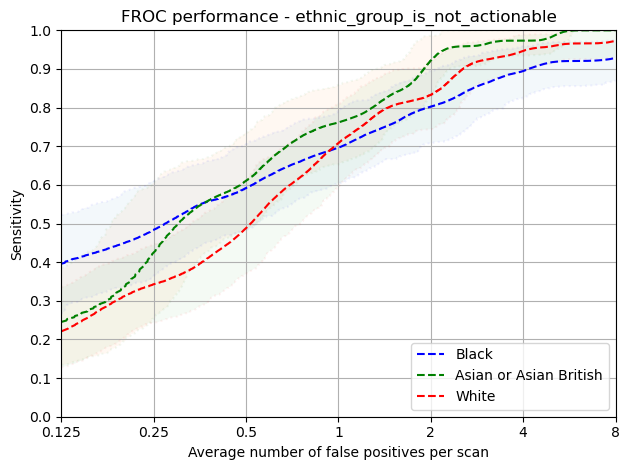

In [38]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable IMDRank

Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,43.0,22.0,5.0,15.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpycc15ifm/annotations.csv
Total number of included nodule annotations: 111
Total number of nodule annotations: 111
Cases: 54
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:03<00:00, 275.00it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/imdrank_is_actionable/High_IMDRank_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.269 (0.17 - 0.386),0.345 (0.238 - 0.451),0.432 (0.3 - 0.577),0.542 (0.431 - 0.654),0.601 (0.484 - 0.722),0.699 (0.583 - 0.81),0.804 (0.702 - 0.894)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.269,0.170,0.386
159,0.250,0.345,0.238,0.451
476,0.500,0.432,0.300,0.577
1111,1.000,0.542,0.431,0.654
2381,2.000,0.601,0.484,0.722
4920,4.000,0.699,0.583,0.810
9999,8.000,0.804,0.702,0.894


Mean Sensitivity: 0.53 Low Sensitivity: 0.42 High Sensitivity: 0.642


,True positives,104
0,False positives,2640.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,2890.000
4,Total number of nodules,111.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,148.000
7,Sensitivity,0.937
8,Average number of candidates per scan,53.519


Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,43.0,7.0,12.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpfam9fz_5/annotations.csv
Total number of included nodule annotations: 121
Total number of nodule annotations: 121
Cases: 49


100%|██████████| 1000/1000 [00:03<00:00, 293.68it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/imdrank_is_actionable/Medium_IMDRank_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.168 (0.051 - 0.375),0.286 (0.127 - 0.432),0.389 (0.258 - 0.526),0.493 (0.371 - 0.625),0.669 (0.582 - 0.76),0.803 (0.707 - 0.885),0.921 (0.863 - 0.972)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.168,0.051,0.375
159,0.250,0.286,0.127,0.432
476,0.500,0.389,0.258,0.526
1111,1.000,0.493,0.371,0.625
2381,2.000,0.669,0.582,0.760
4920,4.000,0.803,0.707,0.885
9999,8.000,0.921,0.863,0.972


Mean Sensitivity: 0.53 Low Sensitivity: 0.42 High Sensitivity: 0.654


,True positives,116
0,False positives,2438.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,2710.000
4,Total number of nodules,121.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,156.000
7,Sensitivity,0.959
8,Average number of candidates per scan,55.306


Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,46.0,5.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpbz_h149y/annotations.csv
Total number of included nodule annotations: 206
Total number of nodule annotations: 206
Cases: 69


100%|██████████| 1000/1000 [00:04<00:00, 227.81it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/imdrank_is_actionable/Low_IMDRank_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.176 (0.067 - 0.311),0.29 (0.188 - 0.426),0.405 (0.284 - 0.55),0.542 (0.426 - 0.671),0.672 (0.566 - 0.774),0.791 (0.72 - 0.855),0.889 (0.842 - 0.93)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.176,0.067,0.311
159,0.250,0.290,0.188,0.426
476,0.500,0.405,0.284,0.550
1111,1.000,0.542,0.426,0.671
2381,2.000,0.672,0.566,0.774
4920,4.000,0.791,0.720,0.855
9999,8.000,0.889,0.842,0.930


Mean Sensitivity: 0.54 Low Sensitivity: 0.44 High Sensitivity: 0.645


,True positives,197
0,False positives,3234.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,3670.000
4,Total number of nodules,206.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,239.000
7,Sensitivity,0.956
8,Average number of candidates per scan,53.188


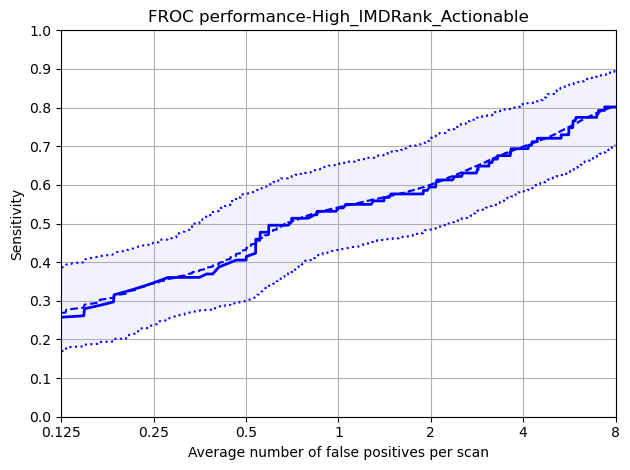

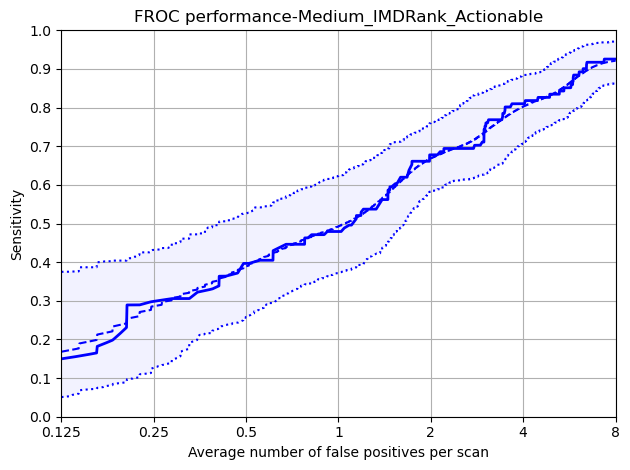

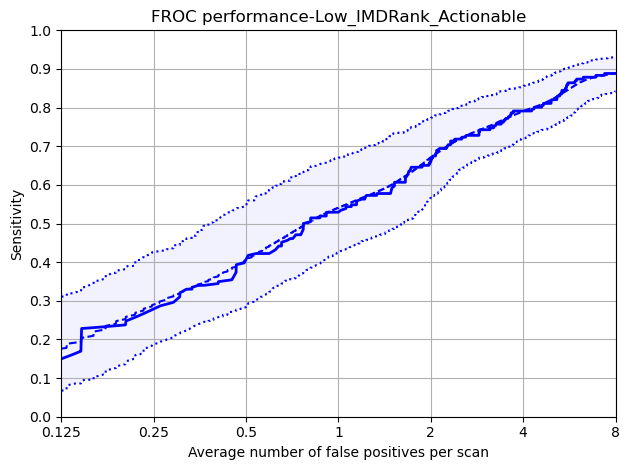

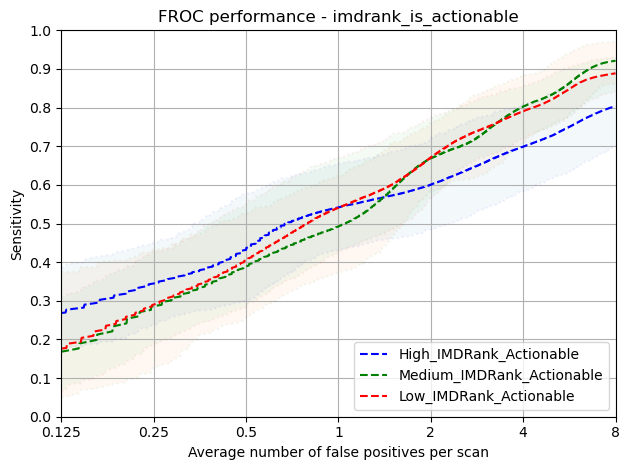

In [39]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Smoking Status

Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,38.0,38.0,4.0,9.0,11.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpmjddjeai/annotations.csv
Total number of included nodule annotations: 181
Total number of nodule annotations: 181
Cases: 71
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:04<00:00, 202.90it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/smoking_pack_years_is_actionable/Low_Pack_Years_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.178 (0.089 - 0.281),0.271 (0.157 - 0.422),0.408 (0.286 - 0.544),0.531 (0.424 - 0.658),0.639 (0.545 - 0.736),0.763 (0.673 - 0.848),0.868 (0.789 - 0.93)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.178,0.089,0.281
159,0.250,0.271,0.157,0.422
476,0.500,0.408,0.286,0.544
1111,1.000,0.531,0.424,0.658
2381,2.000,0.639,0.545,0.736
4920,4.000,0.763,0.673,0.848
9999,8.000,0.868,0.789,0.930


Mean Sensitivity: 0.52 Low Sensitivity: 0.42 High Sensitivity: 0.631


,True positives,171
0,False positives,3576.000
1,False negatives,10.000
2,True negatives,0.000
3,Total number of candidates,3968.000
4,Total number of nodules,181.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,223.000
7,Sensitivity,0.945
8,Average number of candidates per scan,55.887


Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,39.0,9.0,13.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmprgsbynei/annotations.csv
Total number of included nodule annotations: 127
Total number of nodule annotations: 127
Cases: 50


100%|██████████| 1000/1000 [00:03<00:00, 292.82it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/smoking_pack_years_is_actionable/High_Pack_Years_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.237 (0.111 - 0.438),0.337 (0.186 - 0.474),0.388 (0.278 - 0.54),0.516 (0.379 - 0.653),0.66 (0.551 - 0.777),0.796 (0.713 - 0.87),0.866 (0.792 - 0.93)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.237,0.111,0.438
159,0.250,0.337,0.186,0.474
476,0.500,0.388,0.278,0.540
1111,1.000,0.516,0.379,0.653
2381,2.000,0.660,0.551,0.777
4920,4.000,0.796,0.713,0.870
9999,8.000,0.866,0.792,0.930


Mean Sensitivity: 0.54 Low Sensitivity: 0.43 High Sensitivity: 0.669


,True positives,119
0,False positives,2470.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,2705.000
4,Total number of nodules,127.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,116.000
7,Sensitivity,0.937
8,Average number of candidates per scan,54.100


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,38.0,5.0,10.0,11.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp9ih6329b/annotations.csv
Total number of included nodule annotations: 133
Total number of nodule annotations: 133
Cases: 53


100%|██████████| 1000/1000 [00:03<00:00, 303.23it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/test_balanced/smoking_pack_years_is_actionable/Medium_Pack_Years_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.139 (0.007 - 0.322),0.294 (0.157 - 0.428),0.401 (0.296 - 0.516),0.541 (0.414 - 0.654),0.644 (0.529 - 0.748),0.744 (0.649 - 0.828),0.889 (0.831 - 0.94)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.139,0.007,0.322
159,0.250,0.294,0.157,0.428
476,0.500,0.401,0.296,0.516
1111,1.000,0.541,0.414,0.654
2381,2.000,0.644,0.529,0.748
4920,4.000,0.744,0.649,0.828
9999,8.000,0.889,0.831,0.940


Mean Sensitivity: 0.52 Low Sensitivity: 0.41 High Sensitivity: 0.634


,True positives,128
0,False positives,2327.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,2661.000
4,Total number of nodules,133.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,206.000
7,Sensitivity,0.962
8,Average number of candidates per scan,50.208


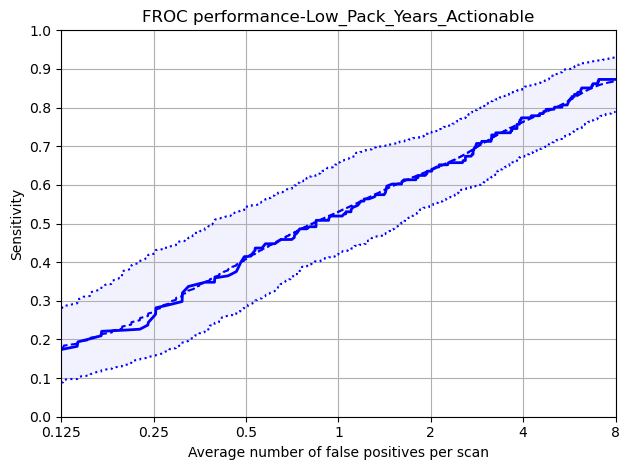

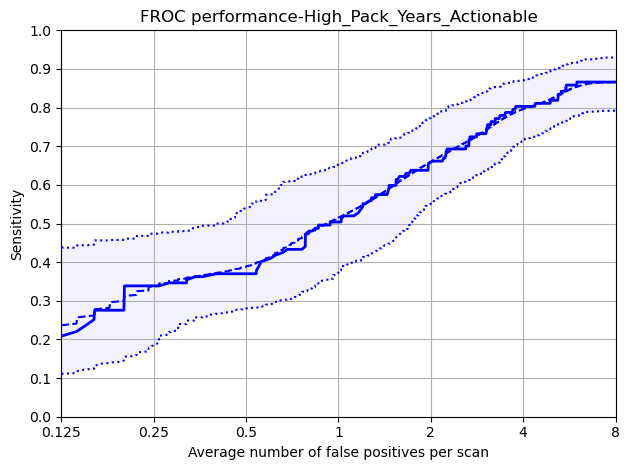

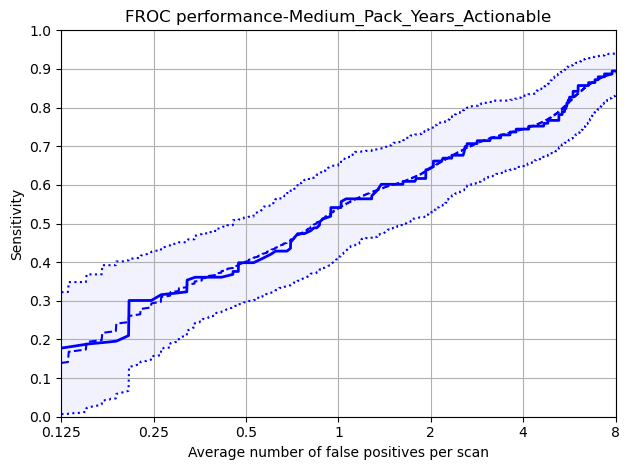

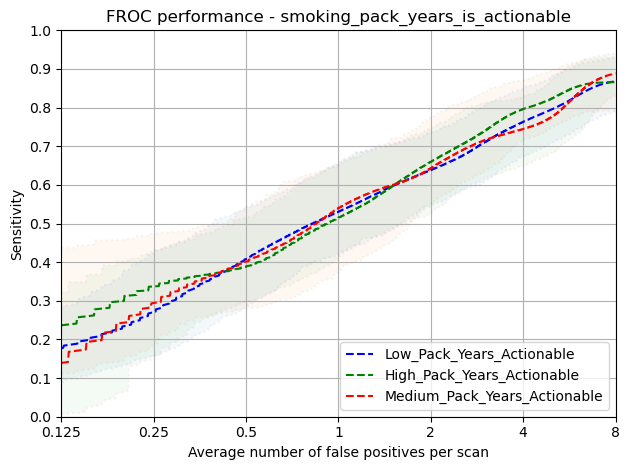

In [40]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)


### False Positive and Miss Analysis


In [58]:
thresholds = utils.get_thresholds(detection_summit_summit)
print(thresholds)
missed_metadata = utils.miss_anaysis_at_fpps(
    model='detection',
    experiment=flavour,
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    annotations_path=f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    predictions_path=detection_predictions_path,
    thresholds=thresholds
)

[0.994140625, 0.9892578125, 0.9814453125, 0.9638671875, 0.9189453125, 0.7685546875, 0.42529296875]
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/test_balanced/annotations.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
Missed Annotations at 0.994140625 FPPs: 562
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/test_balanced/annotations.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
Missed Annotations at 0.9892578125 FPPs: 475
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/test_balanced/annotations.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
Missed Annotations at 0.9814453125 FPPs: 373
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_sum

In [59]:
hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)

#### Incremental FROC Scores - Gender/ Ethnic Group / Nodule Type

In [60]:

# display(hit_and_miss_dict[0])
recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = 100
                    

    recode_dict[idx] = hmm

pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

df = pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

a='White'
b='Black'

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** all {type} ***')
    group1 = f'all_{a}_{type}_Hits%'
    group2 = f'all_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** actionable {type} ***')
    group1 = f'actionable_{a}_{type}_Hits%'
    group2 = f'actionable_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

Error: 6, all, MALE, PART_SOLID
Error: 6, all, FEMALE, PART_SOLID
Error: 6, all, All, PART_SOLID
Error: 6, all, Asian or Asian British, PART_SOLID
Error: 6, all, Black, PART_SOLID
Error: 6, all, White, PART_SOLID
Error: 6, actionable, MALE, PART_SOLID
Error: 6, actionable, FEMALE, PART_SOLID
Error: 6, actionable, All, PART_SOLID
Error: 6, actionable, Asian or Asian British, PART_SOLID
Error: 6, actionable, Black, PART_SOLID
Error: 6, actionable, White, PART_SOLID


all_MALE_SOLID_Hits%                                     27, 45, 60, 69, 80, 86, 95
all_MALE_NON_SOLID_Hits%                                   4, 7, 14, 14, 21, 32, 54
all_MALE_PART_SOLID_Hits%                               0, 22, 33, 56, 78, 100, 100
all_MALE_PERIFISSURAL_Hits%                              17, 28, 46, 64, 77, 92, 97
all_MALE_CALCIFIED_Hits%                                    0, 0, 6, 12, 25, 31, 56
all_FEMALE_SOLID_Hits%                                   35, 46, 56, 69, 80, 84, 89
all_FEMALE_NON_SOLID_Hits%                                  0, 0, 0, 10, 24, 52, 62
all_FEMALE_PART_SOLID_Hits%                              6, 25, 25, 56, 69, 81, 100
all_FEMALE_PERIFISSURAL_Hits%                            22, 36, 54, 66, 82, 92, 96
all_FEMALE_CALCIFIED_Hits%                                4, 20, 32, 48, 52, 80, 80
all_All_SOLID_Hits%                                      30, 45, 58, 69, 80, 85, 93
all_All_NON_SOLID_Hits%                                     2, 4, 8, 12, 22,

*** all SOLID ***
**************************************************
Independent T-Test: -0.166, 0.871
*** all NON_SOLID ***
**************************************************
Mann-Whitney U Test: 17.0, 0.365
*** all PART_SOLID ***
**************************************************
Independent T-Test: -0.423, 0.68
*** all PERIFISSURAL ***
**************************************************
Independent T-Test: 0.786, 0.447
*** all CALCIFIED ***
**************************************************
Mann-Whitney U Test: 38.0, 0.095
*** actionable SOLID ***
**************************************************
Independent T-Test: -0.032, 0.975
*** actionable NON_SOLID ***
**************************************************
Mann-Whitney U Test: 17.0, 0.365
*** actionable PART_SOLID ***
**************************************************
Independent T-Test: -0.423, 0.68
*** actionable PERIFISSURAL ***
**************************************************
Independent T-Test: 1.25, 0.235
*** actionable CA

#### Nodule Characteristic Analysis

,0-6mm,6-8mm,8-30mm,30-40mm,40+mm
0.125,0.12,0.39,0.17,0.00,0.0
0.25,0.24,0.53,0.30,0.29,0.0
0.5,0.41,0.65,0.43,0.29,0.5
1,0.58,0.75,0.53,0.57,0.5
2,0.72,0.83,0.68,0.71,0.5
4,0.86,0.91,0.79,0.71,0.5
8,0.92,0.94,0.89,1.00,0.5
Total Annotations,2502.00,1822.00,2144.00,38.00,8.0


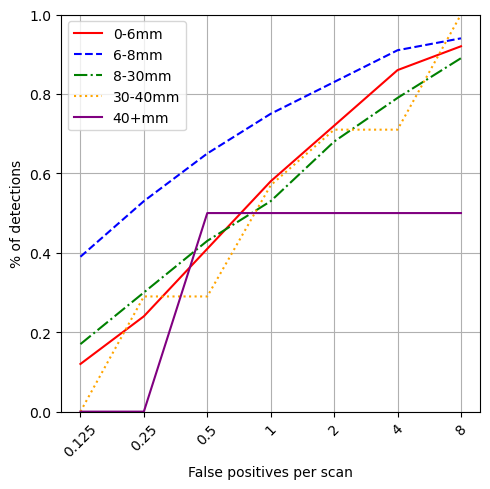

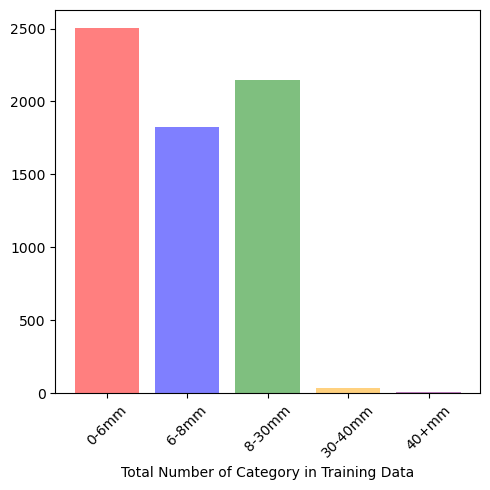

,SOLID,NON_SOLID,PART_SOLID,CALCIFIED
0.125,0.30,0.02,0.04,0.02
0.25,0.45,0.04,0.24,0.12
0.5,0.58,0.08,0.28,0.22
1,0.69,0.12,0.56,0.34
2,0.80,0.22,0.72,0.41
4,0.85,0.41,0.88,0.61
8,0.93,0.57,1.00,0.71
Total Annotations,1984.00,377.00,355.00,533.00


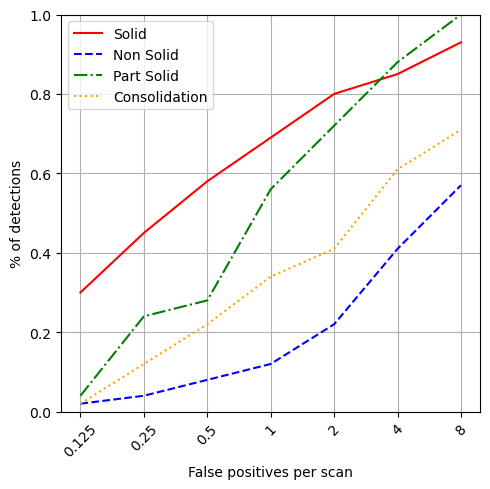

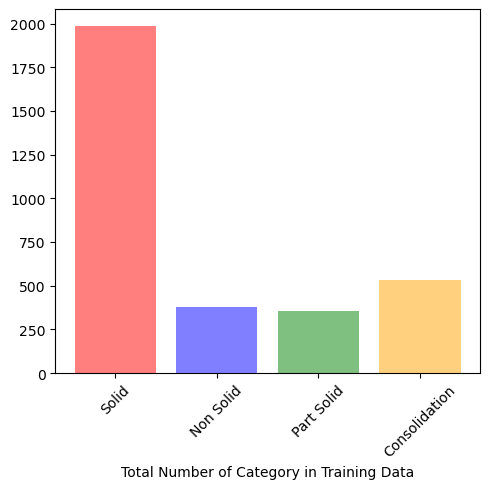

,LEFT_LOWER_LOBE,LEFT_UPPER_LOBE,RIGHT_UPPER_LOBE,RIGHT_LOWER_LOBE
0.125,0.24,0.20,0.18,0.17
0.25,0.35,0.32,0.27,0.31
0.5,0.53,0.45,0.38,0.46
1,0.63,0.50,0.61,0.60
2,0.72,0.68,0.71,0.75
4,0.82,0.82,0.80,0.84
8,0.89,0.92,0.90,0.91
Total Annotations,1163.00,952.00,1434.00,1215.00


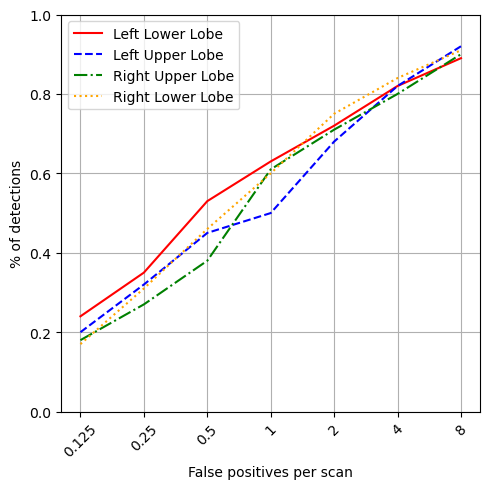

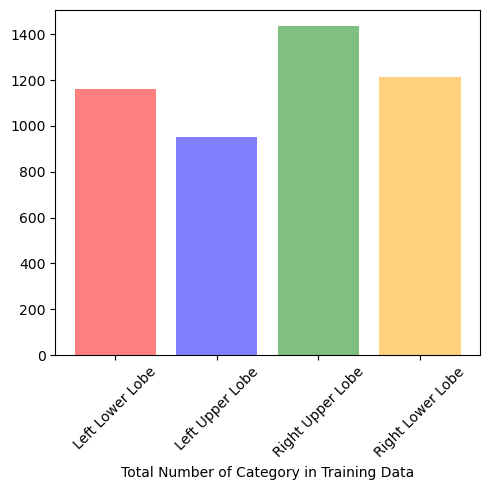

In [63]:

def cleanup(s):
    if s == 'CALCIFIED':
         return 'Consolidation'
    
    s = s.replace('_', ' ')
    s = ' '.join(word.capitalize() for word in s.split())
    return s



nodule_characteristics = {
    'diameter_cats': diameter_lbs,
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'CALCIFIED'],
    'nodule_site': [ 'LEFT_LOWER_LOBE', 'LEFT_MIDDLE_LOBE', 'LEFT_UPPER_LOBE', 'RIGHT_UPPER_LOBE', 'RIGHT_LOWER_LOBE']
}

for ivx, (var, order) in enumerate(nodule_characteristics.items()):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    training_data = (
        pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/training_metadata.csv')
        .assign(diameter_cats=lambda df: 
            pd.cut(
                df['nodule_diameter_mm'], 
                bins=diameter_cats,
                labels=diameter_lbs
            )            
        ))

    total_vc = training_data[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)

    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    total_vc = total_vc[total_vc.index.isin(df.index)].reindex(df.index)


    for isx, column in enumerate(df.T):    
        ax.plot(df.T[column], label=cleanup(column), linestyle=line_styles[isx], color=colors[isx])
            

    ax.set_xticklabels(labels=df.columns, rotation=45)
    ax.legend()    
    ax.set_xlabel('False positives per scan')
    ax.set_ylim(0, 1)
    ax.set_ylabel('% of detections')
    ax.grid(visible=True, which='both')

    plt.tight_layout()
    plt.savefig(f'{workspace_path}/miccai_fair_ai/detection_detected_nodule_characteristics_{var}.png')
    plt.show()


    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    ax.bar([cleanup(idx) for idx in total_vc.index], total_vc, alpha=0.5, label=cleanup(column), color=colors)
    ax.set_xticklabels(labels=[cleanup(idx) for idx in total_vc.index], rotation=45)
    ax.set_xlabel('Total Number of Category in Training Data')

    plt.tight_layout()
    plt.savefig(f'{workspace_path}/miccai_fair_ai/detection_detected_nodule_characteristics_{var}_total.png')
    plt.show()

    

In [45]:
import importlib
import utils

importlib.reload(utils)


def combine_counts_and_percs(df):

    output = {}

    for idx, rows in df.iterrows():

        output[idx] = {}
        output[idx]['Female Hits (%)'] = f"{rows['Female Hits Cnt']} ({rows['Female Hits Per']}%)"
        output[idx]['Female Misses (%)'] = f"{rows['Female Miss Cnt']} ({rows['Female Miss Per']}%)"
        output[idx]['Male Hits (%)'] = f"{rows['Male Hits Cnt']} ({rows['Male Hits Per']}%)"
        output[idx]['Male Misses (%)'] = f"{rows['Male Miss Cnt']} ({rows['Male Miss Per']}%)"


    return pd.DataFrame.from_dict(output, orient='index')


training_data = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/training_metadata.csv')
    .assign(diameter_cats=lambda df: 
        pd.cut(
            df['nodule_diameter_mm'], 
            bins=diameter_cats,
            labels=diameter_lbs
        )            
    ))

training_data['type_by_size'] = (training_data['nodule_type'].astype(str) + '_' + training_data['diameter_cats'].astype(str)).astype(str)



x_training = pd.crosstab(
    training_data['type_by_size'],
    training_data['gender'],
).merge(
    training_data['type_by_size'].value_counts().rename('Training Data').to_frame()
    , left_index=True, right_index=True
)


test_data = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_metadata.csv')
    .assign(diameter_cats=lambda df: 
        pd.cut(
            df['nodule_diameter_mm'], 
            bins=diameter_cats,
            labels=diameter_lbs
        )            
    ))

test_data['type_by_size'] = (test_data['nodule_type'].astype(str) + '_' + test_data['diameter_cats'].astype(str)).astype(str)

x_test = pd.crosstab(
    test_data['type_by_size'],
    test_data['gender'],
    normalize='columns'
).merge(
    test_data['type_by_size'].value_counts(normalize=True).rename('Test Data').to_frame()
    , left_index=True, right_index=True
).applymap(lambda x: round(100*x,1))


x_training = x_training.merge(x_test, left_index=True, right_index=True)

x_training.to_csv('x_training.csv')
display(x_training)

x_merge_list = []
for mm in missed_metadata:

    mma = mm[mm['management_plan'].isin(['3_MONTH_FOLLOW_UP_SCAN','URGENT_REFERRAL', 'ALWAYS_SCAN_AT_YEAR_1'])]
    mma['diameter_cats'] = pd.cut(mma['nodule_diameter_mm'], bins=diameter_cats, labels=diameter_lbs)

    mma['type_by_size'] = (mma['nodule_type'].astype(str) + '_' + mma['diameter_cats'].astype(str)).astype(str)

    female = mma[mma.gender=='FEMALE']

    female_x = pd.crosstab(
        female['type_by_size'],
        female['miss'],
        margins=True,
    ).rename(columns={0:'Female Hits Cnt',1:'Female Miss Cnt'})

    male = mma[mma.gender=='MALE']

    male_x_perc = pd.crosstab(
        male['type_by_size'],
        male['miss'],
        normalize='index',
        margins=True,
    ).rename(columns={0:'Male Hits Per',1:'Male Miss Per'})

    female_x_perc = pd.crosstab(
        female['type_by_size'],
        female['miss'],
        normalize='index',
        margins=True,
    ).rename(columns={0:'Female Hits Per',1:'Female Miss Per'})

    male = mma[mma.gender=='MALE']

    male_x = pd.crosstab(
        male['type_by_size'],
        male['miss'],
        margins=True,
    ).rename(columns={0:'Male Hits Cnt',1:'Male Miss Cnt'})    

    x_merged = (female_x.merge(
            male_x, 
            how='outer', 
            left_index=True,
            right_index=True
        ).fillna(0))
    
    x_merged_perc = (female_x_perc.merge(
            male_x_perc, 
            how='outer', 
            left_index=True,
            right_index=True
        ).fillna(0).applymap(lambda x: round(100*x,1)))
    
    x_merge_list.append(x_merged)

    x_combined = combine_counts_and_percs(
        x_merged.merge(x_merged_perc, left_index=True, right_index=True)
    ).merge(x_training, how='left', left_index=True, right_index=True).sort_values('Training Data', ascending=False)

    display(x_combined)

    
pd.concat(x_merge_list, axis=1).to_csv(f'{workspace_path}/detection_missed_nodule_characteristics.csv')

,FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
CALCIFIED_0-6mm,76,62,138,1.7,1.8,1.7
CALCIFIED_30-40mm,6,12,18,0.3,0.5,0.4
CALCIFIED_6-8mm,21,34,55,0.3,0.2,0.3
CALCIFIED_8-30mm,148,146,294,5.7,1.2,3.1
CALCIFIED_nan,15,10,25,0.3,0.2,0.3
NON_SOLID_0-6mm,25,19,44,1.7,1.2,1.4
NON_SOLID_6-8mm,31,29,60,2.0,1.0,1.4
NON_SOLID_8-30mm,135,132,267,3.3,4.8,4.1
PART_SOLID_0-6mm,11,6,17,0.7,0.0,0.3
PART_SOLID_30-40mm,1,4,5,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,5.0 (41.7%),7.0 (58.3%),8.0 (44.4%),10.0 (55.6%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,11.0 (33.3%),22.0 (66.7%),9.0 (18.8%),39.0 (81.2%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,2.0 (66.7%),1.0 (33.3%),2.0 (66.7%),1.0 (33.3%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,1.0 (5.9%),16.0 (94.1%),0.0 (0.0%),5.0 (100.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,1.0 (9.1%),10.0 (90.9%),0.0 (0.0%),5.0 (100.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,0.0 (0.0%),10.0 (100.0%),0.0 (0.0%),19.0 (100.0%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,0.0 (0.0%),5.0 (100.0%),0.0 (0.0%),7.0 (100.0%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,0.0 (0.0%),6.0 (100.0%),1.0 (25.0%),3.0 (75.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,0.0 (0.0%),2.0 (100.0%),0.0 (0.0%),3.0 (100.0%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,0.0 (0.0%),1.0 (100.0%),0.0 (0.0%),1.0 (100.0%),21.0,34.0,55.0,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,5.0 (41.7%),7.0 (58.3%),13.0 (72.2%),5.0 (27.8%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,16.0 (48.5%),17.0 (51.5%),15.0 (31.2%),33.0 (68.8%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,2.0 (66.7%),1.0 (33.3%),2.0 (66.7%),1.0 (33.3%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,3.0 (17.6%),14.0 (82.4%),0.0 (0.0%),5.0 (100.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,4.0 (36.4%),7.0 (63.6%),1.0 (20.0%),4.0 (80.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,0.0 (0.0%),10.0 (100.0%),1.0 (5.3%),18.0 (94.7%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,0.0 (0.0%),5.0 (100.0%),0.0 (0.0%),7.0 (100.0%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,0.0 (0.0%),6.0 (100.0%),1.0 (25.0%),3.0 (75.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,0.0 (0.0%),2.0 (100.0%),1.0 (33.3%),2.0 (66.7%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,1.0 (100.0%),0.0 (0.0%),0.0 (0.0%),1.0 (100.0%),21.0,34.0,55.0,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,6.0 (50.0%),6.0 (50.0%),14.0 (77.8%),4.0 (22.2%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,19.0 (57.6%),14.0 (42.4%),23.0 (47.9%),25.0 (52.1%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,2.0 (66.7%),1.0 (33.3%),2.0 (66.7%),1.0 (33.3%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,6.0 (35.3%),11.0 (64.7%),0.0 (0.0%),5.0 (100.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,4.0 (36.4%),7.0 (63.6%),1.0 (20.0%),4.0 (80.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,0.0 (0.0%),10.0 (100.0%),3.0 (15.8%),16.0 (84.2%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,0.0 (0.0%),5.0 (100.0%),0.0 (0.0%),7.0 (100.0%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,0.0 (0.0%),6.0 (100.0%),1.0 (25.0%),3.0 (75.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,0.0 (0.0%),2.0 (100.0%),2.0 (66.7%),1.0 (33.3%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,1.0 (100.0%),0.0 (0.0%),1.0 (100.0%),0.0 (0.0%),21.0,34.0,55.0,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,7.0 (58.3%),5.0 (41.7%),14.0 (77.8%),4.0 (22.2%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,22.0 (66.7%),11.0 (33.3%),27.0 (56.2%),21.0 (43.8%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,2.0 (66.7%),1.0 (33.3%),2.0 (66.7%),1.0 (33.3%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,9.0 (52.9%),8.0 (47.1%),0.0 (0.0%),5.0 (100.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,7.0 (63.6%),4.0 (36.4%),2.0 (40.0%),3.0 (60.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,1.0 (10.0%),9.0 (90.0%),3.0 (15.8%),16.0 (84.2%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,1.0 (20.0%),4.0 (80.0%),0.0 (0.0%),7.0 (100.0%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,0.0 (0.0%),6.0 (100.0%),1.0 (25.0%),3.0 (75.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,1.0 (50.0%),1.0 (50.0%),3.0 (100.0%),0.0 (0.0%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,1.0 (100.0%),0.0 (0.0%),1.0 (100.0%),0.0 (0.0%),21.0,34.0,55.0,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,8.0 (66.7%),4.0 (33.3%),16.0 (88.9%),2.0 (11.1%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,27.0 (81.8%),6.0 (18.2%),34.0 (70.8%),14.0 (29.2%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,2.0 (66.7%),1.0 (33.3%),2.0 (66.7%),1.0 (33.3%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,10.0 (58.8%),7.0 (41.2%),2.0 (40.0%),3.0 (60.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,8.0 (72.7%),3.0 (27.3%),3.0 (60.0%),2.0 (40.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,3.0 (30.0%),7.0 (70.0%),5.0 (26.3%),14.0 (73.7%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,1.0 (20.0%),4.0 (80.0%),0.0 (0.0%),7.0 (100.0%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,1.0 (16.7%),5.0 (83.3%),1.0 (25.0%),3.0 (75.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,2.0 (100.0%),0.0 (0.0%),3.0 (100.0%),0.0 (0.0%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,1.0 (100.0%),0.0 (0.0%),1.0 (100.0%),0.0 (0.0%),21.0,34.0,55.0,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,8.0 (66.7%),4.0 (33.3%),16.0 (88.9%),2.0 (11.1%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,28.0 (84.8%),5.0 (15.2%),36.0 (75.0%),12.0 (25.0%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,2.0 (66.7%),1.0 (33.3%),3.0 (100.0%),0.0 (0.0%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,15.0 (88.2%),2.0 (11.8%),2.0 (40.0%),3.0 (60.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,10.0 (90.9%),1.0 (9.1%),5.0 (100.0%),0.0 (0.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,5.0 (50.0%),5.0 (50.0%),7.0 (36.8%),12.0 (63.2%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,3.0 (60.0%),2.0 (40.0%),1.0 (14.3%),6.0 (85.7%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,4.0 (66.7%),2.0 (33.3%),2.0 (50.0%),2.0 (50.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,2.0 (100.0%),0.0 (0.0%),3.0 (100.0%),0.0 (0.0%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,1.0 (100.0%),0.0 (0.0%),1.0 (100.0%),0.0 (0.0%),21.0,34.0,55.0,0.3,0.2,0.3


,Female Hits (%),Female Misses (%),Male Hits (%),Male Misses (%),FEMALE_x,MALE_x,Training Data,FEMALE_y,MALE_y,Test Data
SOLID_6-8mm,9.0 (75.0%),3.0 (25.0%),18.0 (100.0%),0.0 (0.0%),307.0,479.0,786.0,7.7,8.2,8.0
SOLID_8-30mm,31.0 (93.9%),2.0 (6.1%),44.0 (91.7%),4.0 (8.3%),248.0,514.0,762.0,11.0,13.0,12.2
SOLID_0-6mm,2.0 (66.7%),1.0 (33.3%),3.0 (100.0%),0.0 (0.0%),161.0,261.0,422.0,7.4,9.0,8.3
CALCIFIED_8-30mm,15.0 (88.2%),2.0 (11.8%),4.0 (80.0%),1.0 (20.0%),148.0,146.0,294.0,5.7,1.2,3.1
PART_SOLID_8-30mm,11.0 (100.0%),0.0 (0.0%),5.0 (100.0%),0.0 (0.0%),136.0,141.0,277.0,3.7,1.2,2.3
NON_SOLID_8-30mm,5.0 (50.0%),5.0 (50.0%),12.0 (63.2%),7.0 (36.8%),135.0,132.0,267.0,3.3,4.8,4.1
CALCIFIED_0-6mm,3.0 (60.0%),2.0 (40.0%),2.0 (28.6%),5.0 (71.4%),76.0,62.0,138.0,1.7,1.8,1.7
NON_SOLID_6-8mm,5.0 (83.3%),1.0 (16.7%),2.0 (50.0%),2.0 (50.0%),31.0,29.0,60.0,2.0,1.0,1.4
PART_SOLID_6-8mm,2.0 (100.0%),0.0 (0.0%),3.0 (100.0%),0.0 (0.0%),27.0,28.0,55.0,0.7,0.8,0.7
CALCIFIED_6-8mm,1.0 (100.0%),0.0 (0.0%),1.0 (100.0%),0.0 (0.0%),21.0,34.0,55.0,0.3,0.2,0.3


,0-6mm,6-8mm,8-30mm,30-40mm,40+mm
0.125,0.28,0.43,0.25,0.0,0.0
0.25,0.41,0.62,0.38,0.5,0.0
0.5,0.59,0.70,0.51,0.5,0.5
1,0.76,0.75,0.61,0.5,0.5
2,0.84,0.84,0.76,0.5,0.5
4,0.93,0.88,0.80,0.5,0.5
8,0.93,0.93,0.93,1.0,0.5
Total Annotations,211.00,393.00,381.00,5.0,2.0


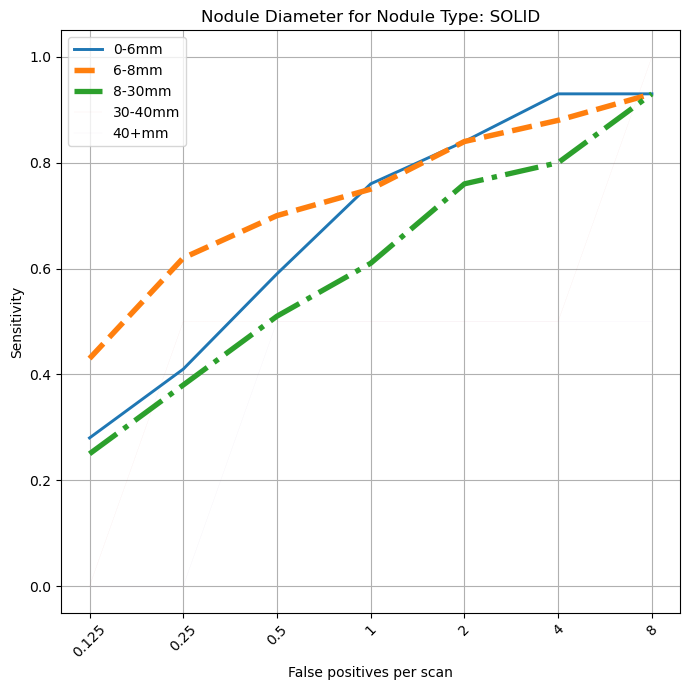

,0-6mm,6-8mm,8-30mm,30-40mm,40+mm
0.125,0.0,0.1,0.00,0.0,0.0
0.25,0.0,0.1,0.03,0.0,0.0
0.5,0.0,0.1,0.10,0.0,0.0
1,0.1,0.1,0.14,0.0,0.0
2,0.1,0.2,0.28,0.0,0.0
4,0.2,0.6,0.41,0.0,0.0
8,0.4,0.7,0.59,0.0,0.0
Total Annotations,22.0,30.0,133.50,2.5,0.5


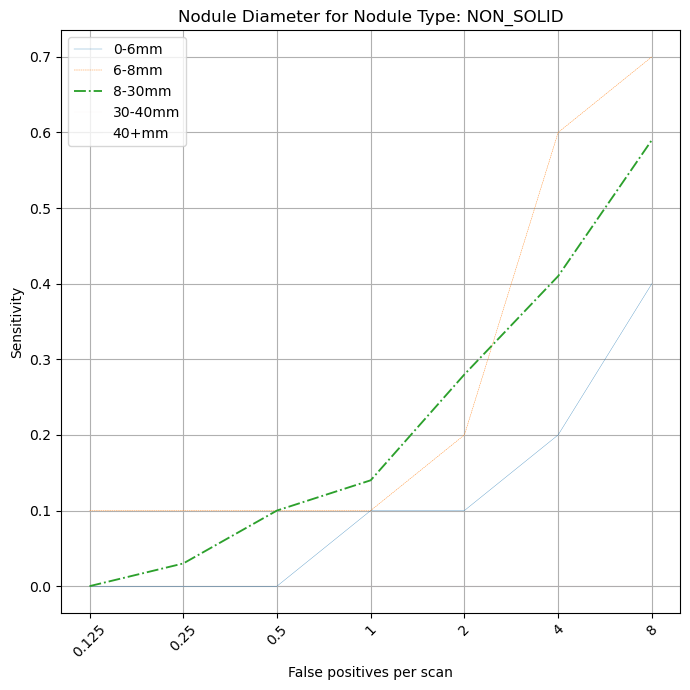

,0-6mm,6-8mm,8-30mm,30-40mm
0.125,0.0,0.0,0.06,0.0
0.25,0.0,0.2,0.31,0.0
0.5,0.0,0.4,0.31,0.0
1,0.0,0.8,0.56,0.5
2,0.0,1.0,0.69,1.0
4,0.0,1.0,0.94,1.0
8,1.0,1.0,1.00,1.0
Total Annotations,8.5,27.5,138.50,2.5


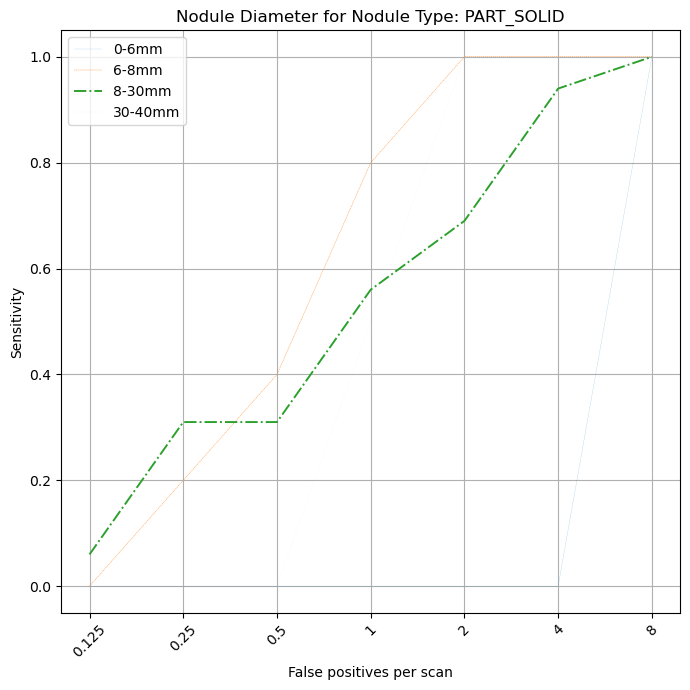

,0-6mm,6-8mm,8-30mm,30-40mm,40+mm
0.125,0.00,0.0,0.05,0.00,0.0
0.25,0.00,0.5,0.14,0.33,0.0
0.5,0.00,1.0,0.27,0.33,0.0
1,0.08,1.0,0.41,0.67,0.0
2,0.08,1.0,0.55,0.67,0.0
4,0.33,1.0,0.77,0.67,0.0
8,0.42,1.0,0.86,1.00,0.0
Total Annotations,69.00,27.5,147.00,9.00,1.5


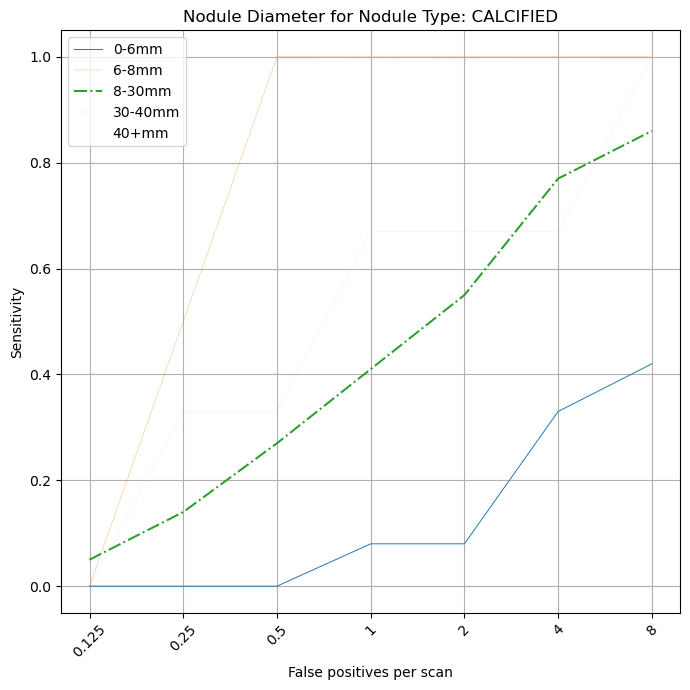

In [46]:
def cleanup(s):
    if s == 'CALCIFIED':
         return 'Inflamatory consolidation'
    
    s = s.replace('_', ' ')
    s = ' '.join(word.capitalize() for word in s.split())
    return s


for ivx, var in enumerate(['SOLID', 'NON_SOLID', 'PART_SOLID', 'CALCIFIED']):

    training_data = (
        pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/training_metadata.csv')
        .assign(diameter_cats=lambda df: 
            pd.cut(
                df['nodule_diameter_mm'], 
                bins=diameter_cats,
                labels=diameter_lbs
            )            
        ))
    training_data = training_data[training_data['nodule_type'] == var]

    total_vc = training_data['diameter_cats'].value_counts().sort_index().rename('Total Annotations')/2

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):

        metadata = metadata[metadata['nodule_type'] == var]

        
        x = (pd.crosstab(
            metadata['diameter_cats'], 
            metadata['miss'],
            normalize='index'
        )[False]
        .rename(f'{operating_points[idx]}')
        .reindex(diameter_lbs)
        .fillna(0))            
        results.append(x)




    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)
    
    df = df.loc[(df != 0).any(axis=1)]

    display(df.T)

    fig, ax = plt.subplots(1, 1, figsize=(7, 7))
    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    for isx, column in enumerate(df.T):    
        ax.plot(df.T[column], label=cleanup(column), linestyle=line_styles[isx], linewidth=weights[isx]/100)
    
    ax.set_xticklabels(labels=df.columns, rotation=45)
    ax.legend()
    ax.set_xlabel('False positives per scan')
    ax.set_ylabel('Sensitivity')
    ax.set_title(f'Nodule Diameter for Nodule Type: {var}')
    ax.grid(visible=True, which='both')

    plt.tight_layout()
    # plt.savefig(f'{workspace_path}/miccai_fair_ai/detection_detected_nodule_characteristics_{column}.png')
    plt.show()

,FEMALE,MALE,Total
"(CALCIFIED, 3_MONTH_FOLLOW_UP_SCAN)",25 (8.4%),16 (4.0%),41 (5.9%)
"(NON_SOLID, ALWAYS_SCAN_AT_YEAR_1)",18 (6.0%),25 (6.2%),43 (6.2%)
"(NON_SOLID, RANDOMISATION_AT_YEAR_1)",3 (1.0%),3 (0.8%),6 (0.9%)
"(PART_SOLID, 3_MONTH_FOLLOW_UP_SCAN)",16 (5.4%),9 (2.2%),25 (3.6%)
"(PERIFISSURAL, RANDOMISATION_AT_YEAR_1)",156 (52.2%),225 (56.2%),381 (54.5%)
"(SOLID, 3_MONTH_FOLLOW_UP_SCAN)",35 (11.7%),56 (14.0%),91 (13.0%)
"(SOLID, RANDOMISATION_AT_YEAR_1)",30 (10.0%),52 (13.0%),82 (11.7%)
"(SOLID, URGENT_REFERRAL)",16 (5.4%),14 (3.5%),30 (4.3%)
Total,299,400,699


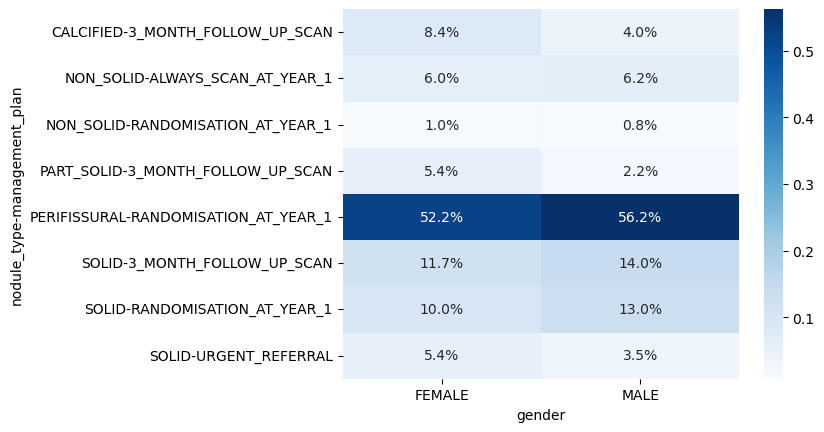

In [47]:
# Check what nodules have been missed by gender


missed_metadata_at_2fpps = missed_metadata[4]

def crosstab_with_percentages(rows, columns, x_order=None, y_order=None, table=False, heatmap=False):
    # Create the crosstab with absolutes
    cols = [c.astype(str) for c in columns]
    rows = [r.astype(str) for r in rows]

    xabs = pd.crosstab(rows, cols).fillna(0)
    xperc = pd.crosstab(rows, cols, normalize='columns').fillna(0)

    if x_order:
        xabs = xabs.reindex(x_order, axis=1)
        xperc = xperc.reindex(x_order, axis=1)

    if y_order:
        xabs = xabs.reindex(y_order)
        xperc = xperc.reindex(y_order)

    combined_data = {}

    for (adx, rabs), (pdx, rperc) in zip(xabs.iterrows(), xperc.iterrows()):

        row_data = {}
        row_total = 0

        for col in xabs.columns:
            row_data[col] = f"{rabs[col]} ({rperc[col]:.1%})"
            row_total += rabs[col]

        row_data['Total'] = f'{row_total} ({row_total / xabs.sum().sum():.1%})'
        combined_data[adx] = row_data

    row_data = {}
    row_total = 0
    for col in xabs.columns:
        row_data[col] = f'{sum(xabs[col])}'
        row_total += xabs[col].sum()

    row_data['Total'] = row_total
    combined_data['Total'] = row_data

    if table:
        display(pd.DataFrame.from_dict(combined_data).T)
        
    
    if heatmap:
        sns.heatmap(xperc, annot=True, fmt=".1%", cmap='Blues')
        plt.show()

    return xperc, pd.DataFrame.from_dict(combined_data)

_ = crosstab_with_percentages(
    [missed_metadata_at_2fpps['nodule_type'], missed_metadata_at_2fpps['management_plan']],
    [missed_metadata_at_2fpps['gender']],
    table=True,
    heatmap=True)

In [48]:
scans = pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv')
predictions = pd.read_csv(detection_predictions_path)
annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 204 at threshold: 0.994140625
distance false positives: 67 at threshold: 0.994140625
predictions: 360 at threshold: 0.9892578125
distance false positives: 136 at threshold: 0.9892578125
predictions: 608 at threshold: 0.9814453125
distance false positives: 282 at threshold: 0.9814453125
predictions: 1010 at threshold: 0.9638671875
distance false positives: 588 at threshold: 0.9638671875
predictions: 1698 at threshold: 0.9189453125
distance false positives: 1185 at threshold: 0.9189453125
predictions: 2982 at threshold: 0.7685546875
distance false positives: 2375 at threshold: 0.7685546875
predictions: 5470 at threshold: 0.42529296875
distance false positives: 4757 at threshold: 0.42529296875


#### Examples of False Positives

summit-9294-yyy_Y0_BASELINE_A already exists
summit-9294-yyy_Y0_BASELINE_A - 281 232 97 7.20703125
False Positive: True
IoU False Positive: nan


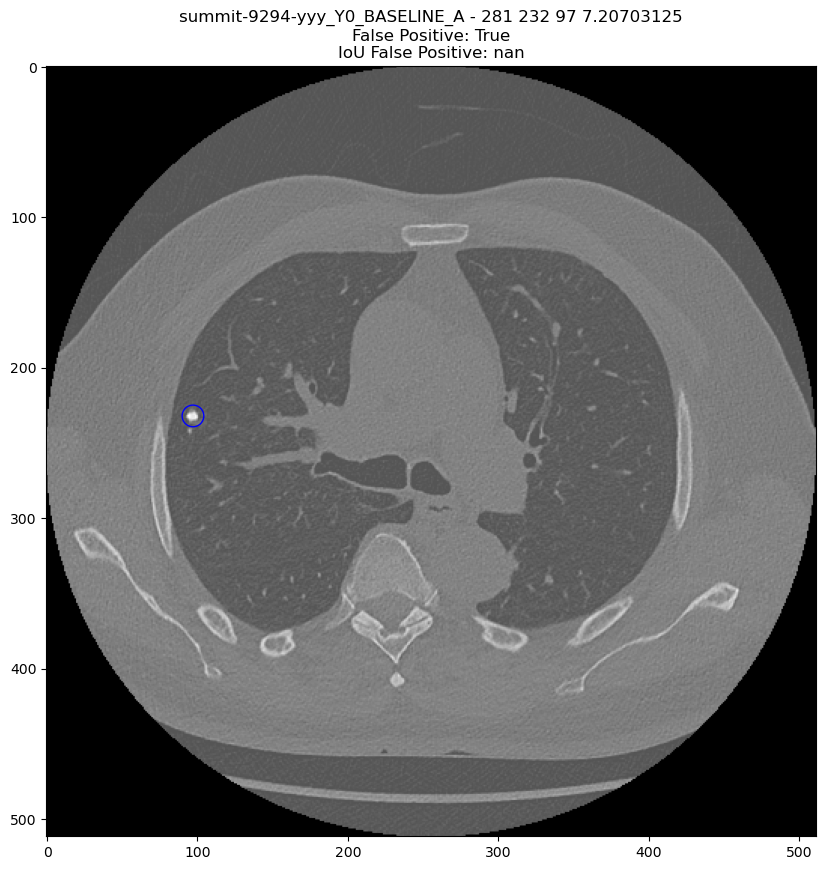

summit-4884-kgm_Y0_BASELINE_A already exists
summit-4884-kgm_Y0_BASELINE_A - 193 361 406 6.15234375
False Positive: True
IoU False Positive: nan


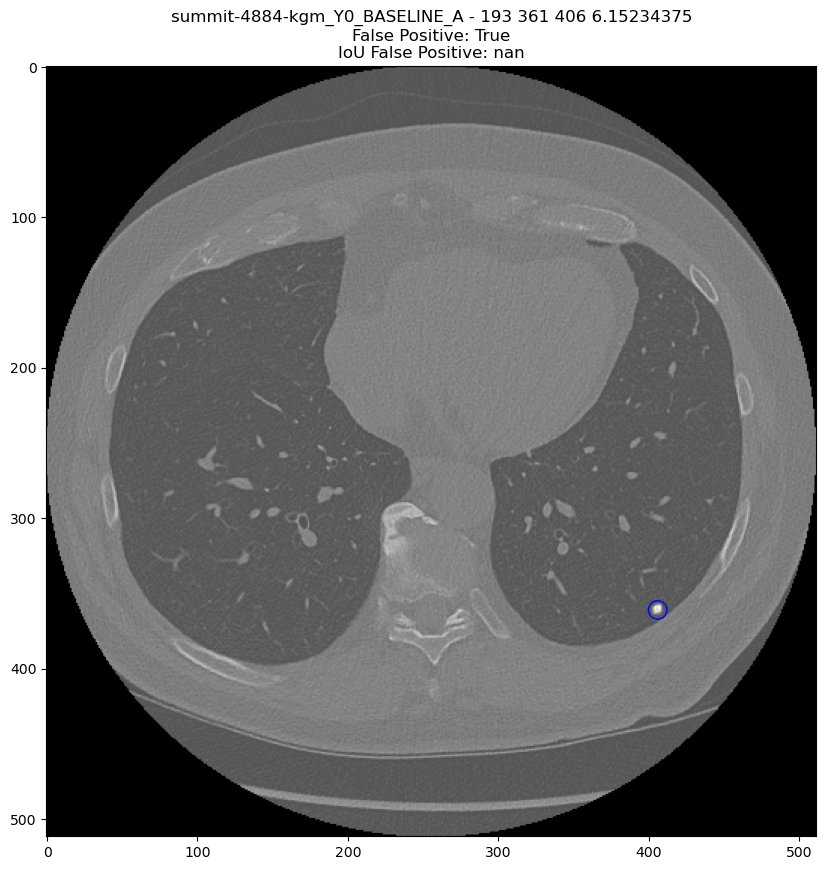

summit-7653-wpy_Y0_BASELINE_A already exists
summit-7653-wpy_Y0_BASELINE_A - 356 300 86 6.328125
False Positive: True
IoU False Positive: 0.0


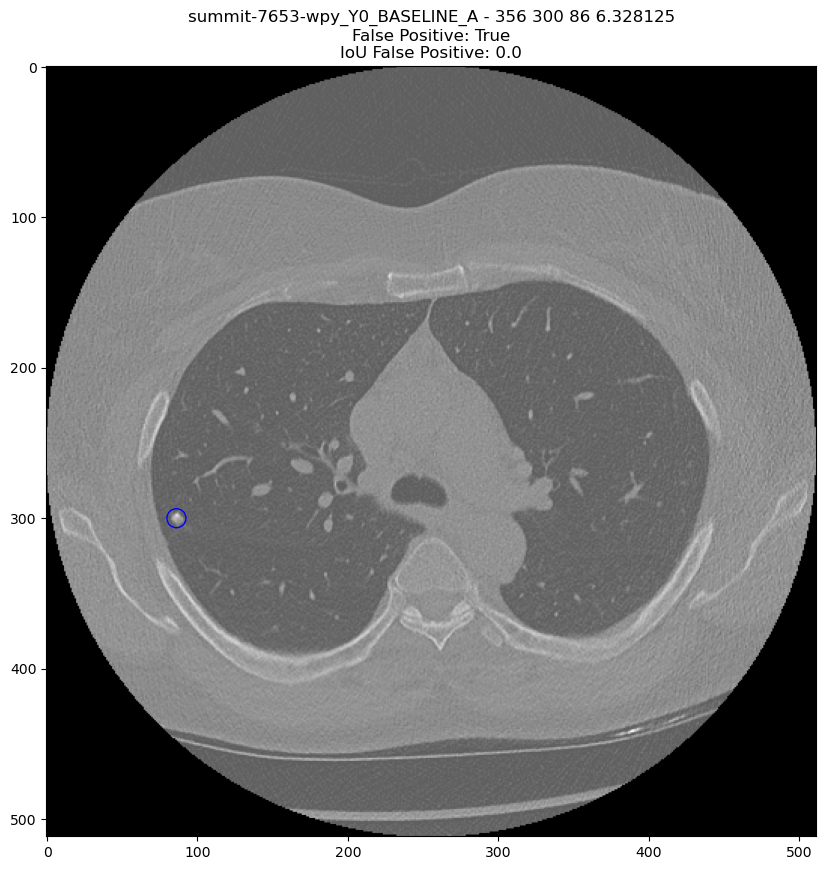

summit-3288-gfs_Y0_BASELINE_A already exists
summit-3288-gfs_Y0_BASELINE_A - 233 408 206 13.359375
False Positive: True
IoU False Positive: nan


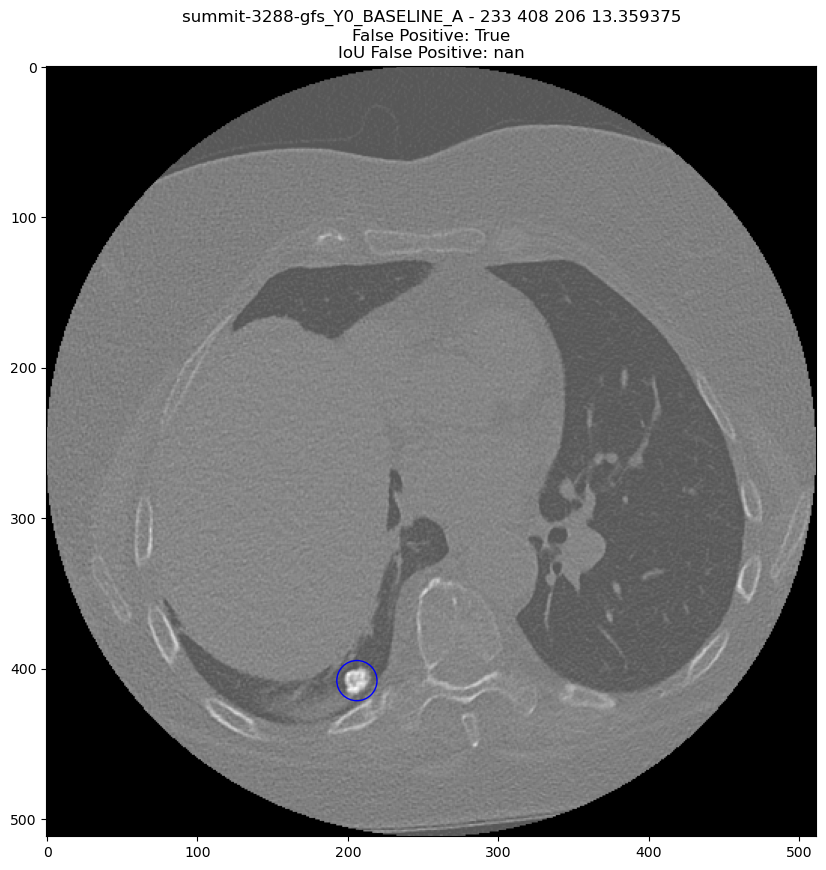

summit-3768-mgu_Y0_BASELINE_A already exists
summit-3768-mgu_Y0_BASELINE_A - 454 297 240 6.85546875
False Positive: True
IoU False Positive: 0.0


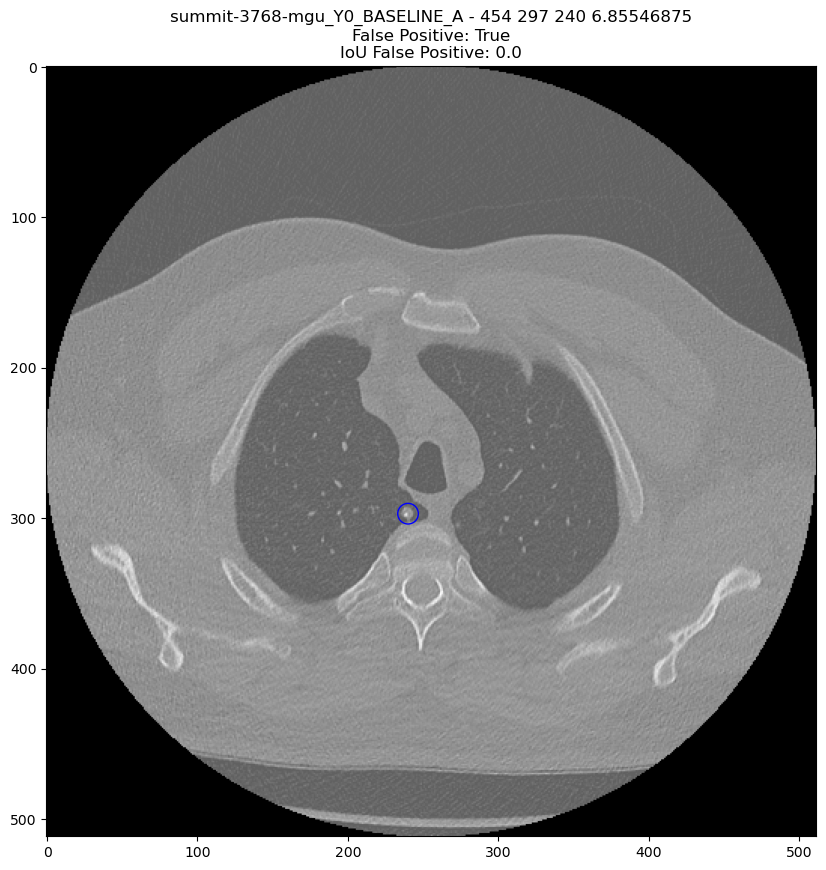

summit-8769-uas_Y0_BASELINE_A already exists
summit-8769-uas_Y0_BASELINE_A - 350 388 362 6.767578125
False Positive: True
IoU False Positive: nan


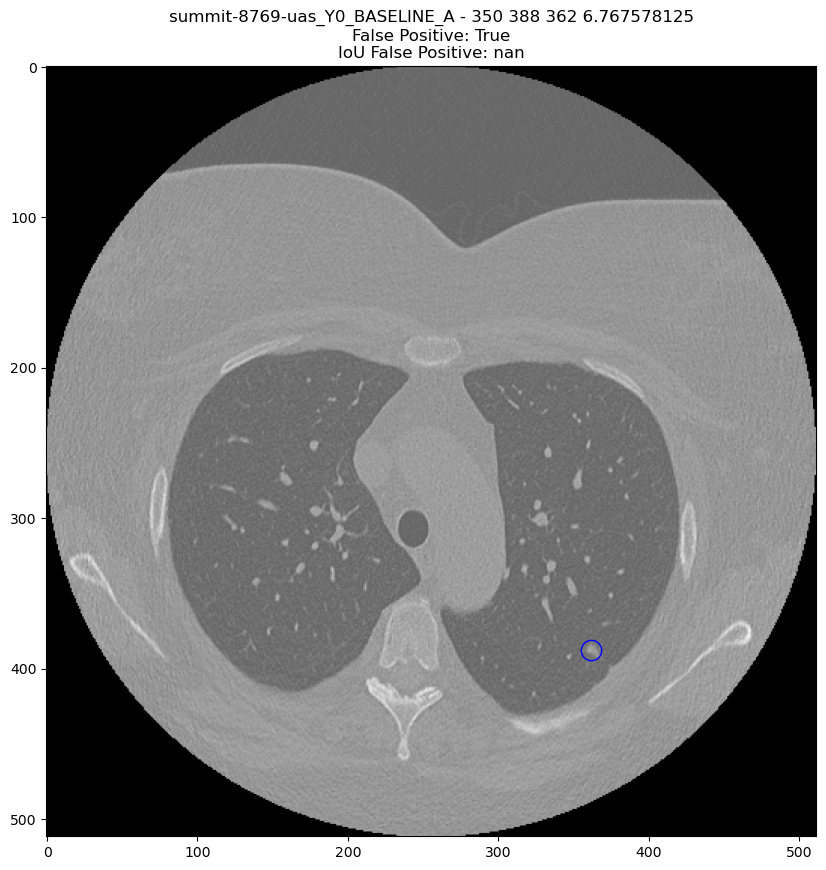

summit-8492-mxn_Y0_BASELINE_A already exists
summit-8492-mxn_Y0_BASELINE_A - 276 344 291 8.173828125
False Positive: True
IoU False Positive: 0.0


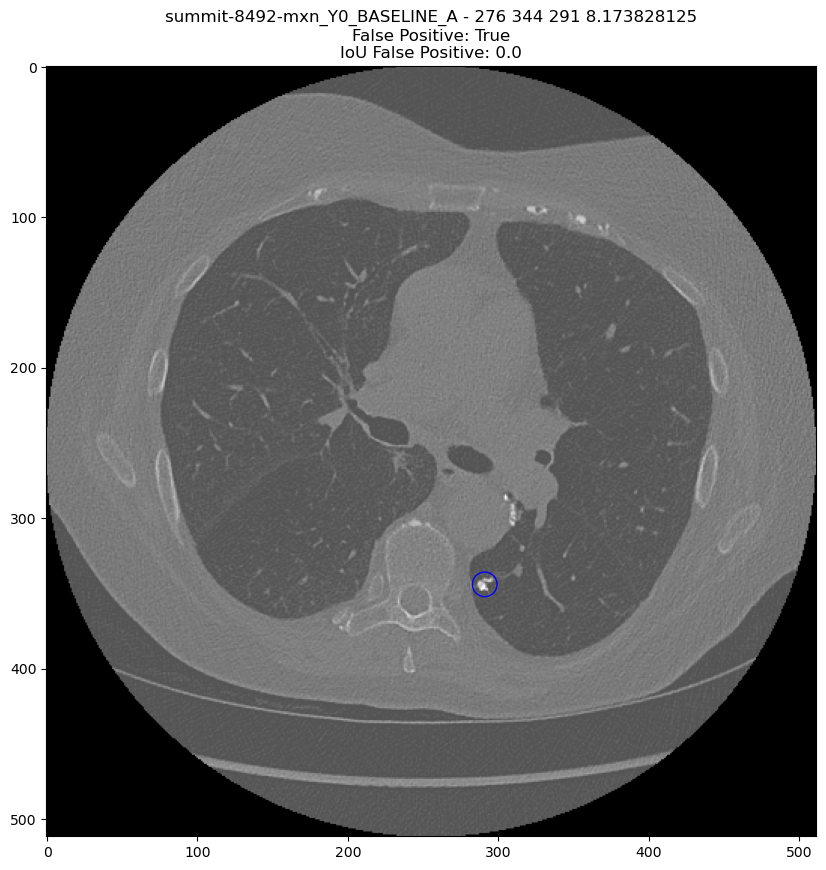

summit-3785-pcd_Y0_BASELINE_A already exists
summit-3785-pcd_Y0_BASELINE_A - 296 377 199 6.09375
False Positive: True
IoU False Positive: 0.0


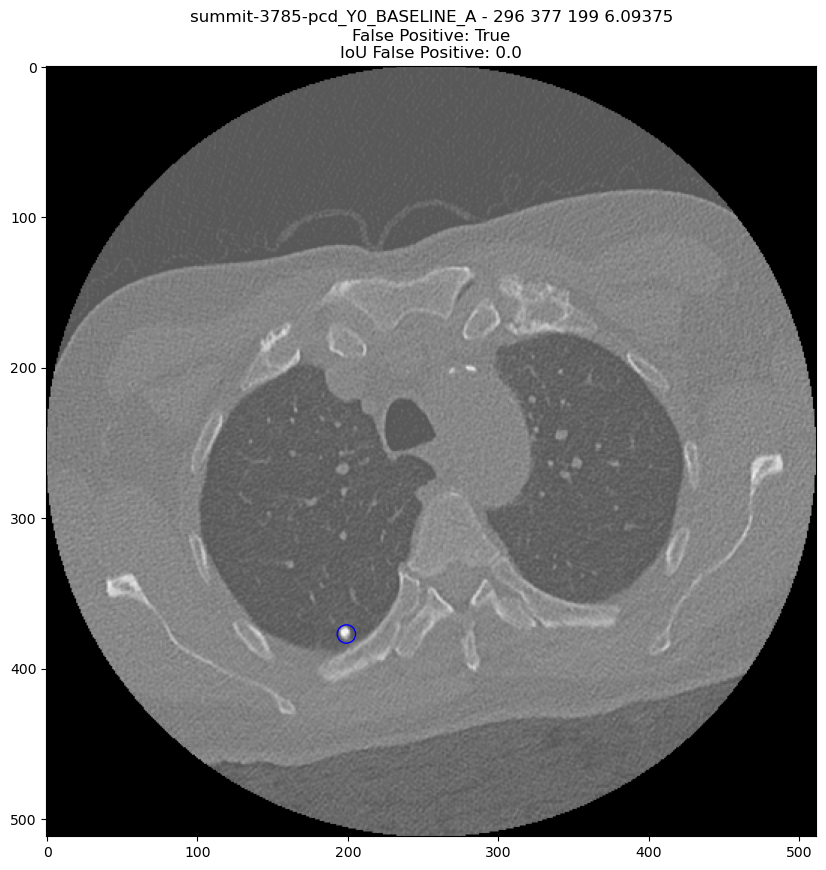

summit-3638-yab_Y0_BASELINE_A already exists
summit-3638-yab_Y0_BASELINE_A - 230 113 156 6.15234375
False Positive: True
IoU False Positive: nan


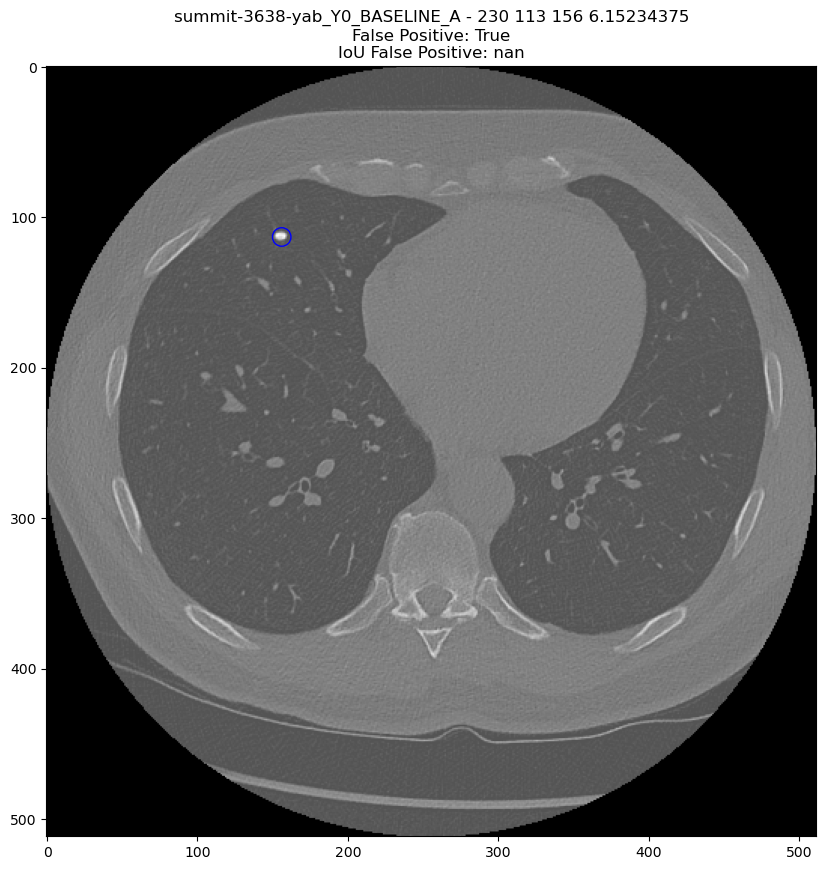

summit-6387-eye_Y0_BASELINE_A already exists
summit-6387-eye_Y0_BASELINE_A - 308 344 363 7.55859375
False Positive: True
IoU False Positive: nan


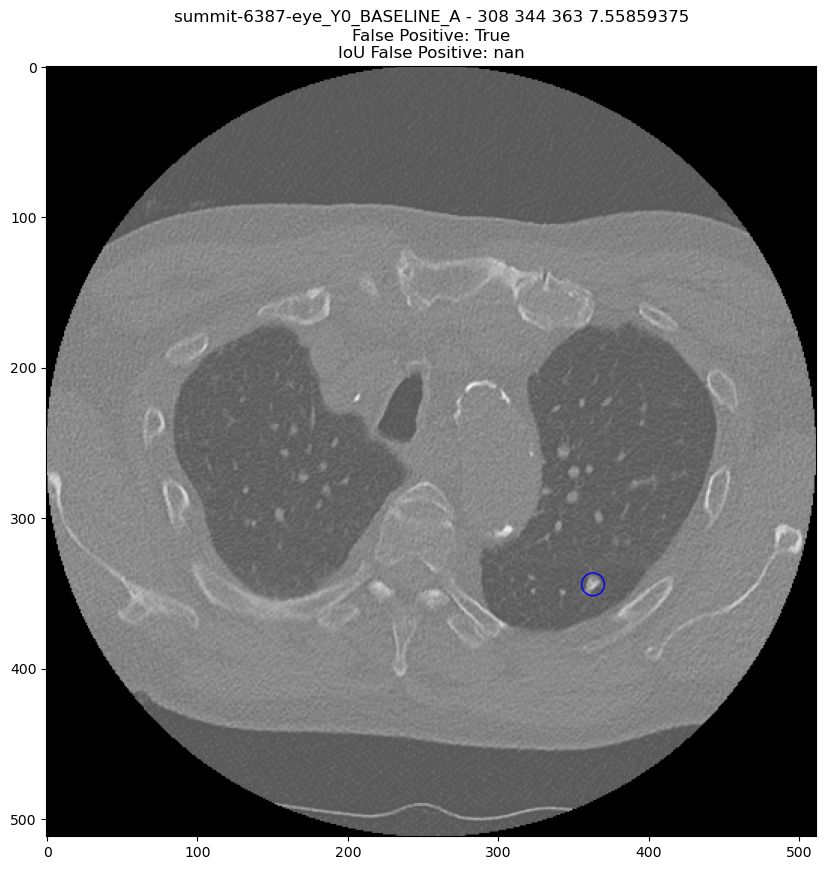

summit-6525-cdt_Y0_BASELINE_A already exists
summit-6525-cdt_Y0_BASELINE_A - 364 276 137 6.15234375
False Positive: True
IoU False Positive: nan


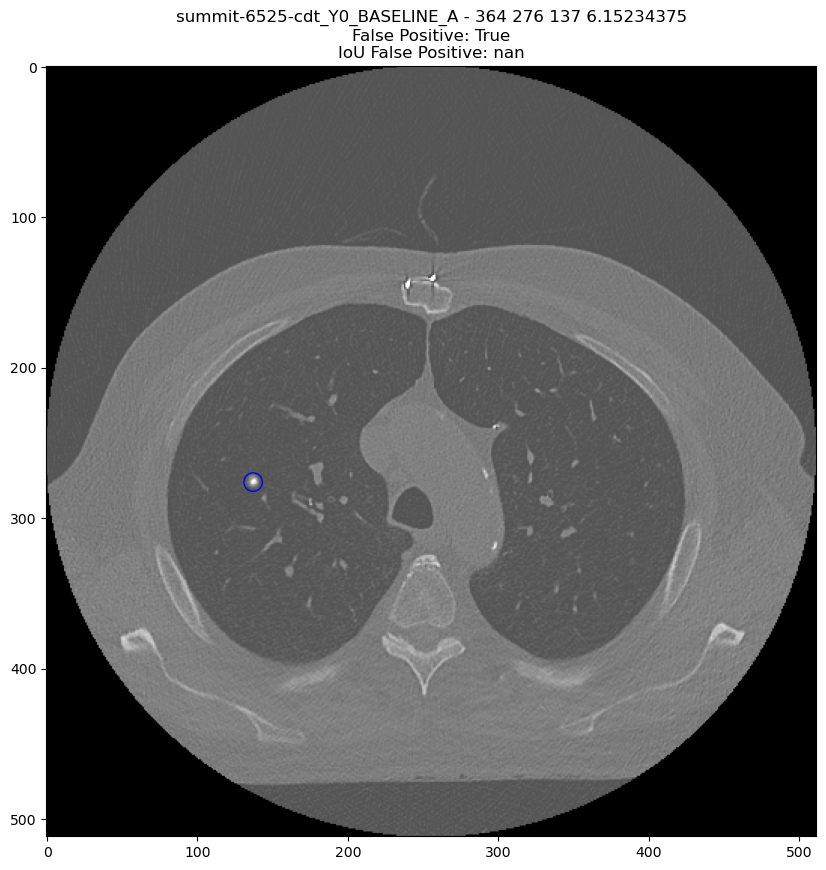

summit-9777-rvm_Y0_BASELINE_A already exists
summit-9777-rvm_Y0_BASELINE_A - 204 86 347 7.03125
False Positive: True
IoU False Positive: 0.0


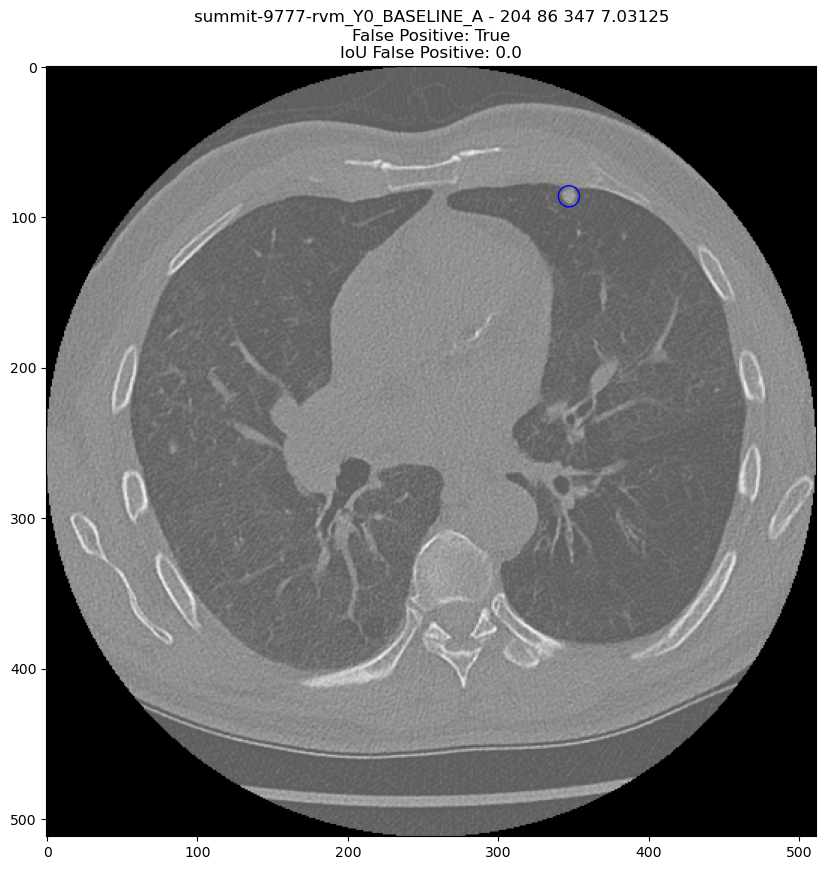

In [49]:
df = false_positives_fpps['0.125']

cnt = 0
for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    scan_id = row['name']
    study_id = scan_id.split('_')[0]
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_scan_from_cluster(scan_id)
    
    scan = SummitScan.load_scan(f'{workspace_path}/data/summit/scans/{study_id}/{scan_id}.mhd')
    irc = xyz2irc([x, y, z], scan.origin, scan.voxel_size, scan.orientation)


    show_mhd_candidate_location(scan_id, scan.image, irc.row, irc.col, irc.index, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break

In [64]:
nodule_characteristics

{'diameter_cats': ['0-6mm', '6-8mm', '8-30mm', '30-40mm', '40+mm'],
 'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'CALCIFIED'],
 'nodule_site': ['LEFT_LOWER_LOBE',
  'LEFT_MIDDLE_LOBE',
  'LEFT_UPPER_LOBE',
  'RIGHT_UPPER_LOBE',
  'RIGHT_LOWER_LOBE']}

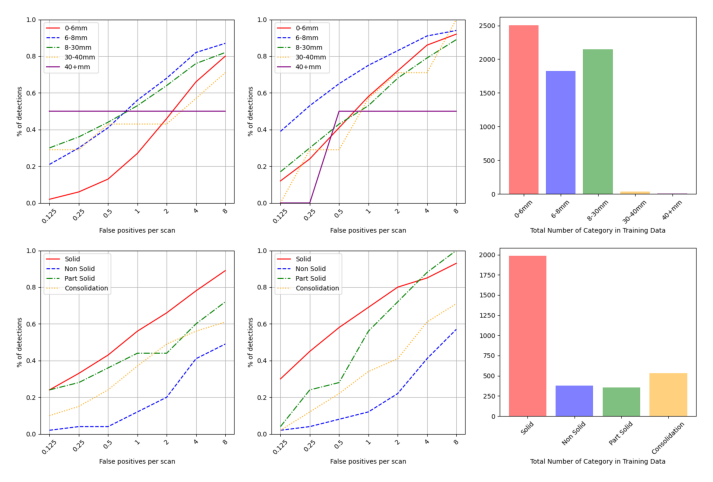

In [74]:
from PIL import Image
import matplotlib.pyplot as plt

# Read the saved images
img1 = Image.open(f'{workspace_path}/miccai_fair_ai/grt123_detected_nodule_characteristics_diameter_cats.png')
img2 = Image.open(f'{workspace_path}/miccai_fair_ai/detection_detected_nodule_characteristics_diameter_cats.png')
img3 = Image.open(f'{workspace_path}/miccai_fair_ai/grt123_detected_nodule_characteristics_diameter_cats_total.png')
img4 = Image.open(f'{workspace_path}/miccai_fair_ai/grt123_detected_nodule_characteristics_nodule_type.png')
img5 = Image.open(f'{workspace_path}/miccai_fair_ai/detection_detected_nodule_characteristics_nodule_type.png')
img6 = Image.open(f'{workspace_path}/miccai_fair_ai/grt123_detected_nodule_characteristics_nodule_type_total.png')

# Get the size of the images
width1, height1 = img1.size
width2, height2 = img2.size
width3, height3 = img3.size
width4, height4 = img4.size
width5, height5 = img5.size
width6, height6 = img6.size


# Create a new image with a size that can fit both images side by side
combined_width = width1 + width2 + width3
combined_height = max(height1, height2, height3) + max(height4, height5, height6)
combined_img = Image.new("RGB", (combined_width, combined_height))

# Paste the images into the combined image
combined_img.paste(img1, (0, 0))
combined_img.paste(img2, (width1, 0))
combined_img.paste(img3, (width1 + width2, 0))
combined_img.paste(img4, (0, height1))
combined_img.paste(img5, (width1, height2))
combined_img.paste(img6, (width1 + width2, height3))

# Save the combined image
combined_img.save(f'{workspace_path}/miccai_fair_ai/combined_plots.png')

# Display the combined image using matplotlib
fig, ax = plt.subplots(figsize=(12, 6))
ax.imshow(combined_img)
ax.axis('off')  # Hide the axis
plt.show()